#### Import/Download all the required packages

In [ ]:
# !pip install catboost
# !pip install optuna
# !pip install dython

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import confusion_matrix,classification_report
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.model_selection import StratifiedKFold
import datetime
from datetime import *
import optuna
import lightgbm as lgb
from sklearn.metrics import precision_recall_curve

#### Mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


#### Read the file

In [ ]:
df = pd.read_csv('/content/gdrive/MyDrive/Social Media_Tourism_Project/Social Media Data for DSBA.csv')

### Visual exploration

In [ ]:
df.head()

,UserID,Taken_product,Yearly_avg_view_on_travel_page,preferred_device,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,preferred_location_type,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,following_company_page,montly_avg_comment_on_company_page,working_flag,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page
0,1000001,Yes,307.0,iOS and Android,38570.0,1,2,Financial,94.0,5993,8,Yes,11,No,1,0,8
1,1000002,No,367.0,iOS,9765.0,1,1,Financial,61.0,5130,1,No,23,Yes,4,1,10
2,1000003,Yes,277.0,iOS and Android,48055.0,1,2,Other,92.0,2090,6,Yes,15,No,2,0,7
3,1000004,No,247.0,iOS,48720.0,1,4,Financial,56.0,2909,1,Yes,11,No,3,0,8
4,1000005,No,202.0,iOS and Android,20685.0,1,1,Medical,40.0,3468,9,No,12,No,4,1,6


In [ ]:
df.shape

(11760, 17)

In [ ]:
df['Taken_product'].value_counts()

No     9864
Yes    1896
Name: Taken_product, dtype: int64

### Dropping unique identifier

In [ ]:
df.drop('UserID',axis=1,inplace=True)

### Separating mobile and laptop data and renaming the target columns

In [ ]:
Laptop=df.loc[df['preferred_device'].isin(['Laptop']),:]
Mobile=df.loc[~df['preferred_device'].isin(['Laptop']),:]

In [ ]:
Laptop.drop(columns=['preferred_device'],axis=1,inplace=True)

In [ ]:
Mobile.drop('preferred_device',axis=1,inplace=True)

In [ ]:
Laptop.rename(columns={'Taken_product':'buy'},inplace=True)

In [ ]:
Mobile.rename(columns={'Taken_product':'buy'},inplace=True)

### Checking for value counts in target variable

In [ ]:
Laptop['buy'].value_counts(1)

No     0.750903
Yes    0.249097
Name: buy, dtype: float64

In [ ]:
Mobile['buy'].value_counts(1)

No     0.847916
Yes    0.152084
Name: buy, dtype: float64

### Creating the Categorical and continuous variables for Laptop dataset

In [ ]:
#Separate the numerical and categorical features

cont_col = Laptop.select_dtypes(include=[np.number]).columns.tolist()
cat_col = Laptop.select_dtypes(exclude=[np.number]).columns.tolist()

In [ ]:
cont_col

['Yearly_avg_view_on_travel_page',
 'total_likes_on_outstation_checkin_given',
 'Yearly_avg_comment_on_travel_page',
 'total_likes_on_outofstation_checkin_received',
 'week_since_last_outstation_checkin',
 'montly_avg_comment_on_company_page',
 'travelling_network_rating',
 'Adult_flag',
 'Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
cat_col

['buy',
 'yearly_avg_Outstation_checkins',
 'member_in_family',
 'preferred_location_type',
 'following_company_page',
 'working_flag']

### Replacing 'Yes' in buy column with 1 and 'No' in buy column with 0 for Laptop and Mobile


In [ ]:
Laptop['buy'] = np.where(Laptop['buy']=='Yes',1,0)
Mobile['buy'] = np.where(Mobile['buy']=='Yes',1,0)

In [ ]:
Mobile.reset_index(inplace=True)

In [ ]:
Mobile.drop('index',axis=1,inplace=True)

### Keeping copy of data 

In [ ]:
Mobile_copy = Mobile.copy()
Laptop_copy = Laptop.copy()

In [ ]:
Mobile = Mobile_copy

In [ ]:
print(Mobile_copy.shape)
print(Laptop_copy.shape)

(10652, 15)
(1108, 15)


### Dealing with an anomaly in data

In [ ]:
#Dropping the row which had * in 'yearly_avg_Outstation_checkins'
Mobile=Mobile.drop(Mobile.loc[Mobile['yearly_avg_Outstation_checkins']=='*',:].index,axis=0)

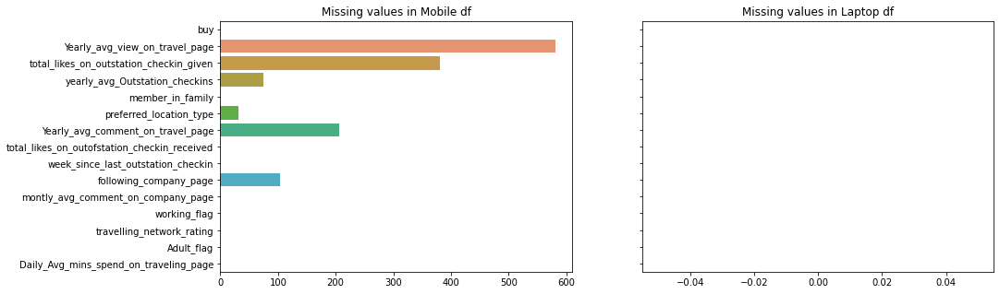

In [ ]:
fig,axes = plt.subplots(1,2,figsize=(15,5),sharey=True)
sns.barplot(x=Mobile.isnull().sum().values,y=Mobile.isnull().sum().index,ax=axes[0])
axes[0].set_title('Missing values in Mobile df')
sns.barplot(x=Laptop.isnull().sum().values,y=Laptop.isnull().sum().index,ax=axes[1])
axes[1].set_title('Missing values in Laptop df');

### Cleaning the Laptop dataset

In [ ]:
#Changing the datatypes of some of the columns 
Laptop['yearly_avg_Outstation_checkins']=Laptop['yearly_avg_Outstation_checkins'].astype('int')

In [ ]:
Laptop['member_in_family']=Laptop['member_in_family'].astype('int')

In [ ]:
Laptop['working_flag'] = np.where(Laptop['working_flag']=='Yes',1,0)
Laptop['following_company_page'] = np.where(Laptop['following_company_page']=='Yes',1,0)

In [ ]:
Laptop['Adult_flag'] = np.where((Laptop['Adult_flag'].isin([1,2,3])),1,0)

In [ ]:
Laptop['Adult_flag'].unique()

array([1, 0])

In [ ]:
Laptop.reset_index(inplace=True)

In [ ]:
Laptop.drop('index',axis=1,inplace=True)

### EDA of laptop dataset

In [ ]:
Laptop.columns

Index(['buy', 'Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'preferred_location_type', 'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin', 'following_company_page',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [ ]:
num_col = ['yearly_avg_Outstation_checkins','Yearly_avg_comment_on_travel_page','total_likes_on_outstation_checkin_given','Yearly_avg_view_on_travel_page','total_likes_on_outofstation_checkin_received','week_since_last_outstation_checkin','montly_avg_comment_on_company_page','Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
cont_col = ['buy','following_company_page','yearly_avg_Outstation_checkins','Yearly_avg_comment_on_travel_page','total_likes_on_outstation_checkin_given','Yearly_avg_view_on_travel_page','member_in_family','total_likes_on_outofstation_checkin_received','week_since_last_outstation_checkin','montly_avg_comment_on_company_page','working_flag','travelling_network_rating','Adult_flag','Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
discrete_col = ['buy','following_company_page','member_in_family','working_flag','travelling_network_rating','Adult_flag']

In [ ]:
cat_col = ['preferred_location_type']

In [ ]:
#1. What is the distribution of every numerical feature against each of the two categories in buy column?

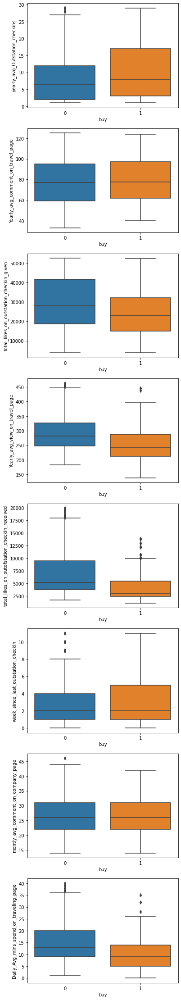

In [ ]:
fig,axes = plt.subplots(len(num_col),1,figsize=(6,40))
for i in range(len(num_col)):
    sns.boxplot(x=Laptop['buy'],y=Laptop[num_col[i]],ax=axes[i])

In [ ]:
#2. Distribution of each of the numerical column

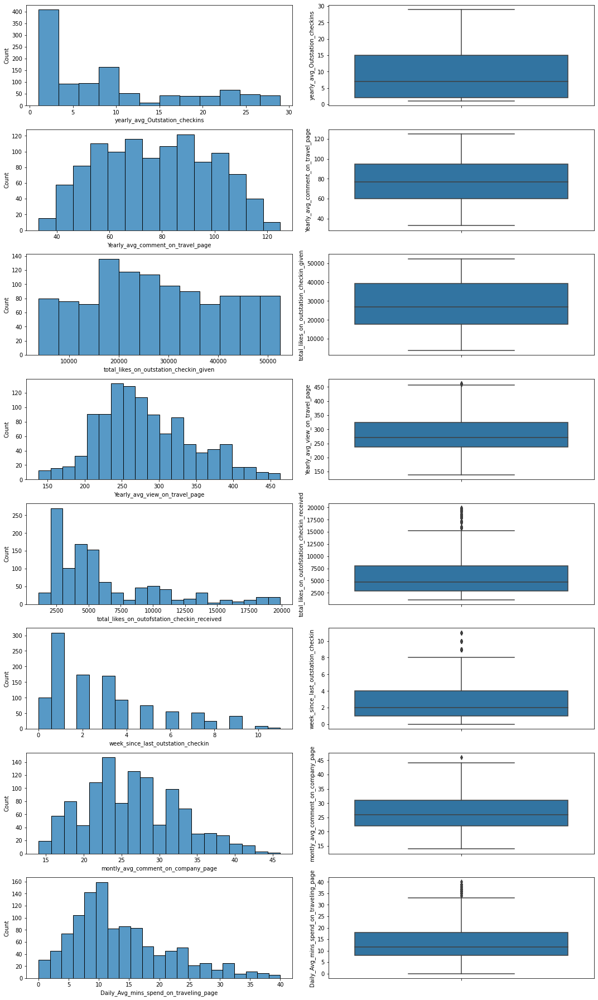

In [ ]:
fig,axes = plt.subplots(len(num_col),2,figsize=(15,25))
for i in range(len(num_col)):
    m=0
    sns.histplot(data=Laptop,x=num_col[i],ax=axes[i][m])
    m+=1
    sns.boxplot(data=Laptop,y=num_col[i],ax=axes[i][m])
plt.tight_layout()

In [ ]:
#3. Cross-analysis between categorical column and continuous columns

In [ ]:
cont_col

['buy',
 'following_company_page',
 'yearly_avg_Outstation_checkins',
 'Yearly_avg_comment_on_travel_page',
 'total_likes_on_outstation_checkin_given',
 'Yearly_avg_view_on_travel_page',
 'member_in_family',
 'total_likes_on_outofstation_checkin_received',
 'week_since_last_outstation_checkin',
 'montly_avg_comment_on_company_page',
 'working_flag',
 'travelling_network_rating',
 'Adult_flag',
 'Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
cat_col

['preferred_location_type']

In [ ]:
def analysis_of_cat_features(var1,var2):
    fig,axes = plt.subplots(1,2,figsize=(14,5))
    sns.boxplot(x=Laptop[var1],y=Laptop[var2],ax=axes[0])
    axes[0].set_title('Boxplot of {} against {}'.format(var1,var2))
    sns.countplot(x=Laptop[var1],ax=axes[1],hue=Laptop['buy'])
    axes[1].set_title('Countplot of {} by whether they bought product or not'.format(var1))
    plt.tight_layout()

In [ ]:
Laptop.columns

Index(['buy', 'Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'preferred_location_type', 'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin', 'following_company_page',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [ ]:
Laptop['comments_by_views'] = np.round((Laptop['Yearly_avg_comment_on_travel_page']/Laptop['Yearly_avg_view_on_travel_page']),3)

In [ ]:
Laptop.drop('comments_by_views',axis=1,inplace=True)

In [ ]:
Laptop['views_by_comments'] = np.round((Laptop['Yearly_avg_view_on_travel_page']/Laptop['Yearly_avg_comment_on_travel_page']),3)

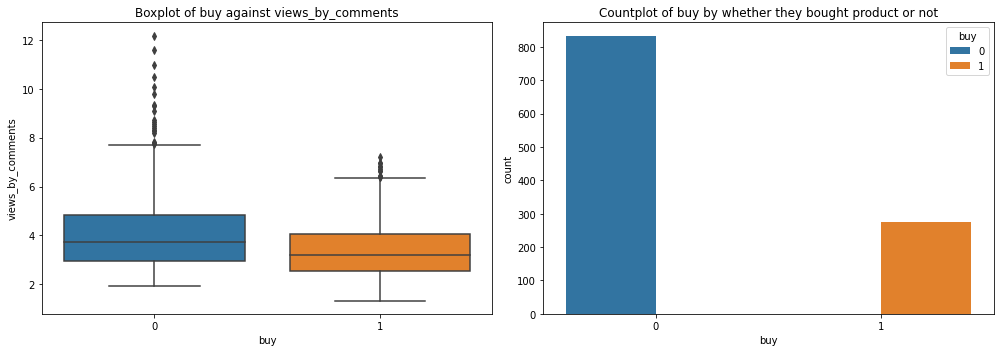

In [ ]:
analysis_of_cat_features('buy','views_by_comments')

In [ ]:
Laptop.groupby(['travelling_network_rating','buy']).agg({'buy':'count'}).groupby(level=0).apply(lambda x:np.round(100 * x / float(x.sum()),2))

buy
travelling_network_rating buy       
1                         0    64.00
                          1    36.00
2                         0    75.51
                          1    24.49
3                         0    75.82
                          1    24.18
4                         0    80.46
                          1    19.54

In [ ]:
#Insight : Among our customers, 84% are non-working
Laptop.groupby(['buy','working_flag']).agg({'working_flag':'count'}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

working_flag
buy working_flag              
0   0                83.173077
    1                16.826923
1   0                84.057971
    1                15.942029

In [ ]:
#1. Majority of users preferring Hill station and trekking location type have been our customers
#2. 58% of users following company page are not buying from us
#3. Only ~17% of adult users are buying from us whereas ~35% of non-adult users are buying from us
#4. Only 10% of users who have mentioned 5 members in their family as per their information on the platform have bought from us
#5. 36% of users who have highest close friends who also like traveling are buying from us. There can be some referral programs for such kind of users
#to promote further sales


In [ ]:
#4. Correlation

In [ ]:
#!pip install dython

In [ ]:
from dython import nominal

<Figure size 1440x3600 with 0 Axes>

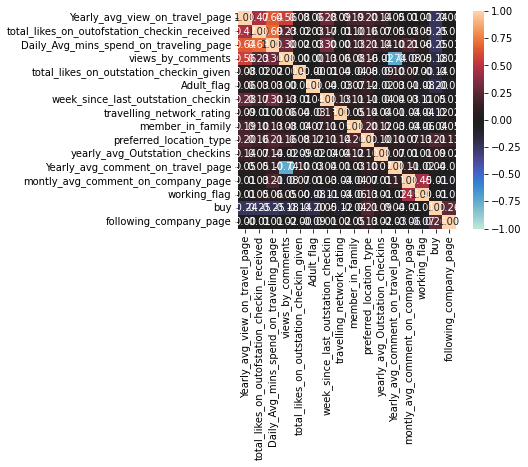

In [ ]:
from dython.nominal import associations
plt.figure(figsize=(20,50))
assoc=associations(Laptop,plot=False,clustering=True)
correlations=assoc['corr']
#correlations,_=cluster_correlations(correlations)

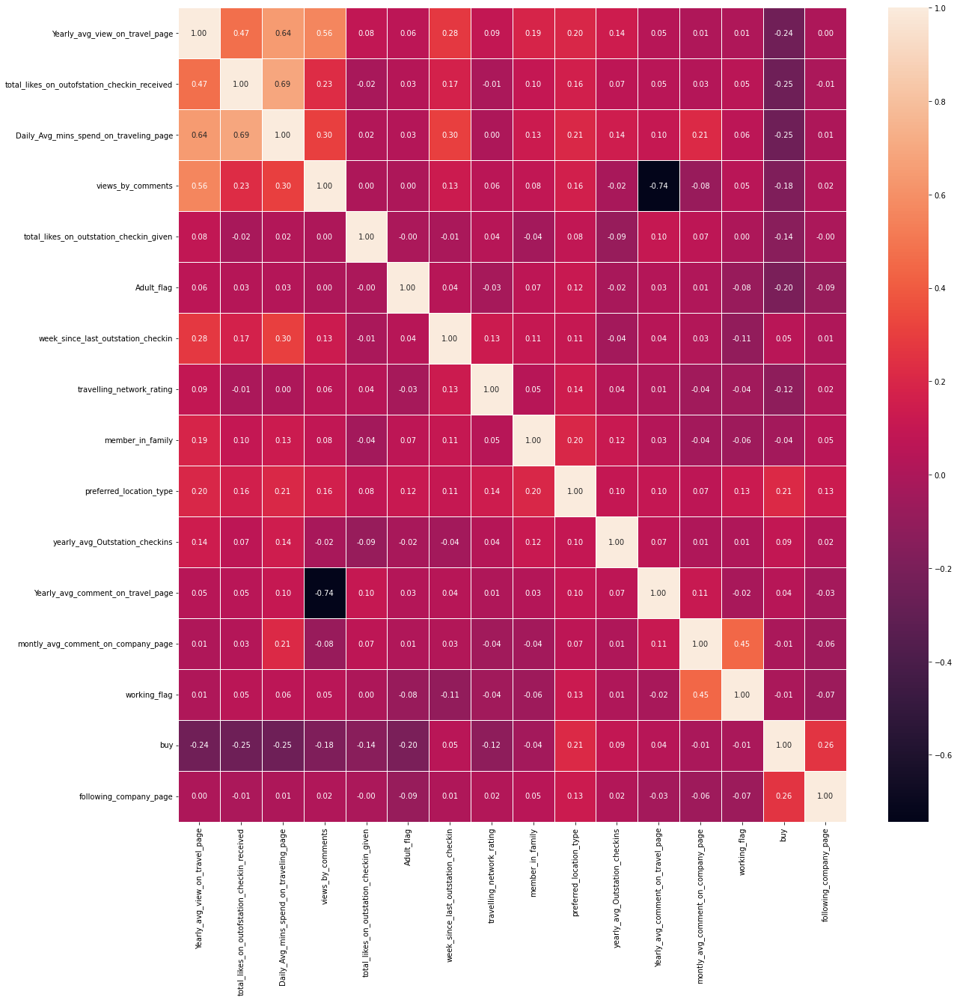

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(assoc["corr"],annot=True,fmt='.2f',cbar=True,lw=0.5);

In [ ]:
assoc["corr"]["Yearly_avg_comment_on_travel_page"].sort_values(ascending=False)

Yearly_avg_comment_on_travel_page               1.000000
montly_avg_comment_on_company_page              0.109678
Daily_Avg_mins_spend_on_traveling_page          0.104176
total_likes_on_outstation_checkin_given         0.102823
preferred_location_type                         0.101277
yearly_avg_Outstation_checkins                  0.072135
total_likes_on_outofstation_checkin_received    0.051196
Yearly_avg_view_on_travel_page                  0.046342
week_since_last_outstation_checkin              0.043860
buy                                             0.041578
Adult_flag                                      0.031344
member_in_family                                0.026783
travelling_network_rating                       0.007964
working_flag                                   -0.019067
following_company_page                         -0.034019
views_by_comments                              -0.742797
Name: Yearly_avg_comment_on_travel_page, dtype: float64

In [ ]:
#Type of customer
#1. Whether they are working
#2. Whether they are adult
#3. number of members in family
#4. traveling network rating
#5. preferred location type
#6. following_company_page

In [ ]:
#Social media usage of customers
#1.Yearly_avg_view_on_travel_page
#2.total_likes_on_outstation_checkin_given
#3.Yearly_avg_comment_on_travel_page
#4.montly_avg_comment_on_company_page
#5.Daily_Avg_mins_spend_on_traveling_page

In [ ]:
#How much do they travel?
#1. total_likes_on_outofstation_checkin_received
#2. week_since_last_outstation_checkin

In [ ]:
#6. Users not buying from us have received more 60% out-of-station checkins. This implies the users not buying from us travel quite
#often
Laptop.groupby('buy').agg({'total_likes_on_outofstation_checkin_received':'mean'})

,total_likes_on_outofstation_checkin_received
buy,
0,6860.567308
1,4314.376812


In [ ]:
non_working = Laptop.loc[Laptop['working_flag']==0,:]

In [ ]:
working = Laptop.loc[Laptop['working_flag']==1,:]

#### Analysing the social media usage of working and non-working users

In [ ]:
# 85% of our customers are non-working

In [ ]:
buy = Laptop.loc[Laptop['buy']==1,:]

In [ ]:
buy.groupby('working_flag').agg({'working_flag':"count"}).apply(lambda x:100*x/(float(x.sum())))

,working_flag
working_flag,
0,84.057971
1,15.942029


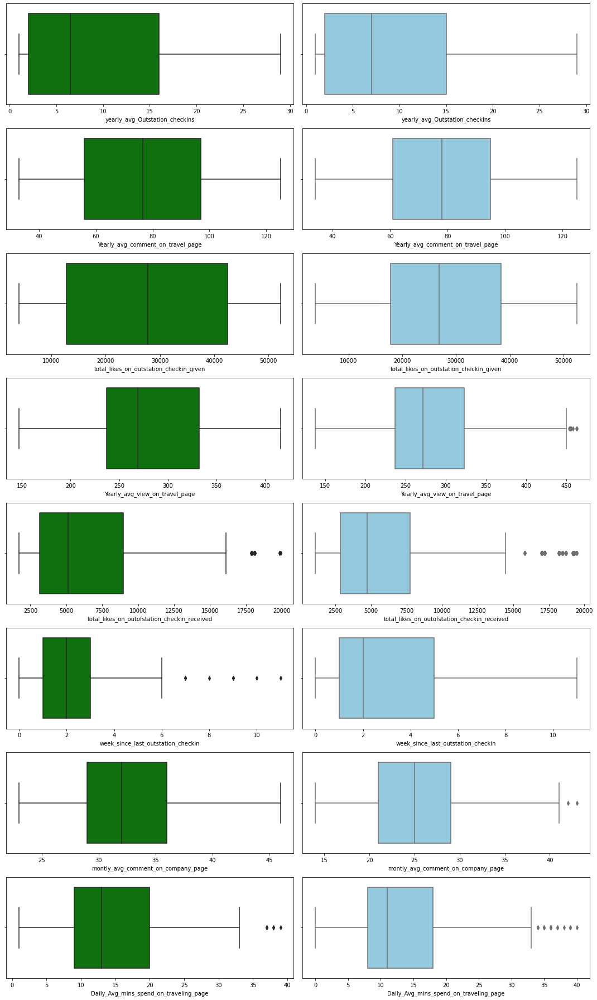

In [ ]:
fig,axes = plt.subplots(len(num_col),2,figsize=(15,25))
for i in range(len(num_col)):
    m=0
    sns.boxplot(data=working,x=num_col[i],ax=axes[i][m],color='green')
    m+=1
    sns.boxplot(data=non_working,x=num_col[i],ax=axes[i][m],color='skyblue')
plt.tight_layout()

In [ ]:
#Insight : 69% of users making monthly avg comment on company page are not following us
Laptop.groupby('following_company_page').agg({'montly_avg_comment_on_company_page':'count'}).apply(lambda x:100*x/(float(x.sum())))

,montly_avg_comment_on_company_page
following_company_page,
0,68.953069
1,31.046931


#### Analysing the social media usage of adult and non-adult customers

In [ ]:
adult = Laptop.loc[Laptop['Adult_flag']==1,:]
non_adult = Laptop.loc[Laptop['Adult_flag']==0,:]

In [ ]:
buy.groupby('Adult_flag').agg({'Adult_flag':"count"}).apply(lambda x:100*x/(float(x.sum())))

,Adult_flag
Adult_flag,
0,60.869565
1,39.130435


In [ ]:
#60% of our customers are not adult

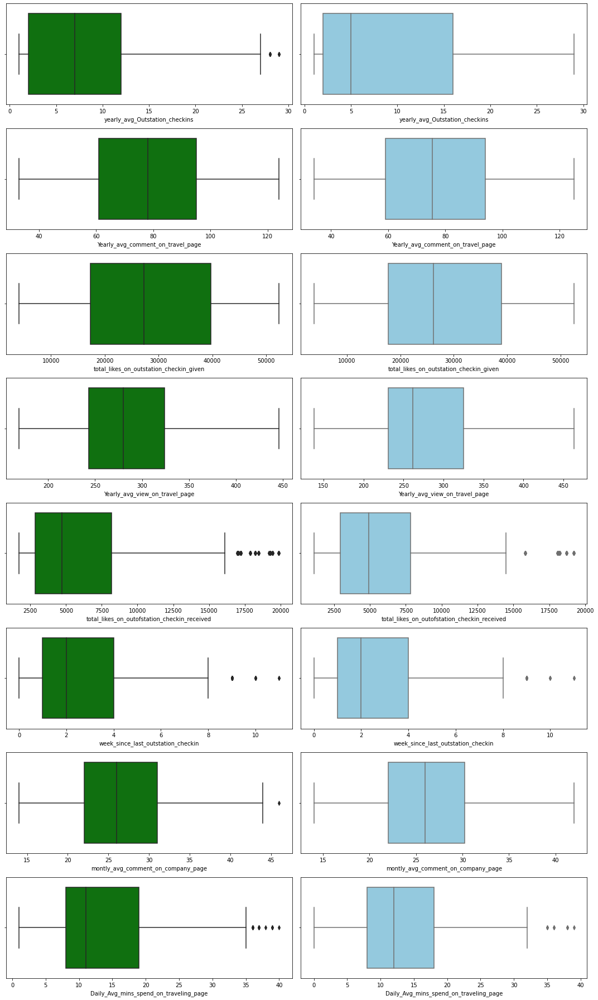

In [ ]:
fig,axes = plt.subplots(len(num_col),2,figsize=(15,25))
for i in range(len(num_col)):
    m=0
    sns.boxplot(data=adult,x=num_col[i],ax=axes[i][m],color='green')
    m+=1
    sns.boxplot(data=non_adult,x=num_col[i],ax=axes[i][m],color='skyblue')
plt.tight_layout()

### **Final insights after EDA on Laptop dataset**

In [ ]:
#1. Majority of users preferring Hill station and trekking location type have been our customers
#2. 58% of users following company page are not buying from us
#3. Only ~17% of adult users are buying from us whereas ~35% of non-adult users are buying from us
#4. Only 10% of users who have mentioned 5 members in their family as per their information on the platform have bought from us
#5. 36% of users who have highest close friends who also like traveling are buying from us. There can be some referral programs for such kind of users
#to promote further sales
#6. 69% of users making monthly avg comment on company page are not following us
#7. 85% of our customers are non-working

#### Exploration of Mobile dataset

In [ ]:
Mobile = Mobile_copy.copy()

In [ ]:
Mobile=Mobile.drop(Mobile.loc[Mobile['yearly_avg_Outstation_checkins']=='*',:].index,axis=0)

In [ ]:
Mobile.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10651 entries, 0 to 10651
Data columns (total 15 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   buy                                           10651 non-null  int64  
 1   Yearly_avg_view_on_travel_page                10070 non-null  float64
 2   total_likes_on_outstation_checkin_given       10270 non-null  float64
 3   yearly_avg_Outstation_checkins                10576 non-null  object 
 4   member_in_family                              10651 non-null  object 
 5   preferred_location_type                       10620 non-null  object 
 6   Yearly_avg_comment_on_travel_page             10445 non-null  float64
 7   total_likes_on_outofstation_checkin_received  10651 non-null  int64  
 8   week_since_last_outstation_checkin            10651 non-null  int64  
 9   following_company_page                        10548 non-null 

In [ ]:
Mobile.head()

,buy,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,preferred_location_type,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,following_company_page,montly_avg_comment_on_company_page,working_flag,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page
0,1,307.0,38570.0,1,2,Financial,94.0,5993,8,Yes,11,No,1,0,8
1,0,367.0,9765.0,1,1,Financial,61.0,5130,1,No,23,Yes,4,1,10
2,1,277.0,48055.0,1,2,Other,92.0,2090,6,Yes,15,No,2,0,7
3,0,247.0,48720.0,1,4,Financial,56.0,2909,1,Yes,11,No,3,0,8
4,0,202.0,20685.0,1,1,Medical,40.0,3468,9,No,12,No,4,1,6


In [ ]:
Mobile.isnull().sum()

buy                                               0
Yearly_avg_view_on_travel_page                  581
total_likes_on_outstation_checkin_given         381
yearly_avg_Outstation_checkins                   75
member_in_family                                  0
preferred_location_type                          31
Yearly_avg_comment_on_travel_page               206
total_likes_on_outofstation_checkin_received      0
week_since_last_outstation_checkin                0
following_company_page                          103
montly_avg_comment_on_company_page                0
working_flag                                      0
travelling_network_rating                         0
Adult_flag                                        0
Daily_Avg_mins_spend_on_traveling_page            0
dtype: int64

### Cleaning the Mobile Dataset

#### Checking the number of outliers in the mobile dataset

In [ ]:
def number_of_outliers(df):
    IQR = df.quantile(0.75) - df.quantile(0.25)
    Number = ((df > (df.quantile(0.75)+(1.5*IQR))) | (df < (df.quantile(0.25)-(1.5*IQR)))).sum()
    Outlier = ((df > (df.quantile(0.75)+(1.5*IQR))) | (df < (df.quantile(0.25)-(1.5*IQR))))
    dataframe = pd.DataFrame({"Number of Outliers":Number})
    return (dataframe.sort_values(by="Number of Outliers",ascending=False))

In [ ]:
num_col

['yearly_avg_Outstation_checkins',
 'Yearly_avg_comment_on_travel_page',
 'total_likes_on_outstation_checkin_given',
 'Yearly_avg_view_on_travel_page',
 'total_likes_on_outofstation_checkin_received',
 'week_since_last_outstation_checkin',
 'montly_avg_comment_on_company_page',
 'Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
number_of_outliers(Mobile[num_col])

,Number of Outliers
total_likes_on_outofstation_checkin_received,856
Daily_Avg_mins_spend_on_traveling_page,324
montly_avg_comment_on_company_page,238
Yearly_avg_comment_on_travel_page,40
Yearly_avg_view_on_travel_page,10
total_likes_on_outstation_checkin_given,4
week_since_last_outstation_checkin,0
yearly_avg_Outstation_checkins,0


#### Making changes to the datatypes of some features 

In [ ]:
obj_data_types = []
for i in Mobile.columns:
    if Mobile[i].dtypes=='object':
        obj_data_types.append(i)

In [ ]:
obj_data_types

['yearly_avg_Outstation_checkins',
 'member_in_family',
 'preferred_location_type',
 'following_company_page',
 'working_flag']

In [ ]:
for i in obj_data_types:
    print('{}.{}'.format(i,Mobile[i].unique()))
    print('---')

yearly_avg_Outstation_checkins.['1' '24' '23' '27' '16' '15' '26' '19' '21' '11' '10' '25' '12' '18' '29'
 nan '22' '14' '20' '28' '17' '13' '5' '2' '3' '9' '7' '6' '8' '4']
---
member_in_family.['2' '1' '4' 'Three' '3' '5' '10']
---
preferred_location_type.['Financial' 'Other' 'Medical' nan 'Game' 'Social media' 'Entertainment'
 'Tour and Travel' 'Movie' 'OTT' 'Tour  Travel' 'Beach' 'Historical site'
 'Big Cities' 'Trekking' 'Hill Stations']
---
following_company_page.['Yes' 'No' nan '1' '0']
---
working_flag.['No' 'Yes']
---


In [ ]:
Mobile['yearly_avg_Outstation_checkins'].fillna(value=0,inplace=True)

In [ ]:
Mobile['yearly_avg_Outstation_checkins'] = Mobile['yearly_avg_Outstation_checkins'].astype('int')

In [ ]:
Mobile['yearly_avg_Outstation_checkins'] = np.where(Mobile['yearly_avg_Outstation_checkins']==0,np.NaN,Mobile['yearly_avg_Outstation_checkins'])

In [ ]:
Mobile['member_in_family'].replace(to_replace='Three',value='3',inplace=True)

In [ ]:
Mobile['member_in_family'] = Mobile['member_in_family'].astype('int')

In [ ]:
Mobile['member_in_family'].unique()

array([ 2,  1,  4,  3,  5, 10])

In [ ]:
Mobile['working_flag'] = np.where(Mobile['working_flag'].isin(['Yes','1']),1,np.where(Mobile['working_flag'].isin(['No','0']),0,Mobile['working_flag']))

In [ ]:
Mobile['working_flag'].unique()

array([0, 1], dtype=object)

In [ ]:

Mobile['working_flag'] = Mobile['working_flag'].astype('int')

In [ ]:
Mobile['following_company_page'] = np.where(Mobile['following_company_page'].isin(['Yes','1']),1,np.where(Mobile['following_company_page'].isin(['No','0']),0,Mobile['following_company_page']))

In [ ]:
Mobile['following_company_page'].unique()

array([1, 0, nan], dtype=object)

In [ ]:
Mobile['following_company_page'].fillna(value=2,inplace=True)

In [ ]:
Mobile['following_company_page'] = Mobile['following_company_page'].astype('int')

In [ ]:
Mobile['following_company_page'].replace(to_replace=2,value=np.NaN,inplace=True)

In [ ]:
for i in obj_data_types:
    print('{}.{}'.format(i,Mobile[i].unique()))
    print('---')

yearly_avg_Outstation_checkins.[ 1. 24. 23. 27. 16. 15. 26. 19. 21. 11. 10. 25. 12. 18. 29. nan 22. 14.
 20. 28. 17. 13.  5.  2.  3.  9.  7.  6.  8.  4.]
---
member_in_family.[ 2  1  4  3  5 10]
---
preferred_location_type.['Financial' 'Other' 'Medical' nan 'Game' 'Social media' 'Entertainment'
 'Tour and Travel' 'Movie' 'OTT' 'Tour  Travel' 'Beach' 'Historical site'
 'Big Cities' 'Trekking' 'Hill Stations']
---
following_company_page.[ 1.  0. nan]
---
working_flag.[0 1]
---


### Correlation for Mobile dataset

<Figure size 1440x3600 with 0 Axes>

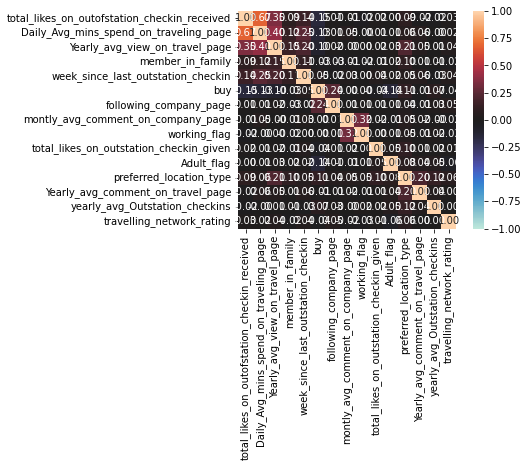

In [ ]:
from dython.nominal import associations
plt.figure(figsize=(20,50))
assoc=associations(Mobile,plot=False,clustering=True)
correlations=assoc['corr']
#correlations,_=cluster_correlations(correlations)

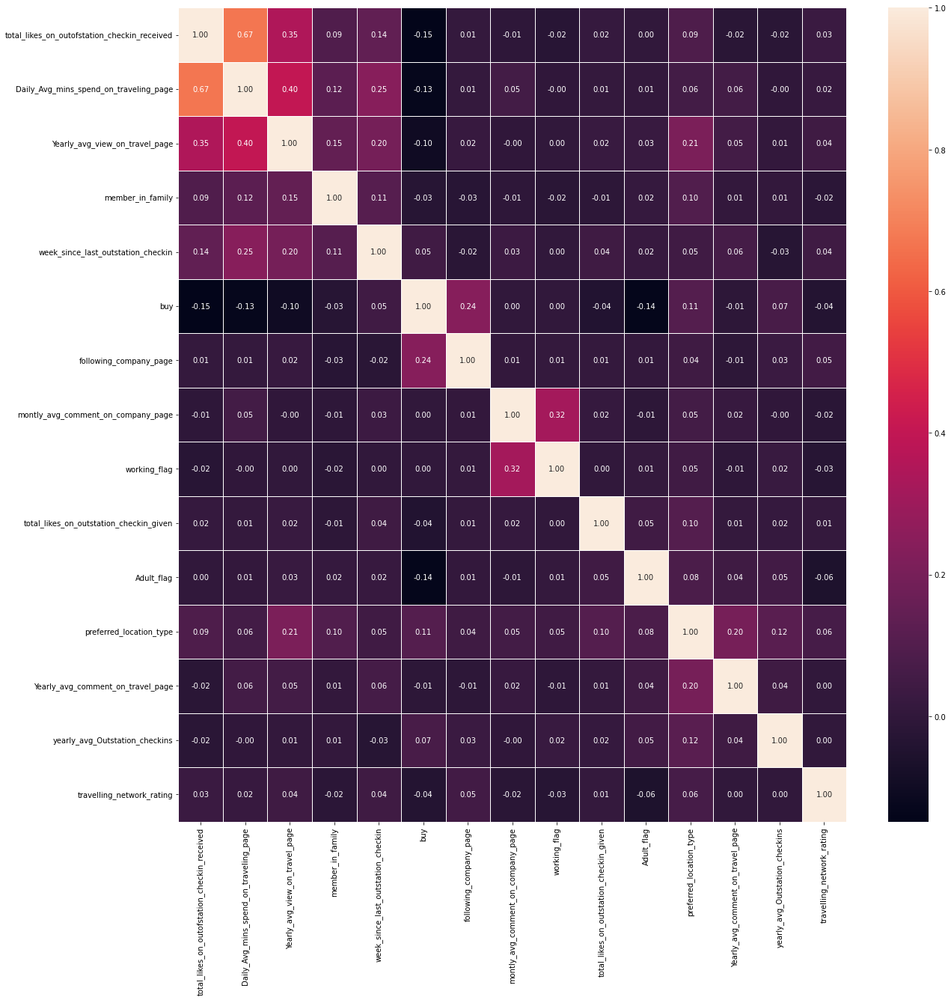

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(assoc["corr"],annot=True,fmt='.2f',cbar=True,lw=0.5);

In [ ]:
assoc["corr"]["Yearly_avg_comment_on_travel_page"].sort_values(ascending=False)

Yearly_avg_comment_on_travel_page               1.000000
preferred_location_type                         0.198094
week_since_last_outstation_checkin              0.058327
Daily_Avg_mins_spend_on_traveling_page          0.056815
Yearly_avg_view_on_travel_page                  0.053707
Adult_flag                                      0.043096
yearly_avg_Outstation_checkins                  0.039944
montly_avg_comment_on_company_page              0.020770
total_likes_on_outstation_checkin_given         0.009732
member_in_family                                0.007077
travelling_network_rating                       0.000282
working_flag                                   -0.008783
following_company_page                         -0.013601
buy                                            -0.013934
total_likes_on_outofstation_checkin_received   -0.019350
Name: Yearly_avg_comment_on_travel_page, dtype: float64

### Missing value imputation for Mobile Dataset

In [ ]:
Mobile.isnull().sum()[Mobile.isnull().sum()!=0]

Yearly_avg_view_on_travel_page             581
total_likes_on_outstation_checkin_given    381
yearly_avg_Outstation_checkins              75
preferred_location_type                     31
Yearly_avg_comment_on_travel_page          206
following_company_page                     103
dtype: int64

In [ ]:
Mobile_missing = Mobile.copy()

In [ ]:
def missing_value_imputation(var,Mobile):
    df = Mobile.drop('buy',axis=1)
    if (df[var].dtypes=='int')|(df[var].dtypes=='float'):
        null_cols=[]
        for i in Mobile.columns:
            if Mobile[i].isnull().sum()!=0:
                null_cols.append(i)
        
        null_cols.remove(var)
        cols1 = []
        for i in df.columns:
            if i not in null_cols:
                cols1.append(i)
        
        train=df.loc[df[var].isna()!=True,cols1]
        
        cols2 = cols1.copy()
        
        cols2.remove(var)
        
        test=df.loc[df[var].isna()==True,cols2]
        
        from catboost import CatBoostRegressor,Pool,CatBoostClassifier

        cb = CatBoostRegressor(verbose=False)
        
        cat_col=train.select_dtypes(exclude=['int','float']).columns.tolist()
        
        X_train = train.drop(var,axis=1)
        Y_train = train[var]
        X_test = test
        cnt=0
        for i in cat_col:
            if i in X_train.columns:
                cnt+=1
        if cnt!=0:
            pool_train = Pool(X_train,Y_train,cat_features=cat_col)
        else:
            pool_train = Pool(X_train,Y_train)
        
        cb.fit(pool_train,plot=False)
        pred = cb.predict(X_test)
        pred = np.round(pred,0)
        test[var] = pred
        
        final_df=pd.concat([train,test],axis=0)

        cols3 = []
        for i in Mobile.columns:
            if i not in final_df.columns:
                cols3.append(i)

        Mobile1 = Mobile[cols3]

        final_Mobile = pd.concat([Mobile1,final_df],axis=1)

        Mobile = final_Mobile.copy()

        return Mobile
    
    else:
        null_cols=[]
        for i in Mobile.columns:
            if Mobile[i].isnull().sum()!=0:
                null_cols.append(i)
        
        null_cols.remove(var)
        cols1 = []
        for i in df.columns:
            if i not in null_cols:
                cols1.append(i)
        
        train=df.loc[df[var].isna()!=True,cols1]
        
        cols2 = cols1.copy()
        
        cols2.remove(var)
        
        test=df.loc[df[var].isna()==True,cols2]
        
        from catboost import CatBoostRegressor,Pool,CatBoostClassifier

        cb = CatBoostClassifier(verbose=False)
        
        cat_col=train.select_dtypes(exclude=['int','float']).columns.tolist()
        
        X_train = train.drop(var,axis=1)
        Y_train = train[var]
        X_test = test
        
        cnt=0
        for i in cat_col:
            if i in X_train.columns:
                cnt+=1
                
        if cnt!=0:
            pool_train = Pool(X_train,Y_train,cat_features=cat_col)
        else:
            pool_train = Pool(X_train,Y_train)
        
        cb.fit(pool_train,plot=False)
        pred = cb.predict(X_test)
        test[var] = pred
        
        final_df=pd.concat([train,test],axis=0)

        cols3 = []
        for i in Mobile.columns:
            if i not in final_df.columns:
                cols3.append(i)

        Mobile1 = Mobile[cols3]

        final_Mobile = pd.concat([Mobile1,final_df],axis=1)

        Mobile = final_Mobile.copy()

        return Mobile

In [ ]:
for i in Mobile.isnull().sum()[Mobile.isnull().sum()!=0].index:
    if len(Mobile.isnull().sum()[Mobile.isnull().sum()!=0])!=0:
        Mobile = missing_value_imputation(i,Mobile)

In [ ]:
Mobile.columns

Index(['buy', 'following_company_page', 'Yearly_avg_comment_on_travel_page',
       'preferred_location_type', 'yearly_avg_Outstation_checkins',
       'total_likes_on_outstation_checkin_given',
       'Yearly_avg_view_on_travel_page', 'member_in_family',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [ ]:
Mobile['travelling_network_rating'].head(10)

0    1
1    4
2    2
3    3
4    4
5    3
6    1
7    2
8    2
9    2
Name: travelling_network_rating, dtype: int64

In [ ]:
Mobile['travelling_network_rating'].replace(to_replace=1,value=40,inplace=True)
Mobile['travelling_network_rating'].replace(to_replace=2,value=30,inplace=True)
Mobile['travelling_network_rating'].replace(to_replace=3,value=20,inplace=True)
Mobile['travelling_network_rating'].replace(to_replace=4,value=10,inplace=True)

In [ ]:
Mobile['travelling_network_rating'].replace(to_replace=10,value=1,inplace=True)
Mobile['travelling_network_rating'].replace(to_replace=20,value=2,inplace=True)
Mobile['travelling_network_rating'].replace(to_replace=30,value=3,inplace=True)
Mobile['travelling_network_rating'].replace(to_replace=40,value=4,inplace=True)

In [ ]:
Mobile['travelling_network_rating'].head(10)

0    4
1    1
2    3
3    2
4    1
5    2
6    4
7    3
8    3
9    3
Name: travelling_network_rating, dtype: int64

In [ ]:
Mobile["Adult_flag"] = np.where(Mobile["Adult_flag"].isin([1,2,3]),1,0)

In [ ]:
Mobile.to_csv('With_missing_values_imputed.csv',index=False)

### Reading the dataset with missing values imputed for skipping the missing value imputation in pursuit of saving the computational efforts

In [ ]:
data = pd.read_csv('With_missing_values_imputed.csv')

### EDA on Mobile Dataset

In [ ]:
Mobile = data.copy()

In [ ]:
cont_col = data.select_dtypes(include=[np.number]).columns.tolist()
cat_col = data.select_dtypes(exclude=[np.number]).columns.tolist()

In [ ]:
num_col = ['yearly_avg_Outstation_checkins','Yearly_avg_comment_on_travel_page','total_likes_on_outstation_checkin_given','Yearly_avg_view_on_travel_page','total_likes_on_outofstation_checkin_received','week_since_last_outstation_checkin','montly_avg_comment_on_company_page','Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
discrete_col = []
for i in cont_col:
    if i not in num_col:
        discrete_col.append(i)

In [ ]:
#Types of customer
#1. Whether they are working
#2. Whether they are adult
#3. number of members in family
#4. traveling network rating
#5. preferred location type
#6. following_company_page

In [ ]:
#1. What is the distribution of every numerical feature against each of the two categories in buy column?

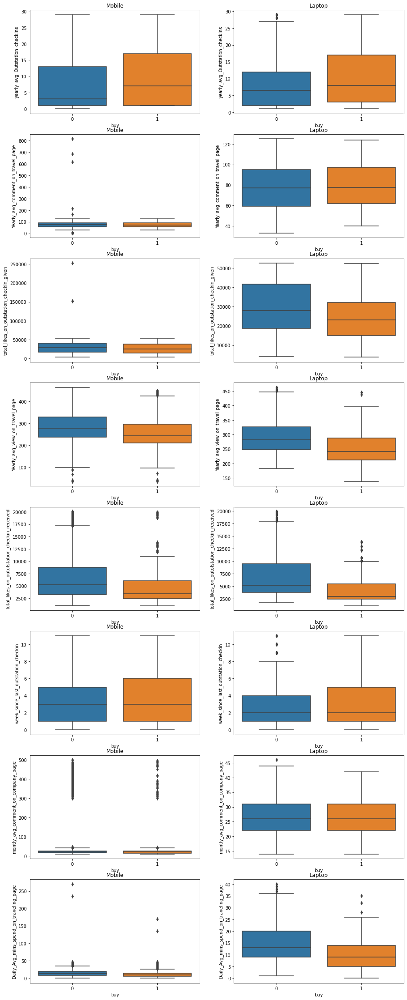

In [ ]:
fig,axes = plt.subplots(len(num_col),2,figsize=(15,40))
for i in range(len(num_col)):
    sns.boxplot(x=data['buy'],y=data[num_col[i]],ax=axes[i][0])
    axes[i][0].set_title('Mobile'.format(num_col[i]))
    sns.boxplot(x=Laptop['buy'],y=Laptop[num_col[i]],ax=axes[i][1])
    axes[i][1].set_title('Laptop'.format(num_col[i]))

In [ ]:
#2. Comparison of Mobile and Laptop numerical columns

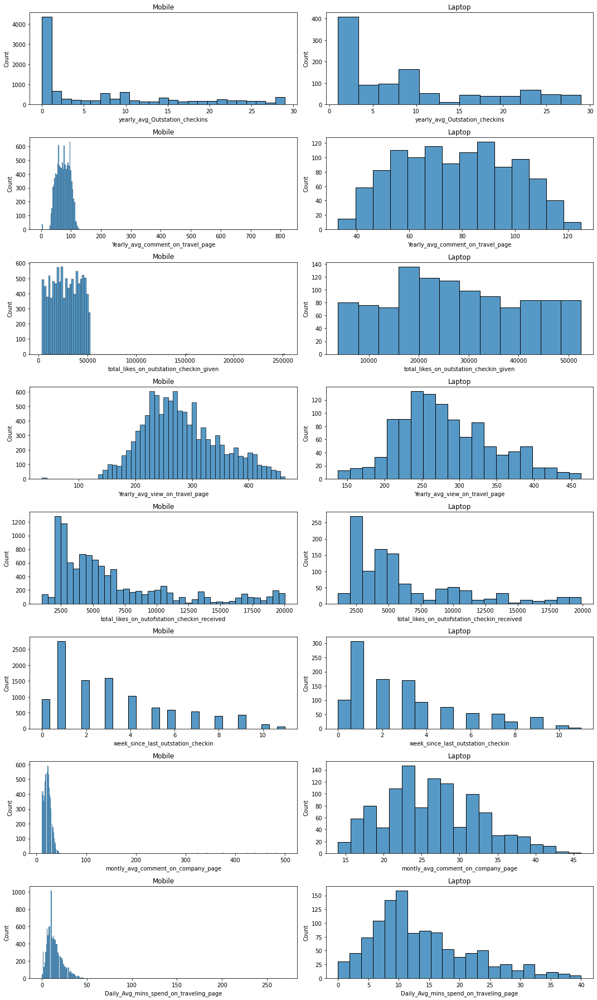

In [ ]:
fig,axes = plt.subplots(len(num_col),2,figsize=(15,25))
for i in range(len(num_col)):
    m=0
    sns.histplot(data=Mobile,x=num_col[i],ax=axes[i][m])
    axes[i][m].set_title('Mobile')
    m+=1
    sns.histplot(data=Laptop,x=num_col[i],ax=axes[i][m])
    axes[i][m].set_title('Laptop')
plt.tight_layout()

In [ ]:
#Insights from EDA of Mobile dataset

#1. There are many outliers in the context of social media usage of Mobile users which implies users of mobile generate more
# social media traffic
#2. In comparison with Laptop, the distribution of customers buying from us and not buying from us is consistent 
#across all the traveling network rating
#3. Among the laptop users, 84% of our customers were non-working. This ratio is same for the mobile users
#4. Majority of the travelers having OTT as preferred location type are our customers. The trend for the Hill-stations
#and trekking customers is not same for Mobile users as it was for Laptop users
#5. 70% of users following our company page are not buying from us
#6. There is a marginal increment in the mean daily comment on company page by users who are following us as well as 
#who buy from us relative to the other category
#7. ~10% of adult users are buying from us whereas 23% of non-adult users are buying from us
#8. Only 10% of users who have mentioned 5 members in their family on the platform have bought from us
#9. 19% of users who have close friends are buying from us

In [ ]:
Mobile.groupby(['travelling_network_rating','buy']).agg({'buy':'count'}).groupby(level=0).apply(lambda x:np.round(100 * x / float(x.sum()),2))

buy
travelling_network_rating buy       
1                         0    85.71
                          1    14.29
2                         0    85.49
                          1    14.51
3                         0    86.00
                          1    14.00
4                         0    80.88
                          1    19.12

In [ ]:
Mobile.groupby(['buy','working_flag']).agg({'working_flag':'count'}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

working_flag
buy working_flag              
0   0                84.818957
    1                15.181043
1   0                84.444444
    1                15.555556

In [ ]:
Mobile.groupby(['preferred_location_type','buy']).agg({'buy':'count'}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

buy
preferred_location_type buy           
Beach                   0    88.198758
                        1    11.801242
Big Cities              0    79.545455
                        1    20.454545
Entertainment           0    76.162791
                        1    23.837209
Financial               0    85.307470
                        1    14.692530
Game                    0    91.666667
                        1     8.333333
Hill Stations           0    80.952381
                        1    19.047619
Historical site         0    86.772487
                        1    13.227513
Medical                 0    86.422414
                        1    13.577586
Movie                   0    80.000000
                        1    20.000000
OTT                     0    42.857143
                        1    57.142857
Other                   0    87.244898
                        1    12.755102
Social media            0    77.987421
                        1    22.012579
Tour  Travel            0    77.049180
                        1    22.950820
Tour and Travel         0    70.212766
                        1    29.787234
Trekking                0    80.180180
                        1    19.819820

In [ ]:
Laptop.groupby(['preferred_location_type','buy']).agg({'buy':'count'}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

buy
preferred_location_type buy           
Beach                   0    73.983740
                        1    26.016260
Big Cities              0    70.370370
                        1    29.629630
Hill Stations           0    50.000000
                        1    50.000000
Historical site         0    84.883721
                        1    15.116279
Other                   0    78.571429
                        1    21.428571
Trekking                0    52.380952
                        1    47.619048

In [ ]:
data.columns

Index(['buy', 'following_company_page', 'Yearly_avg_comment_on_travel_page',
       'preferred_location_type', 'yearly_avg_Outstation_checkins',
       'total_likes_on_outstation_checkin_given',
       'Yearly_avg_view_on_travel_page', 'member_in_family',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [ ]:
data.groupby(['following_company_page','buy']).agg({'buy':'count'}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

buy
following_company_page buy           
0.0                    0    90.235954
                       1     9.764046
1.0                    0    70.771812
                       1    29.228188

In [ ]:
data.groupby(['following_company_page','buy']).agg({'montly_avg_comment_on_company_page':'mean'})

montly_avg_comment_on_company_page
following_company_page buy                                    
0.0                    0                             28.922132
                       1                             26.583445
1.0                    0                             28.621622
                       1                             31.361653

In [ ]:
data.groupby(["Adult_flag","buy"]).agg({"buy":"count"}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

buy
Adult_flag buy           
0          0    76.687117
           1    23.312883
1          0    90.865780
           1     9.134220

In [ ]:
data.groupby(['member_in_family','buy']).agg({"buy":"count"}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

buy
member_in_family buy           
1                0    82.098251
                 1    17.901749
2                0    85.521236
                 1    14.478764
3                0    83.899127
                 1    16.100873
4                0    86.064160
                 1    13.935840
5                0    89.534884
                 1    10.465116
10               0    90.909091
                 1     9.090909

In [ ]:
data.groupby(['travelling_network_rating','buy']).agg({"buy":"count"}).groupby(level=0).apply(lambda x:100*x/(float(x.sum())))

buy
travelling_network_rating buy           
1                         0    85.709688
                          1    14.290312
2                         0    85.489722
                          1    14.510278
3                         0    85.996409
                          1    14.003591
4                         0    80.876494
                          1    19.123506

In [ ]:
data['buy'].value_counts()

0    9031
1    1620
Name: buy, dtype: int64

#### One-hot encoding for modeling Mobile dataset

In [ ]:
Mobile.columns

Index(['buy', 'following_company_page', 'Yearly_avg_comment_on_travel_page',
       'preferred_location_type', 'yearly_avg_Outstation_checkins',
       'total_likes_on_outstation_checkin_given',
       'Yearly_avg_view_on_travel_page', 'member_in_family',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [ ]:
Mobile['preferred_location_type'] = np.where(Mobile['preferred_location_type']=='Tour  Travel','Tour and Travel',Mobile['preferred_location_type'])

In [ ]:
data = Mobile.copy()

In [ ]:
cat_col = Mobile.select_dtypes(exclude=[np.number]).columns.tolist()

### First iteration of train test split

In [ ]:
data = pd.get_dummies(data,columns=cat_col,drop_first=True)

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,stratify=Y)

### Feature selection techniques

#### Scaling the data prior to applying variance threshold

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
ss = StandardScaler()

In [ ]:
X_train_scaled = pd.DataFrame(data=ss.fit_transform(X_train),columns=X_train.columns)

#### Technique #1 : Variance Threshold

In [ ]:
from sklearn.feature_selection import VarianceThreshold

In [ ]:
#The below code will identify those features that are the same in at least 90% of the instances
varth = VarianceThreshold(threshold=0.9*(1-0.9))

In [ ]:
varth.fit_transform(X_train_scaled)

array([[-0.62124499,  0.48745202, -0.71167993, ..., -0.24953648,
        -0.10610757, -0.21143064],
       [-0.62124499,  1.04380745,  0.78567066, ...,  4.00743017,
        -0.10610757, -0.21143064],
       [-0.62124499, -2.85068062, -0.82686074, ..., -0.24953648,
        -0.10610757, -0.21143064],
       ...,
       [-0.62124499,  1.04380745,  2.39820206, ..., -0.24953648,
        -0.10610757, -0.21143064],
       [-0.62124499, -1.53927137, -0.82686074, ..., -0.24953648,
        -0.10610757, -0.21143064],
       [-0.62124499,  0.72589006,  1.9374788 , ..., -0.24953648,
        -0.10610757, -0.21143064]])

In [ ]:
varth.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True])

##### Implication : There are no low variance features in our dataset and hence we do not need to drop anything

#### Technique #2 :Sequential feature selection

In [ ]:
!pip install mlxtend

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import joblib

sys.modules['sklearn.externals.joblib'] = joblib

In [ ]:
from mlxtend.feature_selection import SequentialFeatureSelector

## Modeling

#### Mobile dataset

#### Splitting the train and test dataset

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1,stratify=Y)

### Baseline value for PRC
P/(P+N)

In [ ]:
N=Mobile['buy'].value_counts()[0]
P=Mobile['buy'].value_counts()[1]

In [ ]:
np.round((P/(P+N)),2)

0.15

### Model #1 : Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
dt_model = DecisionTreeClassifier()

In [ ]:
dt_model.fit(X_train,Y_train)

DecisionTreeClassifier()

In [ ]:
dt_model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [ ]:
print(X.shape)

(10651, 26)


#### Predictions

In [ ]:
train_pred = dt_model.predict(X_train)
test_pred = dt_model.predict(X_test)

In [ ]:
train_prob=dt_model.predict_proba(X_train)
test_prob=dt_model.predict_proba(X_test)

#### Performance metrices

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,0,1134


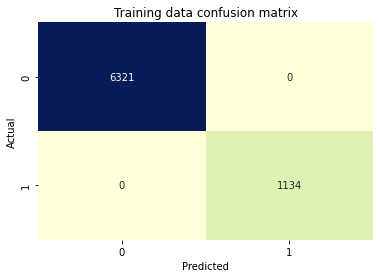

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6321
           1       1.00      1.00      1.00      1134

    accuracy                           1.00      7455
   macro avg       1.00      1.00      1.00      7455
weighted avg       1.00      1.00      1.00      7455



,Predicted : 0,Predicted : 1
Actual : 0,2660,50
Actual : 1,51,435


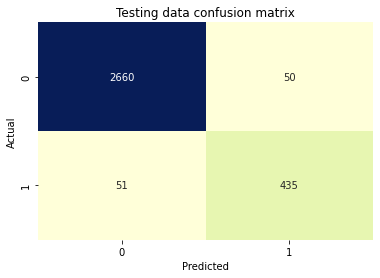

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2710
           1       0.90      0.90      0.90       486

    accuracy                           0.97      3196
   macro avg       0.94      0.94      0.94      3196
weighted avg       0.97      0.97      0.97      3196



In [ ]:
Metrics = pd.DataFrame(columns=['Decision_tree_not_tuned'],index=['Precision','Recall','F1-score','AUROC','AUPRC'])

In [ ]:
Metrics['Decision_tree_not_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))

In [ ]:
Metrics

,Decision_tree_not_tuned
Precision,0.90
Recall,0.90
F1-score,0.90
AUROC,0.94
AUPRC,0.82


#### Hyperparameter tuning

In [ ]:
# dtc = DecisionTreeClassifier()

In [ ]:
# X_train.shape

In [ ]:
# def objective(trial,data=X,target=Y):
#     max_depth=trial.suggest_int("max_depth",3,15,step=1)
#     min_samples_leaf=trial.suggest_int("min_samples_leaf",190,500,step=10)
#     min_samples_split=trial.suggest_int("min_samples_split",380,1000,step=10)
#     skf = StratifiedKFold(n_splits=10,random_state=1,shuffle=True)
#     cv_scores = []
#     for train_idx,test_idx in (skf.split(X,Y)):
#       X_train,Y_train = X.iloc[train_idx,:],Y.iloc[train_idx]
#       X_test,Y_test = X.iloc[test_idx,:],Y.iloc[test_idx]
#       dtc = DecisionTreeClassifier(max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split)
#       dtc.fit(X_train,Y_train)
#       preds = dtc.predict(X_test)
#       precision=metrics.precision_score(Y_test,preds)
#       cv_scores.append(precision)
#     return np.mean(cv_scores)

In [ ]:
# study = optuna.create_study(direction="maximize",study_name="precision-max")

In [ ]:
# study.optimize(objective,n_trials=100)

In [ ]:
# study.best_trial

In [ ]:
#best_params
dict1 = {'max_depth': 3, 'min_samples_leaf': 200, 'min_samples_split': 410}

In [ ]:
best_dtc = DecisionTreeClassifier(**dict1)

In [ ]:
best_dtc.fit(X_train,Y_train)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=200, min_samples_split=410)

In [ ]:
train_pred = best_dtc.predict(X_train)
test_pred = best_dtc.predict(X_test)

In [ ]:
train_prob=best_dtc.predict_proba(X_train)
test_prob=best_dtc.predict_proba(X_test)

,Predicted : 0,Predicted : 1
Actual : 0,2659,51
Actual : 1,389,97


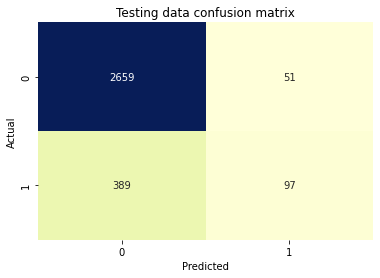

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92      2710
           1       0.66      0.20      0.31       486

    accuracy                           0.86      3196
   macro avg       0.76      0.59      0.61      3196
weighted avg       0.84      0.86      0.83      3196



In [ ]:
Metrics['Decision_tree_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics=Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned
Precision,0.90,0.66
Recall,0.90,0.20
F1-score,0.90,0.31
AUROC,0.94,0.75
AUPRC,0.82,0.38


#### Changing the cross-validation strategy

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 0.76316 in 0.03 seconds.

============Training fold 1============
Fold 1 finished with score: 0.675 in 0.03 seconds.

============Training fold 2============
Fold 2 finished with score: 0.75862 in 0.03 seconds.

============Training fold 3============
Fold 3 finished with score: 0.73529 in 0.03 seconds.

============Training fold 4============
Fold 4 finished with score: 0.56818 in 0.03 seconds.

============Training fold 5============
Fold 5 finished with score: 0.68519 in 0.03 seconds.

============Training fold 6============
Fold 6 finished with score: 0.58974 in 0.03 seconds.

============Training fold 7============
Fold 7 finished with score: 0.6129 in 0.02 seconds.

============Training fold 8============
Fold 8 finished with score: 0.69048 in 0.02 seconds.

============Training fold 9============
Fold 9 finished with score: 0.65116 in 0.02 seconds.

Average precision score is 0.6729725502129984


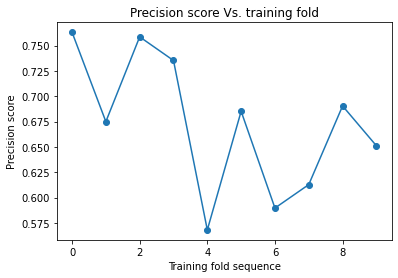

In [ ]:
#best_params
best_param = {'max_depth': 3, 'min_samples_leaf': 200, 'min_samples_split': 410}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X2_train,X2_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y2_train,Y2_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    dt_model_cv = DecisionTreeClassifier(**best_param)
    dt_model_cv.fit(X2_train,Y2_train)
    y_pred = dt_model_cv.predict(X2_test)
    precision=metrics.precision_score(Y2_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92      7224
           1       0.67      0.20      0.31      1296

    accuracy                           0.86      8520
   macro avg       0.77      0.59      0.62      8520
weighted avg       0.84      0.86      0.83      8520



(<AxesSubplot:>, None)

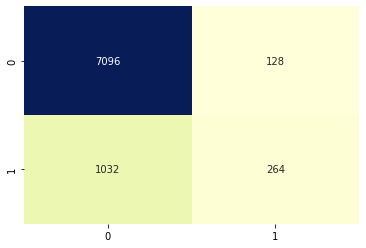

In [ ]:
##Checking the performance on the training set
checking_performance_cv(X2,Y2,dt_model_cv,'Decision_tree_0.2_tuned',True)

              precision    recall  f1-score   support

           0       0.87      0.99      0.92      1807
           1       0.69      0.19      0.29       324

    accuracy                           0.86      2131
   macro avg       0.78      0.59      0.61      2131
weighted avg       0.84      0.86      0.83      2131



(<AxesSubplot:>, None)

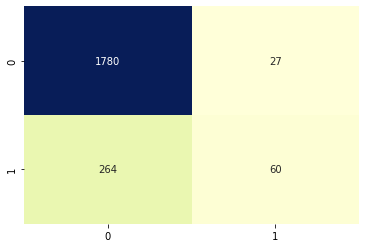

In [ ]:
checking_performance_cv(valid_X,valid_Y,dt_model_cv,'Decision_tree_0.2_tuned',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test
Precision,0.90,0.66,0.67,0.69
Recall,0.90,0.20,0.20,0.19
F1-score,0.90,0.31,0.31,0.29
AUROC,0.94,0.75,0.77,0.77
AUPRC,0.82,0.38,0.39,0.39


In [ ]:
Metrics.rename(columns={'Decision_tree_0.3_tuned_cv_updated_train':'Decision_tree_0.2_tuned_cv_updated_train','Decision_tree_0.2_tuned_cv_updated_test':'Decision_tree_0.2_tuned_cv_updated_test'},inplace=True)

#### Feature selection

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
print(X.shape)

(10651, 26)


In [ ]:
sfs = SequentialFeatureSelector(dt_model_cv,k_features=26,forward=True,scoring="average_precision",cv=10)

In [ ]:
sfs.fit(X,Y)

SequentialFeatureSelector(cv=10,
                          estimator=DecisionTreeClassifier(max_depth=3,
                                                           min_samples_leaf=200,
                                                           min_samples_split=410),
                          k_features=26, scoring='average_precision')

In [ ]:
sfs.subsets_

{1: {'feature_idx': (6,),
  'cv_scores': array([0.23559807, 0.2588329 , 0.27634532, 0.25205445, 0.25574077,
         0.27704413, 0.24860667, 0.25724292, 0.25356862, 0.26049034]),
  'avg_score': 0.25755241930071626,
  'feature_names': ('total_likes_on_outofstation_checkin_received',)},
 2: {'feature_idx': (0, 6),
  'cv_scores': array([0.35411475, 0.34583506, 0.37360229, 0.358142  , 0.34631284,
         0.36320201, 0.36735242, 0.35117301, 0.35312322, 0.35324706]),
  'avg_score': 0.35661046678046066,
  'feature_names': ('following_company_page',
   'total_likes_on_outofstation_checkin_received')},
 3: {'feature_idx': (0, 3, 6),
  'cv_scores': array([0.38782795, 0.38788145, 0.40211709, 0.38565954, 0.36966796,
         0.39781401, 0.38994969, 0.37926915, 0.3785513 , 0.37703738]),
  'avg_score': 0.3855775504967907,
  'feature_names': ('following_company_page',
   'total_likes_on_outstation_checkin_given',
   'total_likes_on_outofstation_checkin_received')},
 4: {'feature_idx': (0, 3, 6, 11),

In [ ]:
decision_tree_features=pd.DataFrame(data=sfs.subsets_).T
# decision_tree_features.to_csv('Decision_tree_features.csv',index=False)

In [ ]:
decision_tree_features

,feature_idx,cv_scores,avg_score,feature_names
1,"(6,)","[0.2355980669585308, 0.2588329044899833, 0.276...",0.257552,"(total_likes_on_outofstation_checkin_received,)"
2,"(0, 6)","[0.3541147536200429, 0.34583505655236924, 0.37...",0.35661,"(following_company_page, total_likes_on_outofs..."
3,"(0, 3, 6)","[0.38782795399991, 0.3878814463765369, 0.40211...",0.385578,"(following_company_page, total_likes_on_outsta..."
4,"(0, 3, 6, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, total_likes_on_outsta..."
5,"(0, 1, 3, 6, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, Yearly_avg_comment_on..."
6,"(0, 1, 2, 3, 6, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, Yearly_avg_comment_on..."
7,"(0, 1, 2, 3, 5, 6, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, Yearly_avg_comment_on..."
8,"(0, 1, 2, 3, 5, 6, 7, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, Yearly_avg_comment_on..."
9,"(0, 1, 2, 3, 5, 6, 7, 8, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, Yearly_avg_comment_on..."
10,"(0, 1, 2, 3, 5, 6, 7, 8, 9, 11)","[0.3969470784223291, 0.4249143603434419, 0.415...",0.406677,"(following_company_page, Yearly_avg_comment_on..."


In [ ]:
#decision_tree_features = pd.read_csv('Decision_tree_features.csv')

In [ ]:
decision_tree_final_features = ['following_company_page','total_likes_on_outstation_checkin_given','total_likes_on_outofstation_checkin_received','Adult_flag']

#### Modeling on final features

In [ ]:
X = X[decision_tree_final_features]

In [ ]:
len(decision_tree_final_features)

4

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.1,random_state=0,stratify=Y)

============Training fold 0============
Fold 0 finished with score: 0.60417 in 0.01 seconds.

============Training fold 1============
Fold 1 finished with score: 0.55319 in 0.01 seconds.

============Training fold 2============
Fold 2 finished with score: 0.71429 in 0.01 seconds.

============Training fold 3============
Fold 3 finished with score: 0.76316 in 0.01 seconds.

============Training fold 4============
Fold 4 finished with score: 0.83333 in 0.01 seconds.

============Training fold 5============
Fold 5 finished with score: 0.68 in 0.01 seconds.

============Training fold 6============
Fold 6 finished with score: 0.71429 in 0.01 seconds.

============Training fold 7============
Fold 7 finished with score: 0.6 in 0.02 seconds.

============Training fold 8============
Fold 8 finished with score: 0.80851 in 0.01 seconds.

============Training fold 9============
Fold 9 finished with score: 0.61905 in 0.01 seconds.

Average precision score is 0.6889979070015464


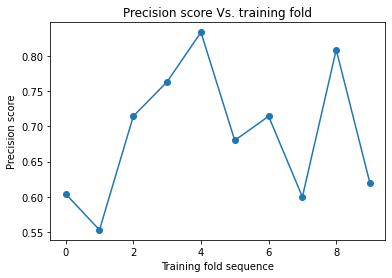

In [ ]:
#best_params
best_param = {'max_depth': 3, 'min_samples_leaf': 200, 'min_samples_split': 410}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X2_train,X2_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y2_train,Y2_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    dt_model_cv = DecisionTreeClassifier(**best_param)
    dt_model_cv.fit(X2_train,Y2_train)
    y_pred = dt_model_cv.predict(X2_test)
    precision=metrics.precision_score(Y2_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92      8127
           1       0.68      0.20      0.31      1458

    accuracy                           0.86      9585
   macro avg       0.77      0.59      0.62      9585
weighted avg       0.84      0.86      0.83      9585



(<AxesSubplot:>, None)

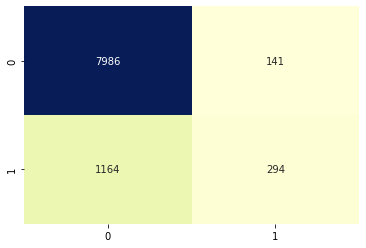

In [ ]:
checking_performance_cv(X2,Y2,dt_model_cv,'decision_tree_0.1_tuned_4_features',True)

              precision    recall  f1-score   support

           0       0.87      0.98      0.92       904
           1       0.68      0.19      0.29       162

    accuracy                           0.86      1066
   macro avg       0.78      0.58      0.61      1066
weighted avg       0.84      0.86      0.83      1066



(<AxesSubplot:>, None)

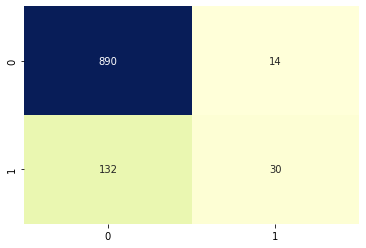

In [ ]:
checking_performance_cv(valid_X,valid_Y,dt_model_cv,'decision_tree_0.1_tuned_4_features',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68
Recall,0.90,0.20,0.20,0.19,0.20,0.19
F1-score,0.90,0.31,0.31,0.29,0.31,0.29
AUROC,0.94,0.75,0.77,0.77,0.75,0.72
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36


### Model #2 : Random forest

#### Setting the X and Y for Random Forest and train_test_split

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1,stratify=Y)

#### Creating the Random Forest Classifier model object

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc = RandomForestClassifier(n_estimators=200,max_depth=8,min_samples_leaf=250,min_samples_split=750,class_weight='balanced_subsample')

In [ ]:
rfc.fit(X_train,Y_train)

RandomForestClassifier(class_weight='balanced_subsample', max_depth=8,
                       min_samples_leaf=250, min_samples_split=750,
                       n_estimators=200)

#### Predictions

In [ ]:
train_pred = rfc.predict(X_train)
test_pred = rfc.predict(X_test)

In [ ]:
train_prob=rfc.predict_proba(X_train)
test_prob=rfc.predict_proba(X_test)

#### Performance metrices

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,4696,1625
Actual : 1,260,874


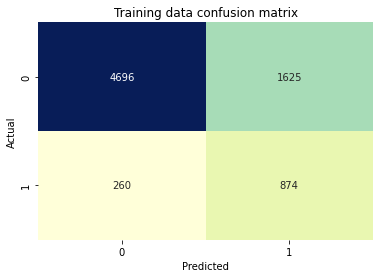

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.95      0.74      0.83      6321
           1       0.35      0.77      0.48      1134

    accuracy                           0.75      7455
   macro avg       0.65      0.76      0.66      7455
weighted avg       0.86      0.75      0.78      7455



,Predicted : 0,Predicted : 1
Actual : 0,2007,703
Actual : 1,131,355


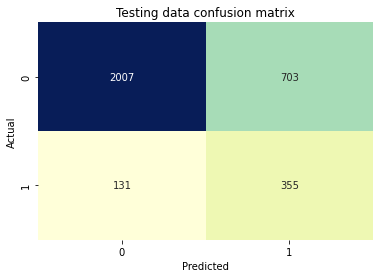

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.94      0.74      0.83      2710
           1       0.34      0.73      0.46       486

    accuracy                           0.74      3196
   macro avg       0.64      0.74      0.64      3196
weighted avg       0.85      0.74      0.77      3196



In [ ]:
Metrics['Random_forest_not_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49


#### Stratified K-Fold cross validation

In [ ]:
skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=1)

============Training fold 0============
Fold 0 finished with score: 0.35127 in 18.03 seconds.

============Training fold 1============
Fold 1 finished with score: 0.36364 in 17.94 seconds.

============Training fold 2============
Fold 2 finished with score: 0.33427 in 16.41 seconds.

============Training fold 3============
Fold 3 finished with score: 0.33422 in 17.67 seconds.

============Training fold 4============
Fold 4 finished with score: 0.36416 in 15.51 seconds.

============Training fold 5============
Fold 5 finished with score: 0.31746 in 15.48 seconds.

============Training fold 6============
Fold 6 finished with score: 0.36778 in 15.49 seconds.

============Training fold 7============
Fold 7 finished with score: 0.34561 in 17.85 seconds.

============Training fold 8============
Fold 8 finished with score: 0.37879 in 18.12 seconds.

============Training fold 9============
Fold 9 finished with score: 0.3 in 16.3 seconds.

Average precision score is 0.34572056791537875


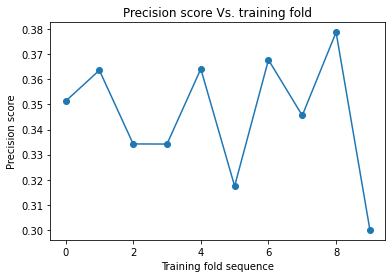

In [ ]:
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X,Y)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X.iloc[train_idx,:],X.iloc[test_idx,:]
    Y_train,Y_test = Y.iloc[train_idx],Y.iloc[test_idx]
    start = datetime.now()
    rfc = RandomForestClassifier(n_estimators=2000,max_depth=12,min_samples_leaf=250,min_samples_split=750,n_jobs=-1,class_weight='balanced_subsample')
    rfc.fit(X_train,Y_train)
    y_pred = rfc.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

#### Random forest Hyperparameter tuning

In [ ]:
# def objective(trial,data=X,target=Y):
#     max_depth=trial.suggest_int("max_depth",3,15,step=1)
#     min_samples_leaf=trial.suggest_int("min_samples_leaf",190,500,step=10)
#     min_samples_split=trial.suggest_int("min_samples_split",380,1000,step=10)
#     n_estimators=trial.suggest_int("n_estimators",100,1000,step=1)
#     max_features=trial.suggest_categorical("max_features",choices=["auto","sqrt","log2"])
#     skf = StratifiedKFold(n_splits=10,random_state=1,shuffle=True)
#     cv_scores = []
#     for (train_idx,test_idx) in (skf.split(X,Y)):
#       X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
#       X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
#       rfc = RandomForestClassifier(max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split,max_features=max_features,n_estimators=n_estimators,class_weight='balanced_subsample',n_jobs=-1)
#       rfc.fit(X_train,Y_train)
#       preds = rfc.predict(X_test)
#       precision=metrics.precision_score(Y_test,preds)
#       cv_scores.append(precision)
#     return np.mean(cv_scores)

In [ ]:
# study = optuna.create_study(direction="maximize",study_name="precision-max")

In [ ]:
# study.optimize(objective,n_trials=100)

In [ ]:
# study.best_value

In [ ]:
# study.best_params
dict1 = {'max_depth': 9,'min_samples_leaf': 190,'min_samples_split': 400,'n_estimators': 582,'max_features': 'auto'}

In [ ]:
best_rfc = RandomForestClassifier(**dict1,class_weight='balanced_subsample')

In [ ]:
best_rfc.fit(X_train,Y_train)

RandomForestClassifier(class_weight='balanced_subsample', max_depth=9,
                       min_samples_leaf=190, min_samples_split=400,
                       n_estimators=582)

#### Predictions on Tuned Random Forest Model

In [ ]:
train_pred = best_rfc.predict(X_train)
test_pred = best_rfc.predict(X_test)

In [ ]:
train_prob=best_rfc.predict_proba(X_train)
test_prob=best_rfc.predict_proba(X_test)

#### Performance metrices for Tuned RF model

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6280,1848
Actual : 1,344,1114


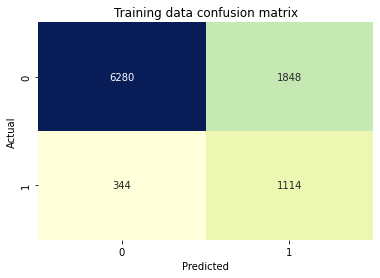

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.95      0.77      0.85      8128
           1       0.38      0.76      0.50      1458

    accuracy                           0.77      9586
   macro avg       0.66      0.77      0.68      9586
weighted avg       0.86      0.77      0.80      9586



,Predicted : 0,Predicted : 1
Actual : 0,680,223
Actual : 1,60,102


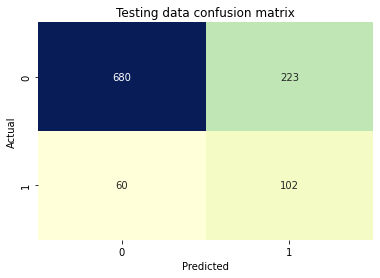

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.92      0.75      0.83       903
           1       0.31      0.63      0.42       162

    accuracy                           0.73      1065
   macro avg       0.62      0.69      0.62      1065
weighted avg       0.83      0.73      0.77      1065



In [ ]:
Metrics['Random_forest_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47


#### Changing the cross-validation strategy for RF

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 0.35448 in 4.59 seconds.

============Training fold 1============
Fold 1 finished with score: 0.36214 in 4.5 seconds.

============Training fold 2============
Fold 2 finished with score: 0.33865 in 4.42 seconds.

============Training fold 3============
Fold 3 finished with score: 0.34602 in 4.4 seconds.

============Training fold 4============
Fold 4 finished with score: 0.32997 in 4.41 seconds.

============Training fold 5============
Fold 5 finished with score: 0.38148 in 4.4 seconds.

============Training fold 6============
Fold 6 finished with score: 0.36029 in 4.48 seconds.

============Training fold 7============
Fold 7 finished with score: 0.35833 in 4.55 seconds.

============Training fold 8============
Fold 8 finished with score: 0.37091 in 4.52 seconds.

============Training fold 9============
Fold 9 finished with score: 0.34247 in 4.8 seconds.

Average precision score is 0.3544733815970092


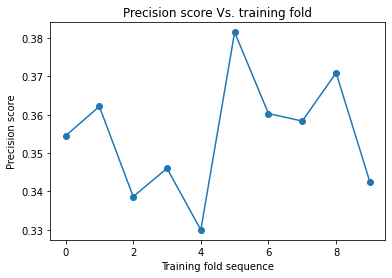

In [ ]:
#best_params
best_param = {'max_depth': 9,'min_samples_leaf': 190,'min_samples_split': 400,'n_estimators': 582,'max_features': 'auto'}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    rfc_cv = RandomForestClassifier(**best_param,class_weight='balanced_subsample')
    rfc_cv.fit(X_train,Y_train)
    y_pred = rfc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.95      0.76      0.85      7224
           1       0.37      0.77      0.50      1296

    accuracy                           0.76      8520
   macro avg       0.66      0.77      0.67      8520
weighted avg       0.86      0.76      0.79      8520



(<AxesSubplot:>, None)

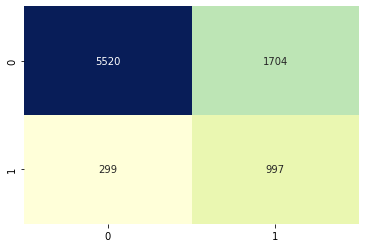

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,rfc_cv,'random_forest_tuned',True)

              precision    recall  f1-score   support

           0       0.95      0.76      0.85      1807
           1       0.36      0.76      0.49       324

    accuracy                           0.76      2131
   macro avg       0.66      0.76      0.67      2131
weighted avg       0.86      0.76      0.79      2131



(<AxesSubplot:>, None)

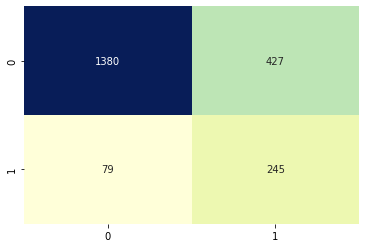

In [ ]:
checking_performance_cv(valid_X,valid_Y,rfc_cv,'random_forest_tuned',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55


#### Feature selection for Random Forest

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
print(X.shape)

(10651, 26)


In [ ]:
# sfs = SequentialFeatureSelector(rfc_cv,k_features=26,forward=True,scoring="average_precision",cv=10)

In [ ]:
# sfs.fit(X,Y)

In [ ]:
# sfs.subsets_

In [ ]:
# random_forest_features=pd.DataFrame(data=sfs.subsets_).T
#random_forest_features.to_csv('RF_features.csv',index=False)

In [ ]:
random_forest_features = pd.read_csv('/content/gdrive/MyDrive/Social Media_Tourism_Project/RF_features.csv')

In [ ]:
random_forest_final_features = ['following_company_page','Yearly_avg_comment_on_travel_page','yearly_avg_Outstation_checkins','total_likes_on_outstation_checkin_given','Yearly_avg_view_on_travel_page','member_in_family','total_likes_on_outofstation_checkin_received','week_since_last_outstation_checkin','travelling_network_rating','Adult_flag','preferred_location_type_Entertainment','preferred_location_type_Movie']

In [ ]:
len(random_forest_final_features)

12

#### Modeling on final features

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
X = X[random_forest_final_features]

In [ ]:
len(random_forest_final_features)

12

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.1,random_state=0,stratify=Y)

============Training fold 0============
Fold 0 finished with score: 0.36422 in 6.96 seconds.

============Training fold 1============
Fold 1 finished with score: 0.39726 in 6.05 seconds.

============Training fold 2============
Fold 2 finished with score: 0.36129 in 5.12 seconds.

============Training fold 3============
Fold 3 finished with score: 0.36111 in 5.07 seconds.

============Training fold 4============
Fold 4 finished with score: 0.35082 in 5.17 seconds.

============Training fold 5============
Fold 5 finished with score: 0.38158 in 5.22 seconds.

============Training fold 6============
Fold 6 finished with score: 0.37895 in 6.2 seconds.

============Training fold 7============
Fold 7 finished with score: 0.33333 in 5.29 seconds.

============Training fold 8============
Fold 8 finished with score: 0.4 in 5.5 seconds.

============Training fold 9============
Fold 9 finished with score: 0.37037 in 6.86 seconds.

Average precision score is 0.369892865168485


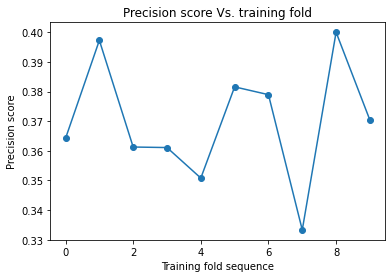

In [ ]:
#best_params
best_param = {'max_depth': 9,'min_samples_leaf': 190,'min_samples_split': 400,'n_estimators': 582,'max_features': 'auto'}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    rfc_cv = RandomForestClassifier(**best_param,class_weight='balanced_subsample')
    rfc_cv.fit(X_train,Y_train)
    y_pred = rfc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.95      0.77      0.85      8127
           1       0.38      0.77      0.51      1458

    accuracy                           0.77      9585
   macro avg       0.66      0.77      0.68      9585
weighted avg       0.86      0.77      0.80      9585



(<AxesSubplot:>, None)

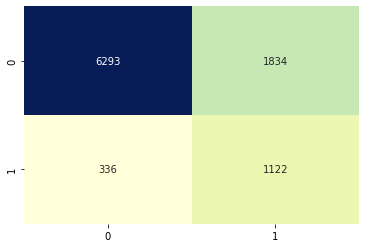

In [ ]:
checking_performance_cv(X2,Y2,rfc_cv,'Random_Forest_0.1_tuned_12_features',True)

              precision    recall  f1-score   support

           0       0.95      0.76      0.84       904
           1       0.36      0.77      0.49       162

    accuracy                           0.76      1066
   macro avg       0.66      0.76      0.67      1066
weighted avg       0.86      0.76      0.79      1066



(<AxesSubplot:>, None)

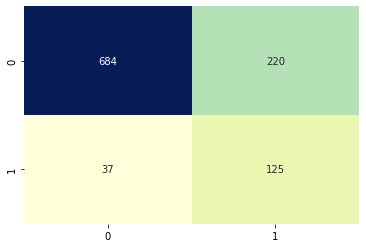

In [ ]:
checking_performance_cv(valid_X,valid_Y,rfc_cv,'Random_Forest_0.1_tuned_12_features',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57


### Model #3 : Logistic regression

#### Setting the X and Y for Logistic regression and train_test_split

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=0,stratify=Y)

#### Creating the logistic regression model object and fitting it

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lr = LogisticRegression(class_weight='balanced')

In [ ]:
lr.fit(X_train,Y_train)

LogisticRegression(class_weight='balanced')

#### Predictions for Logistic regression model

In [ ]:
train_pred = lr.predict(X_train)
test_pred = lr.predict(X_test)

In [ ]:
train_prob=lr.predict_proba(X_train)
test_prob=lr.predict_proba(X_test)

#### Performance metrices for Logistic Regression Model

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,5052,2263
Actual : 1,575,737


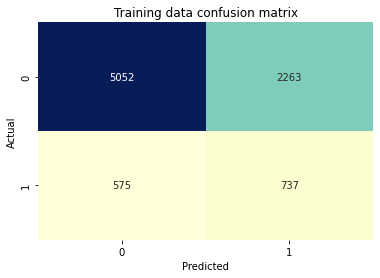

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.90      0.69      0.78      7315
           1       0.25      0.56      0.34      1312

    accuracy                           0.67      8627
   macro avg       0.57      0.63      0.56      8627
weighted avg       0.80      0.67      0.71      8627



,Predicted : 0,Predicted : 1
Actual : 0,581,231
Actual : 1,66,80


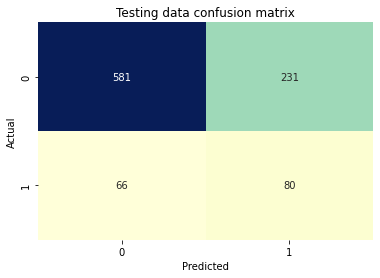

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.90      0.72      0.80       812
           1       0.26      0.55      0.35       146

    accuracy                           0.69       958
   macro avg       0.58      0.63      0.57       958
weighted avg       0.80      0.69      0.73       958



In [ ]:
Metrics['Logistic_regression'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23


#### Stratified K-Fold cross validation

In [ ]:
skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=1)

============Training fold 0============
Fold 0 finished with score: 0.23741 in 0.24 seconds.

============Training fold 1============
Fold 1 finished with score: 0.23389 in 0.23 seconds.

============Training fold 2============
Fold 2 finished with score: 0.25193 in 0.24 seconds.

============Training fold 3============
Fold 3 finished with score: 0.25455 in 0.23 seconds.

============Training fold 4============
Fold 4 finished with score: 0.24757 in 0.26 seconds.

============Training fold 5============
Fold 5 finished with score: 0.24706 in 0.28 seconds.

============Training fold 6============
Fold 6 finished with score: 0.25659 in 0.23 seconds.

============Training fold 7============
Fold 7 finished with score: 0.24186 in 0.22 seconds.

============Training fold 8============
Fold 8 finished with score: 0.26582 in 0.22 seconds.

============Training fold 9============
Fold 9 finished with score: 0.22542 in 0.29 seconds.

Average precision score is 0.2462103039329596


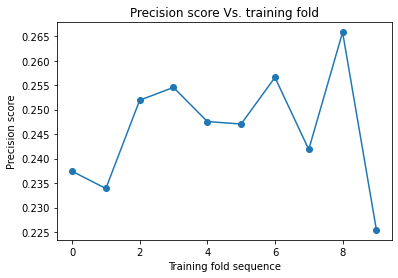

In [ ]:
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X,Y)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X.iloc[train_idx,:],X.iloc[test_idx,:]
    Y_train,Y_test = Y.iloc[train_idx],Y.iloc[test_idx]
    start = datetime.now()
    lr = LogisticRegression(class_weight='balanced')
    lr.fit(X_train,Y_train)
    y_pred = lr.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

#### Changing the cross-validation strategy

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 0.25 in 0.22 seconds.

============Training fold 1============
Fold 1 finished with score: 0.22654 in 0.18 seconds.

============Training fold 2============
Fold 2 finished with score: 0.21714 in 0.23 seconds.

============Training fold 3============
Fold 3 finished with score: 0.21707 in 0.27 seconds.

============Training fold 4============
Fold 4 finished with score: 0.22626 in 0.23 seconds.

============Training fold 5============
Fold 5 finished with score: 0.26814 in 0.28 seconds.

============Training fold 6============
Fold 6 finished with score: 0.2462 in 0.24 seconds.

============Training fold 7============
Fold 7 finished with score: 0.24534 in 0.13 seconds.

============Training fold 8============
Fold 8 finished with score: 0.24684 in 0.2 seconds.

============Training fold 9============
Fold 9 finished with score: 0.20833 in 0.12 seconds.

Average precision score is 0.23518600283859725


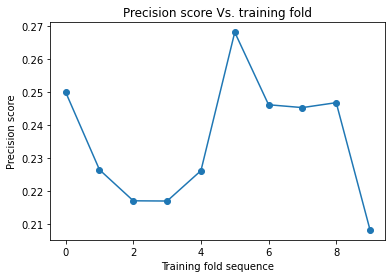

In [ ]:
#best_params
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    lr_cv = LogisticRegression(class_weight='balanced')
    lr_cv.fit(X_train,Y_train)
    y_pred = lr_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.90      0.61      0.73      7224
           1       0.22      0.60      0.32      1296

    accuracy                           0.61      8520
   macro avg       0.56      0.61      0.53      8520
weighted avg       0.79      0.61      0.67      8520



(<AxesSubplot:>, None)

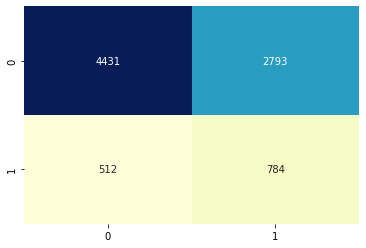

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,lr_cv,'logistic_regression',True)

              precision    recall  f1-score   support

           0       0.90      0.59      0.72      1807
           1       0.22      0.64      0.33       324

    accuracy                           0.60      2131
   macro avg       0.56      0.62      0.52      2131
weighted avg       0.80      0.60      0.66      2131



(<AxesSubplot:>, None)

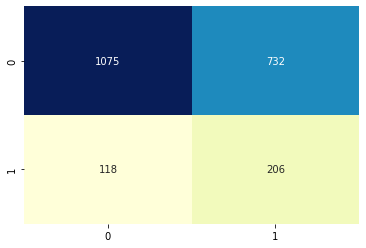

In [ ]:
checking_performance_cv(valid_X,valid_Y,lr_cv,'logistic_regression',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22


#### Feature selection on Logistic regression

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
print(X.shape)

(10651, 26)


In [ ]:
# sfs = SequentialFeatureSelector(lr_cv,k_features=26,forward=True,scoring="average_precision",cv=10)

In [ ]:
# sfs.fit(X,Y)

In [ ]:
# sfs.subsets_

In [ ]:
# logistic_regression_features=pd.DataFrame(data=sfs.subsets_).T
#logistic_regression_features.to_csv('Logistic_Regression_features.csv',index=False)

In [ ]:
logistic_regression_features = pd.read_csv('/content/gdrive/MyDrive/Social Media_Tourism_Project/Logistic_Regression_features.csv')

In [ ]:
logistic_regression_final_features = ['following_company_page','yearly_avg_Outstation_checkins','total_likes_on_outofstation_checkin_received','week_since_last_outstation_checkin','travelling_network_rating','Adult_flag','Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
len(logistic_regression_final_features)

7

#### Modeling on final features

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
X = X[logistic_regression_final_features]

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.1,random_state=0,stratify=Y)

============Training fold 0============
Fold 0 finished with score: 0.27143 in 0.24 seconds.

============Training fold 1============
Fold 1 finished with score: 0.27578 in 0.23 seconds.

============Training fold 2============
Fold 2 finished with score: 0.21014 in 0.22 seconds.

============Training fold 3============
Fold 3 finished with score: 0.2905 in 0.24 seconds.

============Training fold 4============
Fold 4 finished with score: 0.26619 in 0.25 seconds.

============Training fold 5============
Fold 5 finished with score: 0.28398 in 0.3 seconds.

============Training fold 6============
Fold 6 finished with score: 0.31653 in 0.26 seconds.

============Training fold 7============
Fold 7 finished with score: 0.2448 in 0.23 seconds.

============Training fold 8============
Fold 8 finished with score: 0.28642 in 0.26 seconds.

============Training fold 9============
Fold 9 finished with score: 0.32213 in 0.23 seconds.

Average precision score is 0.2767902212065087


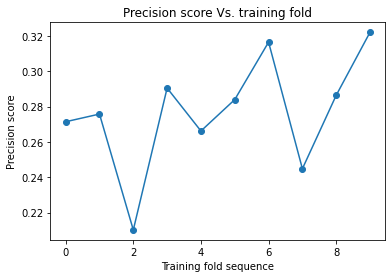

In [ ]:
#best_params
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    lr_cv = LogisticRegression(class_weight='balanced')
    lr_cv.fit(X_train,Y_train)
    y_pred = lr_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.94      0.69      0.79      8127
           1       0.30      0.76      0.43      1458

    accuracy                           0.70      9585
   macro avg       0.62      0.72      0.61      9585
weighted avg       0.84      0.70      0.74      9585



(<AxesSubplot:>, None)

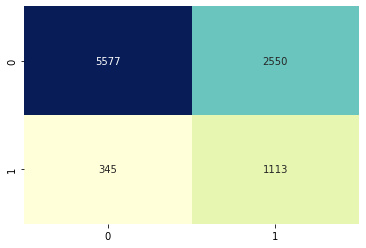

In [ ]:
checking_performance_cv(X2,Y2,lr_cv,'lr_0.1_tuned_7_features',True)

              precision    recall  f1-score   support

           0       0.95      0.68      0.79       904
           1       0.31      0.80      0.44       162

    accuracy                           0.69      1066
   macro avg       0.63      0.74      0.62      1066
weighted avg       0.85      0.69      0.74      1066



(<AxesSubplot:>, None)

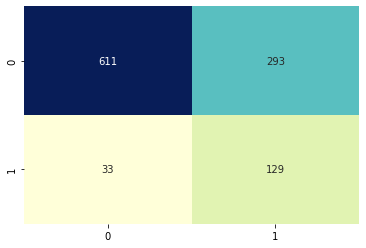

In [ ]:
checking_performance_cv(valid_X,valid_Y,lr_cv,'lr_0.1_tuned_7_features',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48


### Model #4 : Gradient Boosting

#### Setting the X and Y for Gradient Boosting Classifier and train_test_split

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1,stratify=Y)

#### Creating the Gradient Boosting Classifier object

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
gbc = GradientBoostingClassifier()

In [ ]:
gbc.fit(X_train,Y_train)

GradientBoostingClassifier()

#### Predictions on Gradient Boosting Classifier

In [ ]:
train_pred = gbc.predict(X_train)
test_pred = gbc.predict(X_test)

In [ ]:
train_prob=gbc.predict_proba(X_train)
test_prob=gbc.predict_proba(X_test)

#### Performance metrices of Gradient Boosting Classifier

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6265,56
Actual : 1,572,562


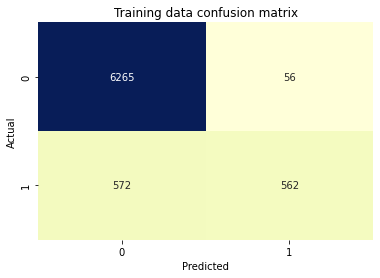

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95      6321
           1       0.91      0.50      0.64      1134

    accuracy                           0.92      7455
   macro avg       0.91      0.74      0.80      7455
weighted avg       0.92      0.92      0.91      7455



,Predicted : 0,Predicted : 1
Actual : 0,2675,35
Actual : 1,291,195


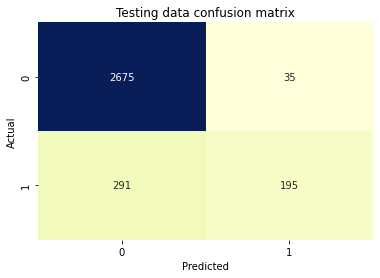

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      2710
           1       0.85      0.40      0.54       486

    accuracy                           0.90      3196
   macro avg       0.87      0.69      0.74      3196
weighted avg       0.89      0.90      0.88      3196



In [ ]:
Metrics['Gradient_boosting_not_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics['Gradient_boosting_not_tuned']=Metrics['Gradient_boosting_not_tuned'].apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72


#### Stratified K-Fold cross validation

In [ ]:
skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=1)

============Training fold 0============
Fold 0 finished with score: 0.8642 in 2.33 seconds.

============Training fold 1============
Fold 1 finished with score: 0.85393 in 2.12 seconds.

============Training fold 2============
Fold 2 finished with score: 0.88525 in 2.12 seconds.

============Training fold 3============
Fold 3 finished with score: 0.83951 in 2.18 seconds.

============Training fold 4============
Fold 4 finished with score: 0.96341 in 2.01 seconds.

============Training fold 5============
Fold 5 finished with score: 0.90789 in 2.06 seconds.

============Training fold 6============
Fold 6 finished with score: 0.87324 in 2.07 seconds.

============Training fold 7============
Fold 7 finished with score: 0.92308 in 2.03 seconds.

============Training fold 8============
Fold 8 finished with score: 0.92 in 2.05 seconds.

============Training fold 9============
Fold 9 finished with score: 0.86885 in 2.08 seconds.

Average precision score is 0.8899360379314192


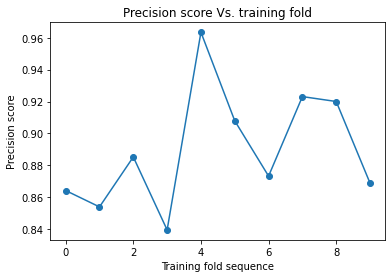

In [ ]:
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X,Y)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X.iloc[train_idx,:],X.iloc[test_idx,:]
    Y_train,Y_test = Y.iloc[train_idx],Y.iloc[test_idx]
    start = datetime.now()
    gbc = GradientBoostingClassifier()
    gbc.fit(X_train,Y_train)
    y_pred = gbc.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

#### Hyperparameter tuning in Gradient Boosting Classifier

In [ ]:
# def objective(trial,data=X,target=Y):
#   max_depth=trial.suggest_int("max_depth",4,8,step=1)
#   min_samples_leaf=trial.suggest_int("min_samples_leaf",190,500,step=10)
#   min_samples_split=trial.suggest_int("min_samples_split",380,1000,step=10)
#   n_estimators=trial.suggest_int("n_estimators",100,700,step=10)
#   learning_rate=trial.suggest_float("learning_rate",0.01,0.4,log=True)
#   subsample=trial.suggest_float('subsample',0.4,0.8,step=0.0001)
#   skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=1)
#   max_features = trial.suggest_int('max_features',9,18,step=1)
#   cv_scores = []
#   for (train_idx,test_idx) in (skf.split(X,Y)):
#     X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
#     X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
#     gbc = GradientBoostingClassifier(max_depth=max_depth,min_samples_leaf=min_samples_leaf,min_samples_split=min_samples_split,n_estimators=n_estimators,
#                                       learning_rate=learning_rate,subsample=subsample)
#     gbc.fit(X_train,Y_train)
#     preds = gbc.predict(X_test)
#     precision=metrics.precision_score(Y_test,preds)
#     cv_scores.append(precision)
#   return np.mean(cv_scores)

In [ ]:
# study = optuna.create_study(direction="maximize",study_name="precision-max")

In [ ]:
# study.optimize(objective,n_trials=10)

In [ ]:
# study.best_value

In [ ]:
# study.best_trial

In [ ]:
# study.best_params
dict2 = {'max_depth': 5,'min_samples_leaf': 380,'min_samples_split': 430,'n_estimators': 560,'learning_rate': 0.2682277318763267,'subsample': 0.6178,'max_features': 17}

In [ ]:
best_gbc = GradientBoostingClassifier(**dict2)

In [ ]:
best_gbc.fit(X_train,Y_train)

GradientBoostingClassifier(learning_rate=0.2682277318763267, max_depth=5,
                           max_features=17, min_samples_leaf=380,
                           min_samples_split=430, n_estimators=560,
                           subsample=0.6178)

#### Predictions on tuned GBC

In [ ]:
train_pred = best_gbc.predict(X_train)
test_pred = best_gbc.predict(X_test)

In [ ]:
train_prob=best_gbc.predict_proba(X_train)
test_prob=best_gbc.predict_proba(X_test)

#### Performance metrices for tuned GBC

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,8126,2
Actual : 1,16,1442


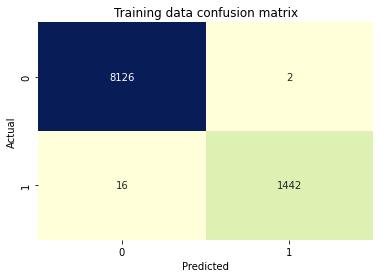

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8128
           1       1.00      0.99      0.99      1458

    accuracy                           1.00      9586
   macro avg       1.00      0.99      1.00      9586
weighted avg       1.00      1.00      1.00      9586



,Predicted : 0,Predicted : 1
Actual : 0,899,4
Actual : 1,28,134


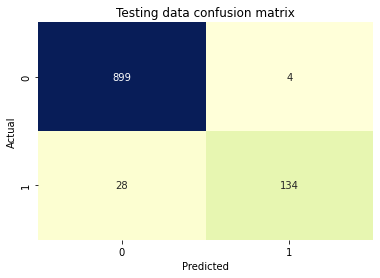

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       903
           1       0.97      0.83      0.89       162

    accuracy                           0.97      1065
   macro avg       0.97      0.91      0.94      1065
weighted avg       0.97      0.97      0.97      1065



In [ ]:
Metrics['Gradient_boosting_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97


#### Changing the cross-validation strategy for GBC

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
#temp_X = X.drop(columns=zero_imp_feature,axis=1)

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)
#X2,valid_X,Y2,valid_Y = train_test_split(temp_X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 0.93805 in 7.78 seconds.

============Training fold 1============
Fold 1 finished with score: 0.93043 in 6.02 seconds.

============Training fold 2============
Fold 2 finished with score: 0.92233 in 6.1 seconds.

============Training fold 3============
Fold 3 finished with score: 0.99099 in 7.63 seconds.

============Training fold 4============
Fold 4 finished with score: 0.9505 in 5.89 seconds.

============Training fold 5============
Fold 5 finished with score: 0.94017 in 5.95 seconds.

============Training fold 6============
Fold 6 finished with score: 0.9434 in 5.9 seconds.

============Training fold 7============
Fold 7 finished with score: 0.97849 in 5.88 seconds.

============Training fold 8============
Fold 8 finished with score: 0.94783 in 8.02 seconds.

============Training fold 9============
Fold 9 finished with score: 0.9633 in 7.46 seconds.

Average precision score is 0.9505494647029196


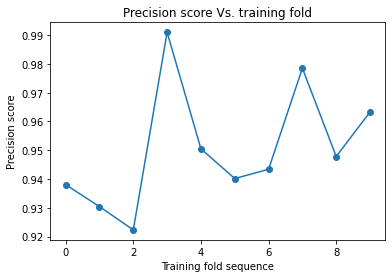

In [ ]:
#best_params
best_params = {'max_depth': 5,'min_samples_leaf': 380,'min_samples_split': 430,'n_estimators': 560,'learning_rate': 0.2682277318763267,'subsample': 0.6178,'max_features': 17}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    gbc_cv = GradientBoostingClassifier(**best_params)
    gbc_cv.fit(X_train,Y_train)
    y_pred = gbc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      7224
           1       0.99      0.96      0.98      1296

    accuracy                           0.99      8520
   macro avg       0.99      0.98      0.99      8520
weighted avg       0.99      0.99      0.99      8520



(<AxesSubplot:>, None)

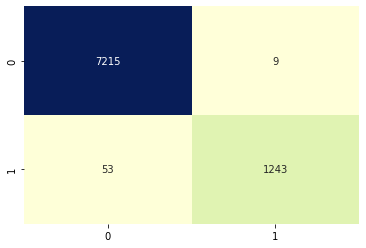

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,gbc_cv,'Gradient_Boosting',True)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1807
           1       0.96      0.80      0.87       324

    accuracy                           0.96      2131
   macro avg       0.96      0.90      0.93      2131
weighted avg       0.96      0.96      0.96      2131



(<AxesSubplot:>, None)

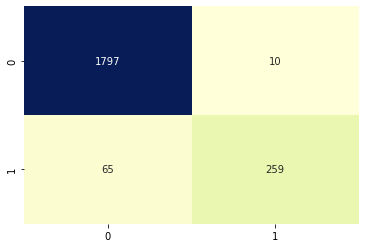

In [ ]:
checking_performance_cv(valid_X,valid_Y,gbc_cv,'Gradient_Boosting',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97,0.99,0.96
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83,0.96,0.80
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89,0.98,0.87
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99,1.00,0.98
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97,1.00,0.95


#### Feature selection on Gradient Boosting

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
print(X.shape)

(10651, 26)


In [ ]:
# sfs = SequentialFeatureSelector(gbc_cv,k_features=26,forward=True,scoring="average_precision",cv=10)

In [ ]:
# sfs.fit(X,Y)

In [ ]:
# sfs.subsets_

In [ ]:
#gradient_boosting_features.to_csv('Gradient_Boosting_Features.csv',index=False)

In [ ]:
gradient_boosting_features = pd.read_csv('/content/gdrive/MyDrive/Social Media_Tourism_Project/Gradient_Boosting_Features.csv')

In [ ]:
gbc_final_features = ['following_company_page', 'yearly_avg_Outstation_checkins', 'total_likes_on_outstation_checkin_given', 'Yearly_avg_view_on_travel_page', 'member_in_family', 'total_likes_on_outofstation_checkin_received', 'travelling_network_rating', 'Adult_flag']

In [ ]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

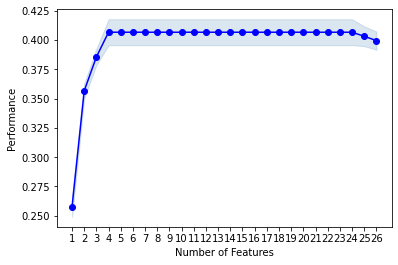

In [ ]:
plot_sfs(sfs.get_metric_dict(),kind='ci');

In [ ]:
len(gbc_final_features)

8

#### Modeling on final features for Gradient Boosting

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
X = X[gbc_final_features]

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.1,random_state=0,stratify=Y)

============Training fold 0============
Fold 0 finished with score: 0.97059 in 5.5 seconds.

============Training fold 1============
Fold 1 finished with score: 0.92086 in 5.39 seconds.

============Training fold 2============
Fold 2 finished with score: 0.95 in 5.36 seconds.

============Training fold 3============
Fold 3 finished with score: 0.94286 in 5.42 seconds.

============Training fold 4============
Fold 4 finished with score: 0.99206 in 5.43 seconds.

============Training fold 5============
Fold 5 finished with score: 0.97561 in 5.38 seconds.

============Training fold 6============
Fold 6 finished with score: 0.9542 in 5.63 seconds.

============Training fold 7============
Fold 7 finished with score: 0.96183 in 7.39 seconds.

============Training fold 8============
Fold 8 finished with score: 0.96923 in 6.52 seconds.

============Training fold 9============
Fold 9 finished with score: 0.94928 in 5.41 seconds.

Average precision score is 0.9586518601565587


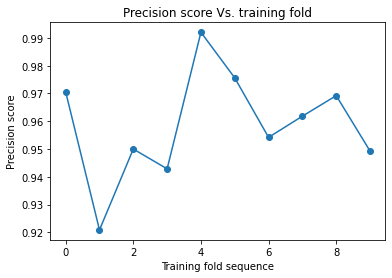

In [ ]:
#best_params
best_params = {'max_depth': 5,'min_samples_leaf': 380,'min_samples_split': 430,'n_estimators': 560,'learning_rate': 0.2682277318763267,'subsample': 0.6178,'max_features': 6}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    gbc_cv = GradientBoostingClassifier(**best_params)
    gbc_cv.fit(X_train,Y_train)
    y_pred = gbc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      8127
           1       0.99      0.95      0.97      1458

    accuracy                           0.99      9585
   macro avg       0.99      0.97      0.98      9585
weighted avg       0.99      0.99      0.99      9585



(<AxesSubplot:>, None)

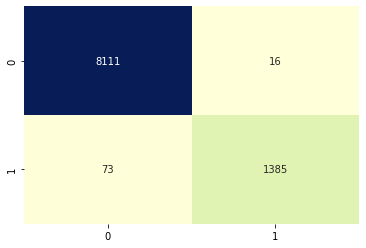

In [ ]:
checking_performance_cv(X2,Y2,gbc_cv,'Gradient_boosting_0.1_tuned_8_features',True)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       904
           1       0.96      0.82      0.89       162

    accuracy                           0.97      1066
   macro avg       0.97      0.91      0.93      1066
weighted avg       0.97      0.97      0.97      1066



(<AxesSubplot:>, None)

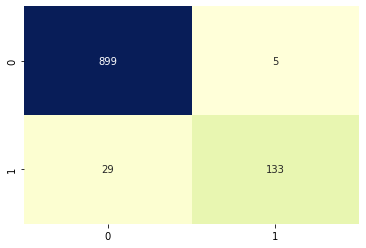

In [ ]:
checking_performance_cv(valid_X,valid_Y,gbc_cv,'Gradient_boosting_0.1_tuned_8_features',False)

### Model #5 : XGBoost

#### Using the Mobile dataset with missing values for XGBoost

In [ ]:
Mobile_missing['buy'].value_counts()

0    9031
1    1620
Name: buy, dtype: int64

In [ ]:
cat_col = Mobile_missing.select_dtypes(exclude=[np.number]).columns.tolist()

In [ ]:
data_missing = pd.get_dummies(Mobile_missing,columns=cat_col,drop_first=True)

In [ ]:
X1 = data_missing.drop('buy',axis=1)
Y1 = data_missing['buy']
X = data.drop('buy',axis=1)

In [ ]:
X1_train,X1_test,Y1_train,Y1_test = train_test_split(X1,Y1,test_size=0.3,stratify=Y1) #With_missing_values
#X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,stratify=Y) #Without_missing_values

#### Creating and fitting the XGBoost model object

In [ ]:
import xgboost

In [ ]:
from xgboost import XGBClassifier

In [ ]:
xgbc = xgboost.XGBClassifier(n_estimators=700,max_depth=8,learning_rate=1e-2,scale_pos_weight=(9031)/(1620),n_jobs=-1,missing=np.NaN)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
xgbc.fit(X1_train,Y1_train,eval_metric='aucpr',eval_set=[(X1_train,Y1_train),(X1_test,Y1_test)],verbose=False)

XGBClassifier(learning_rate=0.01, max_depth=8, n_estimators=700, n_jobs=-1,
              scale_pos_weight=5.574691358024691)

#### Plotting the XGBoost result on Training set and validation set

In [ ]:
result = xgbc.evals_result()

In [ ]:
epochs = len(result['validation_0']['aucpr'])
x_axis = range(0, epochs)

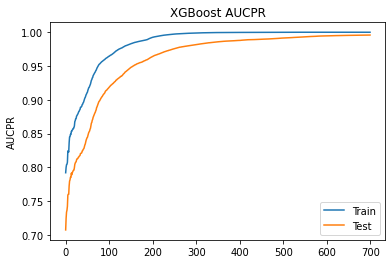

In [ ]:
fig, ax = plt.subplots()
ax.plot(x_axis, result['validation_0']['aucpr'], label='Train')
ax.plot(x_axis, result['validation_1']['aucpr'], label='Test')
ax.legend()
plt.ylabel('AUCPR')
plt.title('XGBoost AUCPR')
plt.show()

#### Predictions on XGBoost model

In [ ]:
train_pred = xgbc.predict(X1_train)
test_pred = xgbc.predict(X1_test)

In [ ]:
train_prob=xgbc.predict_proba(X1_train)
test_prob=xgbc.predict_proba(X1_test)

#### Performance metrices on XGBoost Model

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,0,1134


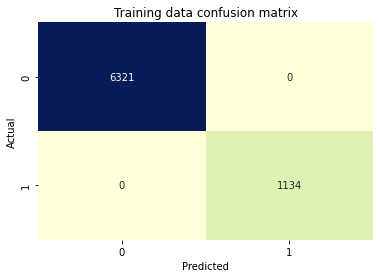

In [ ]:
plot_confusion_matrix(Y1_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y1_train,train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6321
           1       1.00      1.00      1.00      1134

    accuracy                           1.00      7455
   macro avg       1.00      1.00      1.00      7455
weighted avg       1.00      1.00      1.00      7455



,Predicted : 0,Predicted : 1
Actual : 0,2701,9
Actual : 1,15,471


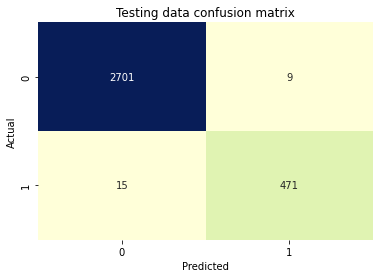

In [ ]:
plot_confusion_matrix(Y1_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y1_test,test_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2710
           1       0.98      0.97      0.98       486

    accuracy                           0.99      3196
   macro avg       0.99      0.98      0.99      3196
weighted avg       0.99      0.99      0.99      3196



In [ ]:
Metrics['XGBoost_not_tuned'] = [metrics.precision_score(Y1_test,test_pred),metrics.recall_score(Y1_test,test_pred),metrics.f1_score(Y1_test,test_pred),metrics.roc_auc_score(Y1_test,test_prob[:,1]),metrics.average_precision_score(Y1_test,test_prob[:,1])]

In [ ]:
Metrics['XGBoost_not_tuned']=Metrics['XGBoost_not_tuned'].apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.22,0.30,0.31,0.85,0.97,0.99,0.96,0.988580,0.963768,0.98
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.64,0.76,0.80,0.40,0.83,0.96,0.80,0.949931,0.820988,0.97
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.33,0.43,0.44,0.54,0.89,0.98,0.87,0.968870,0.886667,0.98
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,0.65,0.78,0.79,0.90,0.99,1.00,0.98,0.998985,0.987880,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.22,0.47,0.48,0.72,0.97,1.00,0.95,0.994917,0.963729,1.00


#### Hyperparameter tuning on XGBoost model

In [ ]:
# def objective(trial):
#   max_depth=trial.suggest_int("max_depth",3,8,step=1)
#   min_child_weight=trial.suggest_int("min_child_weight",11,20,step=1)
#   subsample=trial.suggest_float("subsample",0.2,1)
#   n_estimators=trial.suggest_int("n_estimators",100,300,step=10)
#   learning_rate=trial.suggest_float("learning_rate",0.01,0.4)
#   colsample_bytree=trial.suggest_float('colsample_by_tree',0.4,0.8)
#   colsample_bylevel=trial.suggest_float('colsample_by_level',0.2,0.8)
#   skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=1)
#   cv_scores = []
#   for (train_idx,test_idx) in (skf.split(X,Y)):
#     X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
#     X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
#     xgbc = xgboost.XGBClassifier(max_depth=max_depth,min_child_weight=min_child_weight,subsample=subsample,n_estimators=n_estimators,
#                                       learning_rate=learning_rate,colsample_bytree=colsample_bytree,
#                                 colsample_bylevel=colsample_bylevel)
#     xgbc.fit(X_train,Y_train,verbose=False,eval_metric='aucpr')
#     preds = xgbc.predict(X_test)
#     precision=metrics.precision_score(Y_test,preds)
#     cv_scores.append(precision)
#   return np.mean(cv_scores)

In [ ]:
# study_XGBoost = optuna.create_study(direction="maximize",study_name="precision-max")

In [ ]:
# study_XGBoost.optimize(objective,n_trials=50)

In [ ]:
# study_XGBoost.best_value

In [ ]:
# study_XGBoost.best_params

In [ ]:
# dict2 = study_XGBoost.best_params

In [ ]:
dict2 = {'max_depth': 7,'min_child_weight': 13,'subsample': 0.9521173695596962,'n_estimators': 300,'learning_rate': 0.2913900365247477,'colsample_by_tree': 0.7414065885342269,'colsample_by_level': 0.6058244524116809}

In [ ]:
best_xgbc = xgboost.XGBClassifier(**dict2)

In [ ]:
best_xgbc.fit(X1_train,Y1_train,eval_metric='aucpr')

XGBClassifier(colsample_by_level=0.6058244524116809,
              colsample_by_tree=0.7414065885342269,
              learning_rate=0.2913900365247477, max_depth=7,
              min_child_weight=13, n_estimators=300,
              subsample=0.9521173695596962)

#### Predictions on tuned XGBoost model

In [ ]:
train_pred = best_xgbc.predict(X1_train)
test_pred = best_xgbc.predict(X1_test)

In [ ]:
train_prob=best_xgbc.predict_proba(X1_train)
test_prob=best_xgbc.predict_proba(X1_test)

#### Performance metrices on XGBoost tuned model

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,0,1134


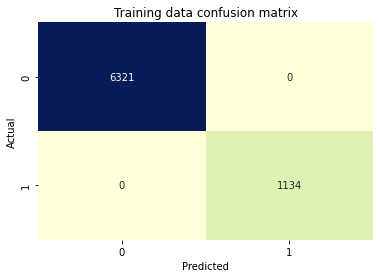

In [ ]:
plot_confusion_matrix(Y1_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y1_train,train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6321
           1       1.00      1.00      1.00      1134

    accuracy                           1.00      7455
   macro avg       1.00      1.00      1.00      7455
weighted avg       1.00      1.00      1.00      7455



,Predicted : 0,Predicted : 1
Actual : 0,2698,12
Actual : 1,33,453


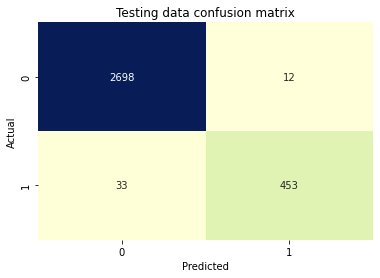

In [ ]:
plot_confusion_matrix(Y1_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y1_test,test_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2710
           1       0.97      0.93      0.95       486

    accuracy                           0.99      3196
   macro avg       0.98      0.96      0.97      3196
weighted avg       0.99      0.99      0.99      3196



In [ ]:
Metrics['XGBoost_tuned'] = [metrics.precision_score(Y1_test,test_pred),metrics.recall_score(Y1_test,test_pred),metrics.f1_score(Y1_test,test_pred),metrics.roc_auc_score(Y1_test,test_prob[:,1]),metrics.average_precision_score(Y1_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.30,0.31,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.76,0.80,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.43,0.44,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,0.78,0.79,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.47,0.48,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99


#### Changing the cross-validation strategy for XGBoost model

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
#temp_X = X.drop(columns=zero_imp_feature,axis=1)

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X1,Y1,test_size=0.2,random_state=0,stratify=Y1)
#X2,valid_X,Y2,valid_Y = train_test_split(temp_X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 1.0 in 4.58 seconds.

============Training fold 1============
Fold 1 finished with score: 0.98347 in 4.55 seconds.

============Training fold 2============
Fold 2 finished with score: 1.0 in 6.29 seconds.

============Training fold 3============
Fold 3 finished with score: 1.0 in 4.57 seconds.

============Training fold 4============
Fold 4 finished with score: 1.0 in 4.53 seconds.

============Training fold 5============
Fold 5 finished with score: 0.98425 in 4.55 seconds.

============Training fold 6============
Fold 6 finished with score: 1.0 in 4.48 seconds.

============Training fold 7============
Fold 7 finished with score: 0.99099 in 4.5 seconds.

============Training fold 8============
Fold 8 finished with score: 1.0 in 4.52 seconds.

============Training fold 9============
Fold 9 finished with score: 0.99167 in 4.5 seconds.

Average precision score is 0.9950380700541761


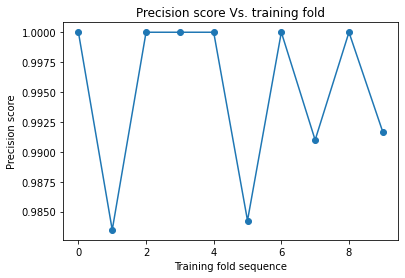

In [ ]:
#best_params
best_params = {'max_depth': 7,'min_child_weight': 1,'subsample': 0.7815313217386805,'n_estimators': 350,'learning_rate': 0.06615549649335126,'colsample_bytree': 0.7492277206661779,'colsample_bylevel': 0.6931572316515358}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    xgbc_cv = xgboost.XGBClassifier(**best_params)
    xgbc_cv.fit(X_train,Y_train,eval_metric='aucpr')
    y_pred = xgbc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7224
           1       1.00      0.99      1.00      1296

    accuracy                           1.00      8520
   macro avg       1.00      1.00      1.00      8520
weighted avg       1.00      1.00      1.00      8520



(<AxesSubplot:>, None)

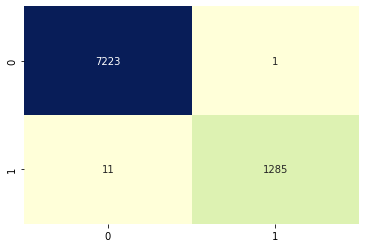

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,xgbc_cv,'XGBoost',True)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1807
           1       1.00      0.91      0.95       324

    accuracy                           0.99      2131
   macro avg       0.99      0.95      0.97      2131
weighted avg       0.99      0.99      0.99      2131



(<AxesSubplot:>, None)

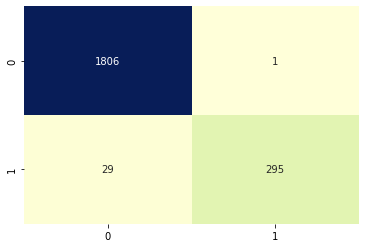

In [ ]:
checking_performance_cv(valid_X,valid_Y,xgbc_cv,'XGBoost',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97,1.00,1.00
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93,0.99,0.91
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95,1.00,0.95
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00,1.00,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.99


#### Feature selection on Extreme Gradient Boosting

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
print(X.shape)

(10651, 26)


In [ ]:
# sfs = SequentialFeatureSelector(xgbc_cv,k_features=26,forward=True,scoring="average_precision",cv=10)

In [ ]:
#sfs.fit(X,Y,eval_metric='aucpr')

In [ ]:
#sfs.subsets_

In [ ]:
# XGBoost_features=pd.DataFrame(data=sfs.subsets_).T
# XGBoost_features.to_csv('XGBoost_features')

In [ ]:
XGBoost_features = pd.read_csv('/content/gdrive/MyDrive/Social Media_Tourism_Project/XGBoost_features.csv')

In [ ]:
# from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [ ]:
# plot_sfs(sfs.get_metric_dict(),kind='ci')

In [ ]:
# XGBoost_features.to_csv('XGBoost_features.csv')

In [ ]:
xgb_final_features = ['Yearly_avg_view_on_travel_page','total_likes_on_outstation_checkin_given','yearly_avg_Outstation_checkins','total_likes_on_outofstation_checkin_received','travelling_network_rating']

In [ ]:
len(xgb_final_features)

5

#### Modeling on final features for XGBoost

In [ ]:
X1 = X1[xgb_final_features]

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X1,Y1,test_size=0.1,random_state=0,stratify=Y1)

In [ ]:
import xgboost as xgb

============Training fold 0============
Fold 0 finished with score: 0.98473 in 2.8 seconds.

============Training fold 1============
Fold 1 finished with score: 0.97101 in 2.76 seconds.

============Training fold 2============
Fold 2 finished with score: 0.97761 in 2.73 seconds.

============Training fold 3============
Fold 3 finished with score: 0.96479 in 2.75 seconds.

============Training fold 4============
Fold 4 finished with score: 0.97674 in 3.28 seconds.

============Training fold 5============
Fold 5 finished with score: 1.0 in 4.12 seconds.

============Training fold 6============
Fold 6 finished with score: 0.97015 in 2.77 seconds.

============Training fold 7============
Fold 7 finished with score: 0.992 in 2.76 seconds.

============Training fold 8============
Fold 8 finished with score: 0.99194 in 2.75 seconds.

============Training fold 9============
Fold 9 finished with score: 0.97826 in 2.75 seconds.

Average precision score is 0.9807237783088019


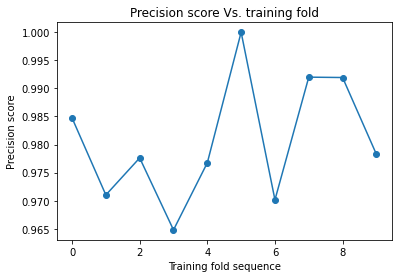

In [ ]:
#best_params
best_params = dict2
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    xgbc_cv = xgb.XGBClassifier(**best_params)
    xgbc_cv.fit(X_train,Y_train,eval_metric='aucpr')
    y_pred = xgbc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8127
           1       1.00      0.98      0.99      1458

    accuracy                           1.00      9585
   macro avg       1.00      0.99      0.99      9585
weighted avg       1.00      1.00      1.00      9585



(<AxesSubplot:>, None)

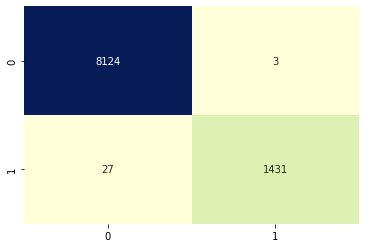

In [ ]:
checking_performance_cv(X2,Y2,xgbc_cv,'Xtreme_Gradient_boosting_0.1_tuned_5_features',True)

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       904
           1       0.96      0.86      0.91       162

    accuracy                           0.97      1066
   macro avg       0.97      0.93      0.94      1066
weighted avg       0.97      0.97      0.97      1066



(<AxesSubplot:>, None)

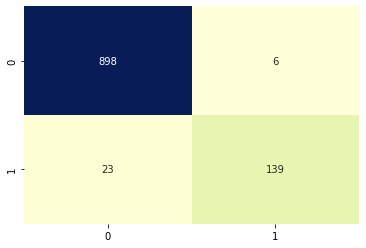

In [ ]:
checking_performance_cv(valid_X,valid_Y,xgbc_cv,'Xtreme_Gradient_boosting_0.1_tuned_5_features',False)

In [ ]:
Metrics.T

,Precision,Recall,F1-score,AUROC,AUPRC
Decision_tree_not_tuned,0.900000,0.900000,0.900000,0.940000,0.820000
Decision_tree_tuned,0.660000,0.200000,0.310000,0.750000,0.380000
Decision_tree_0.2_tuned_cv_updated_train,0.670000,0.200000,0.310000,0.770000,0.390000
Decision_tree_0.2_tuned_cv_updated_test,0.690000,0.190000,0.290000,0.770000,0.390000
decision_tree_0.1_tuned_4_features_cv_updated_train,0.680000,0.200000,0.310000,0.750000,0.380000
decision_tree_0.1_tuned_4_features_cv_updated_test,0.680000,0.190000,0.290000,0.720000,0.360000
Random_forest_not_tuned,0.340000,0.730000,0.460000,0.800000,0.490000
Random_forest_tuned,0.310000,0.630000,0.420000,0.780000,0.470000
random_forest_tuned_cv_updated_train,0.370000,0.770000,0.500000,0.840000,0.560000
random_forest_tuned_cv_updated_test,0.360000,0.760000,0.490000,0.840000,0.550000


### Model #6 : Support Vector Classifier

#### Creating the SVC object and fitting on the training dataset

In [ ]:
from sklearn.svm import SVC

In [ ]:
clf = SVC(C=4,kernel='rbf',probability=True,class_weight='balanced')

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,stratify=Y)

In [ ]:
clf.fit(X_train,Y_train)

SVC(C=4, class_weight='balanced', probability=True)

#### Predictions on SVC 

In [ ]:
train_pred = clf.predict(X_train)
test_pred = clf.predict(X_test)

In [ ]:
train_prob=clf.predict_proba(X_train)
test_prob=clf.predict_proba(X_test)

#### Performance metrices for SVC

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,3114,3207
Actual : 1,323,811


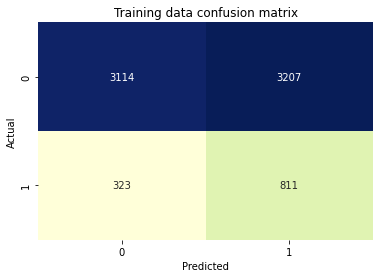

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.91      0.49      0.64      6321
           1       0.20      0.72      0.31      1134

    accuracy                           0.53      7455
   macro avg       0.55      0.60      0.48      7455
weighted avg       0.80      0.53      0.59      7455



,Predicted : 0,Predicted : 1
Actual : 0,1389,1321
Actual : 1,152,334


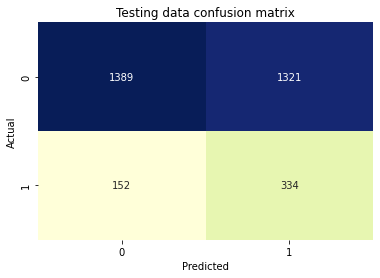

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.90      0.51      0.65      2710
           1       0.20      0.69      0.31       486

    accuracy                           0.54      3196
   macro avg       0.55      0.60      0.48      3196
weighted avg       0.79      0.54      0.60      3196



In [ ]:
Metrics['Support_vector_not_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics['Support_vector_not_tuned']=Metrics['Support_vector_not_tuned'].apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.96,0.99,0.96,0.98,0.97,1.00,1.00,0.997908,0.958621,0.20
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.80,0.95,0.82,0.97,0.93,0.99,0.91,0.981481,0.858025,0.69
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.87,0.97,0.89,0.98,0.95,1.00,0.95,0.989627,0.905537,0.31
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,0.98,1.00,0.99,1.00,1.00,1.00,1.00,0.999727,0.986514,0.66
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.95,0.99,0.96,1.00,0.99,1.00,0.99,0.998917,0.950005,0.29


#### Hyperparameter tuning on SVC

In [ ]:
# def objective(trial,data=X,target=Y):
#   C=trial.suggest_float("max_depth",0.1,100,step=0.1)
#   kernel=trial.suggest_categorical("kernel",['rbf','poly','sigmoid'])
#   gamma = trial.suggest_float('gamma',1e-5,1,log=True)
#   skf = StratifiedKFold(n_splits=10,shuffle=True,random_state=1)
#   cv_scores = []
#   for (train_idx,test_idx) in (skf.split(X,Y)):
#     X_train,Y_train = X.iloc[train_idx],Y.iloc[train_idx]
#     X_test,Y_test = X.iloc[test_idx],Y.iloc[test_idx]
#     clf = SVC(C=C,kernel=kernel,probability=True,class_weight='balanced')
#     clf.fit(X_train,Y_train)
#     preds = clf.predict(X_test)
#     precision=metrics.precision_score(Y_test,preds)
#     cv_scores.append(precision)
#   return np.mean(cv_scores)

In [ ]:
# study = optuna.create_study(direction="maximize",study_name="precision-max")

In [ ]:
# study.optimize(objective,n_trials=10)

In [ ]:
# study.best_value

In [ ]:
# study.best_trial

In [ ]:
# study.best_params
dict3 = {'max_depth': 99.6, 'kernel': 'rbf', 'gamma': 0.6329258184309642}

In [ ]:
dict3['C'] = dict3['max_depth']

In [ ]:
del dict3['max_depth']

In [ ]:
dict3 = {'C': 99.6, 'kernel': 'rbf', 'gamma': 0.6329258184309642}

In [ ]:
best_svm = SVC(**dict3,probability=True,class_weight='balanced')

In [ ]:
best_svm.fit(X_train,Y_train)

SVC(C=99.6, class_weight='balanced', gamma=0.6329258184309642, probability=True)

#### Predictions on tuned SVC

In [ ]:
train_pred = best_svm.predict(X_train)
test_pred = best_svm.predict(X_test)

In [ ]:
train_prob=best_svm.predict_proba(X_train)
test_prob=best_svm.predict_proba(X_test)

#### Performance metrices on tuned SVC

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,0,1134


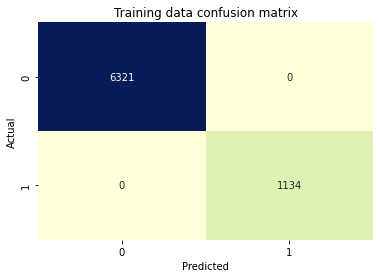

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6321
           1       1.00      1.00      1.00      1134

    accuracy                           1.00      7455
   macro avg       1.00      1.00      1.00      7455
weighted avg       1.00      1.00      1.00      7455



,Predicted : 0,Predicted : 1
Actual : 0,2710,0
Actual : 1,409,77


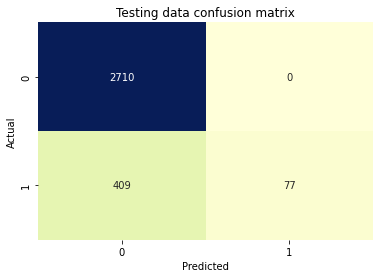

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      2710
           1       1.00      0.16      0.27       486

    accuracy                           0.87      3196
   macro avg       0.93      0.58      0.60      3196
weighted avg       0.89      0.87      0.83      3196



In [ ]:
Metrics['SVM_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.99,0.96,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.95,0.82,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.97,0.89,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.99,0.96,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38


#### Changing the cross-validation strategy for tuned SVC

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 1.0 in 37.02 seconds.

============Training fold 1============
Fold 1 finished with score: 1.0 in 36.26 seconds.

============Training fold 2============
Fold 2 finished with score: 1.0 in 34.04 seconds.

============Training fold 3============
Fold 3 finished with score: 1.0 in 38.39 seconds.

============Training fold 4============
Fold 4 finished with score: 1.0 in 37.35 seconds.

============Training fold 5============
Fold 5 finished with score: 1.0 in 33.8 seconds.

============Training fold 6============
Fold 6 finished with score: 1.0 in 37.73 seconds.

============Training fold 7============
Fold 7 finished with score: 1.0 in 36.18 seconds.

============Training fold 8============
Fold 8 finished with score: 1.0 in 35.31 seconds.

============Training fold 9============
Fold 9 finished with score: 1.0 in 37.01 seconds.

Average precision score is 1.0


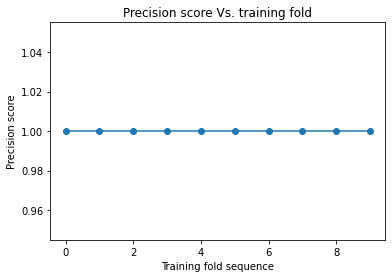

In [ ]:
#best_params
best_params = {'C': 99.6, 'kernel': 'rbf', 'gamma': 0.6329258184309642}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    clf = SVC(**best_params,class_weight='balanced',probability=True)    
    clf.fit(X_train,Y_train)
    y_pred = clf.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      7224
           1       1.00      0.92      0.96      1296

    accuracy                           0.99      8520
   macro avg       0.99      0.96      0.97      8520
weighted avg       0.99      0.99      0.99      8520



(<AxesSubplot:>, None)

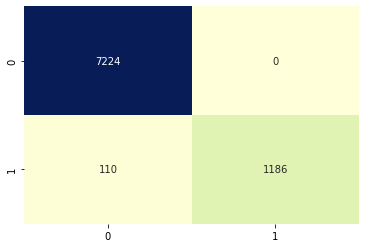

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,clf,'SVM',True)

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1807
           1       1.00      0.17      0.29       324

    accuracy                           0.87      2131
   macro avg       0.94      0.58      0.61      2131
weighted avg       0.89      0.87      0.83      2131



(<AxesSubplot:>, None)

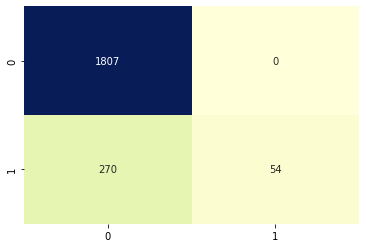

In [ ]:
checking_performance_cv(valid_X,valid_Y,clf,'SVM',False)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38


### Model #7 : LightGBM

#### Creating the LightGBM object and fitting on the one-hot encoded training dataset

In [ ]:
lgbc = lgb.LGBMClassifier()

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
# cat_col1=Mobile.select_dtypes(exclude=[np.number]).columns.tolist()
# cont_col1=Mobile.select_dtypes(include=[np.number]).columns.tolist()

In [ ]:
# X1 = Mobile.drop('buy',axis=1)
# Y1 = Mobile['buy']

In [ ]:
# cat_idx = [X1.columns.get_loc(col) for col in cat_col1]

In [ ]:
# for col in cat_col1:
#     X1[col] = pd.Categorical(X1[col])

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1,stratify=Y)

In [ ]:
lgbc.fit(X_train,Y_train)

LGBMClassifier()

#### Predictions on LightGBM dataset

In [ ]:
train_pred = lgbc.predict(X_train)
test_pred = lgbc.predict(X_test)

In [ ]:
train_prob=lgbc.predict_proba(X_train)
test_prob=lgbc.predict_proba(X_test)

#### Performance metrices of LightGBM model

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,38,1096


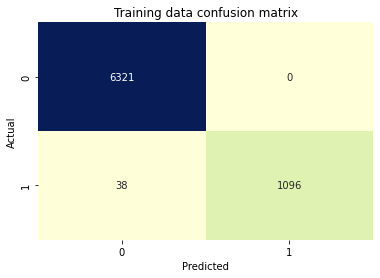

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      6321
           1       1.00      0.97      0.98      1134

    accuracy                           0.99      7455
   macro avg       1.00      0.98      0.99      7455
weighted avg       0.99      0.99      0.99      7455



,Predicted : 0,Predicted : 1
Actual : 0,2707,3
Actual : 1,69,417


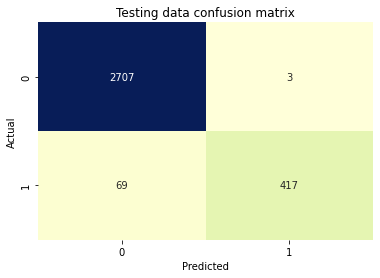

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2710
           1       0.99      0.86      0.92       486

    accuracy                           0.98      3196
   macro avg       0.98      0.93      0.95      3196
weighted avg       0.98      0.98      0.98      3196



In [ ]:
Metrics['LightGBM_non_encoded_not_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics['LightGBM_non_encoded_not_tuned']=Metrics['LightGBM_non_encoded_not_tuned'].apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99


#### Hyperparameter tuning of LightGBM Model

In [ ]:
def objective(trial):
    n_estimators=trial.suggest_int("n_estimators",100,500,step=10)
    learning_rate=trial.suggest_float("learning_rate",1e-7,0.8,log=True)
    max_depth=trial.suggest_int("max_depth",3,8,step=1)
    min_split_gain=trial.suggest_float("min_split_gain",0.0001,1.5,log=True)
    min_child_weight=trial.suggest_int("min_child_weight",1,15,step=1)
    min_child_samples=trial.suggest_int("min_child_samples",15,50,step=5)
    subsample=trial.suggest_float("subsample",0.5,1,log=True)
    colsample_bytree=trial.suggest_float("colsample_bytree",0.5,1,log=True)
    reg_lambda=trial.suggest_int("reg_lambda",0,50,step=1)
    reg_alpha=trial.suggest_int("reg_alpha",0,50,step=1)
    skf = StratifiedKFold(n_splits=10,random_state=1,shuffle=True)
    cv_scores = []
    for (train_idx,test_idx) in (skf.split(X,Y)):
      X1_train,Y1_train = X1.iloc[train_idx],Y1.iloc[train_idx]
      X1_test,Y1_test = X1.iloc[test_idx],Y1.iloc[test_idx]
      lgbc = lgb.LGBMClassifier(n_estimators=n_estimators,learning_rate=learning_rate,
                            max_depth=max_depth,min_child_weight=min_child_weight,
                            subsample=subsample,colsample_bytree=colsample_bytree,reg_lambda=reg_lambda,
                            reg_alpha=reg_alpha,min_split_gain=min_split_gain,class_weight='balanced')
      lgbc.fit(X1_train,Y1_train,eval_set=[(X1_test,Y1_test)],early_stopping_rounds=100)
      preds = lgbc.predict(X1_test)
      precision=metrics.precision_score(Y1_test,preds)
      cv_scores.append(precision)
    return np.mean(cv_scores)

In [ ]:
study_lgb = optuna.create_study(direction="maximize",study_name="max-precision")

[I 2022-11-22 20:07:57,951] A new study created in memory with name: max-precision


In [ ]:
study_lgb.optimize(objective,n_trials=50)

[1]	valid_0's binary_logloss: 0.693147
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.693147
[3]	valid_0's binary_logloss: 0.693147
[4]	valid_0's binary_logloss: 0.693147
[5]	valid_0's binary_logloss: 0.693147
[6]	valid_0's binary_logloss: 0.693147
[7]	valid_0's binary_logloss: 0.693147
[8]	valid_0's binary_logloss: 0.693147
[9]	valid_0's binary_logloss: 0.693147
[10]	valid_0's binary_logloss: 0.693147
[11]	valid_0's binary_logloss: 0.693147
[12]	valid_0's binary_logloss: 0.693147
[13]	valid_0's binary_logloss: 0.693147
[14]	valid_0's binary_logloss: 0.693147
[15]	valid_0's binary_logloss: 0.693147
[16]	valid_0's binary_logloss: 0.693147
[17]	valid_0's binary_logloss: 0.693147
[18]	valid_0's binary_logloss: 0.693147
[19]	valid_0's binary_logloss: 0.693147
[20]	valid_0's binary_logloss: 0.693147
[21]	valid_0's binary_logloss: 0.693147
[22]	valid_0's binary_logloss: 0.693147
[23]	valid_0's binary_logloss: 0.693147
[24]	valid_0's binary_logl

[I 2022-11-22 20:08:00,808] Trial 0 finished with value: 0.28402666955013217 and parameters: {'n_estimators': 150, 'learning_rate': 3.5496559333729875e-07, 'max_depth': 7, 'min_split_gain': 0.010437738920148518, 'min_child_weight': 13, 'min_child_samples': 35, 'subsample': 0.6936378189828462, 'colsample_bytree': 0.5479969756168936, 'reg_lambda': 39, 'reg_alpha': 42}. Best is trial 0 with value: 0.28402666955013217.


[138]	valid_0's binary_logloss: 0.693144
[139]	valid_0's binary_logloss: 0.693144
[140]	valid_0's binary_logloss: 0.693144
[141]	valid_0's binary_logloss: 0.693144
[142]	valid_0's binary_logloss: 0.693144
[143]	valid_0's binary_logloss: 0.693144
[144]	valid_0's binary_logloss: 0.693144
[145]	valid_0's binary_logloss: 0.693144
[146]	valid_0's binary_logloss: 0.693144
[147]	valid_0's binary_logloss: 0.693144
[148]	valid_0's binary_logloss: 0.693144
[149]	valid_0's binary_logloss: 0.693144
[150]	valid_0's binary_logloss: 0.693144
Did not meet early stopping. Best iteration is:
[150]	valid_0's binary_logloss: 0.693144
[1]	valid_0's binary_logloss: 0.690352
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.688197
[3]	valid_0's binary_logloss: 0.68696
[4]	valid_0's binary_logloss: 0.684395
[5]	valid_0's binary_logloss: 0.682047
[6]	valid_0's binary_logloss: 0.679979
[7]	valid_0's binary_logloss: 0.678051
[8]	valid_0's binary_logloss: 0.675658
[9]	

[I 2022-11-22 20:08:07,419] Trial 1 finished with value: 0.39991795721257184 and parameters: {'n_estimators': 280, 'learning_rate': 0.018929564012050305, 'max_depth': 8, 'min_split_gain': 0.0011815271502783908, 'min_child_weight': 10, 'min_child_samples': 45, 'subsample': 0.6436749233697638, 'colsample_bytree': 0.6720900385739406, 'reg_lambda': 15, 'reg_alpha': 26}. Best is trial 1 with value: 0.39991795721257184.


[1]	valid_0's binary_logloss: 0.691803
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.690622
[3]	valid_0's binary_logloss: 0.689311
[4]	valid_0's binary_logloss: 0.688242
[5]	valid_0's binary_logloss: 0.686966
[6]	valid_0's binary_logloss: 0.686178
[7]	valid_0's binary_logloss: 0.685036
[8]	valid_0's binary_logloss: 0.683801
[9]	valid_0's binary_logloss: 0.682514
[10]	valid_0's binary_logloss: 0.68138
[11]	valid_0's binary_logloss: 0.680396
[12]	valid_0's binary_logloss: 0.679652
[13]	valid_0's binary_logloss: 0.678443
[14]	valid_0's binary_logloss: 0.677254
[15]	valid_0's binary_logloss: 0.676212
[16]	valid_0's binary_logloss: 0.675256
[17]	valid_0's binary_logloss: 0.674597
[18]	valid_0's binary_logloss: 0.673895
[19]	valid_0's binary_logloss: 0.672734
[20]	valid_0's binary_logloss: 0.671542
[21]	valid_0's binary_logloss: 0.670411
[22]	valid_0's binary_logloss: 0.669457
[23]	valid_0's binary_logloss: 0.668353
[24]	valid_0's binary_loglo

[I 2022-11-22 20:08:11,382] Trial 2 finished with value: 0.3457799122123161 and parameters: {'n_estimators': 150, 'learning_rate': 0.008126960020762969, 'max_depth': 8, 'min_split_gain': 0.024366403391945804, 'min_child_weight': 10, 'min_child_samples': 40, 'subsample': 0.6211548708404814, 'colsample_bytree': 0.8676381136994876, 'reg_lambda': 6, 'reg_alpha': 31}. Best is trial 1 with value: 0.39991795721257184.


[101]	valid_0's binary_logloss: 0.612204
[102]	valid_0's binary_logloss: 0.611605
[103]	valid_0's binary_logloss: 0.610888
[104]	valid_0's binary_logloss: 0.610172
[105]	valid_0's binary_logloss: 0.60964
[106]	valid_0's binary_logloss: 0.608908
[107]	valid_0's binary_logloss: 0.608226
[108]	valid_0's binary_logloss: 0.607752
[109]	valid_0's binary_logloss: 0.607156
[110]	valid_0's binary_logloss: 0.606672
[111]	valid_0's binary_logloss: 0.605971
[112]	valid_0's binary_logloss: 0.605327
[113]	valid_0's binary_logloss: 0.604732
[114]	valid_0's binary_logloss: 0.604162
[115]	valid_0's binary_logloss: 0.6036
[116]	valid_0's binary_logloss: 0.603079
[117]	valid_0's binary_logloss: 0.602413
[118]	valid_0's binary_logloss: 0.601786
[119]	valid_0's binary_logloss: 0.601375
[120]	valid_0's binary_logloss: 0.600816
[121]	valid_0's binary_logloss: 0.600367
[122]	valid_0's binary_logloss: 0.599927
[123]	valid_0's binary_logloss: 0.599393
[124]	valid_0's binary_logloss: 0.598932
[125]	valid_0's bin

[I 2022-11-22 20:08:14,589] Trial 3 finished with value: 0.3040504634426626 and parameters: {'n_estimators': 200, 'learning_rate': 0.040646363623288655, 'max_depth': 4, 'min_split_gain': 0.25910086891841716, 'min_child_weight': 6, 'min_child_samples': 45, 'subsample': 0.641153691546415, 'colsample_bytree': 0.7685134360109424, 'reg_lambda': 25, 'reg_alpha': 46}. Best is trial 1 with value: 0.39991795721257184.


[64]	valid_0's binary_logloss: 0.59817
[65]	valid_0's binary_logloss: 0.59778
[66]	valid_0's binary_logloss: 0.597342
[67]	valid_0's binary_logloss: 0.596777
[68]	valid_0's binary_logloss: 0.596094
[69]	valid_0's binary_logloss: 0.595739
[70]	valid_0's binary_logloss: 0.595691
[71]	valid_0's binary_logloss: 0.595401
[72]	valid_0's binary_logloss: 0.59522
[73]	valid_0's binary_logloss: 0.594429
[74]	valid_0's binary_logloss: 0.593854
[75]	valid_0's binary_logloss: 0.593162
[76]	valid_0's binary_logloss: 0.592342
[77]	valid_0's binary_logloss: 0.591821
[78]	valid_0's binary_logloss: 0.591573
[79]	valid_0's binary_logloss: 0.591236
[80]	valid_0's binary_logloss: 0.590709
[81]	valid_0's binary_logloss: 0.590586
[82]	valid_0's binary_logloss: 0.590508
[83]	valid_0's binary_logloss: 0.589771
[84]	valid_0's binary_logloss: 0.589432
[85]	valid_0's binary_logloss: 0.589136
[86]	valid_0's binary_logloss: 0.588413
[87]	valid_0's binary_logloss: 0.587453
[88]	valid_0's binary_logloss: 0.587169
[89

[I 2022-11-22 20:08:22,194] Trial 4 finished with value: 0.5769982513121404 and parameters: {'n_estimators': 390, 'learning_rate': 0.08251731181591486, 'max_depth': 5, 'min_split_gain': 0.13251854694341764, 'min_child_weight': 14, 'min_child_samples': 35, 'subsample': 0.6842882095473779, 'colsample_bytree': 0.8272485300686409, 'reg_lambda': 37, 'reg_alpha': 0}. Best is trial 4 with value: 0.5769982513121404.


[388]	valid_0's binary_logloss: 0.30673
[389]	valid_0's binary_logloss: 0.306476
[390]	valid_0's binary_logloss: 0.306352
Did not meet early stopping. Best iteration is:
[390]	valid_0's binary_logloss: 0.306352
[1]	valid_0's binary_logloss: 0.693145
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.693143
[3]	valid_0's binary_logloss: 0.693142
[4]	valid_0's binary_logloss: 0.693139
[5]	valid_0's binary_logloss: 0.693137
[6]	valid_0's binary_logloss: 0.693135
[7]	valid_0's binary_logloss: 0.693132
[8]	valid_0's binary_logloss: 0.69313
[9]	valid_0's binary_logloss: 0.693128
[10]	valid_0's binary_logloss: 0.693126
[11]	valid_0's binary_logloss: 0.693124
[12]	valid_0's binary_logloss: 0.693123
[13]	valid_0's binary_logloss: 0.69312
[14]	valid_0's binary_logloss: 0.693118
[15]	valid_0's binary_logloss: 0.693116
[16]	valid_0's binary_logloss: 0.693115
[17]	valid_0's binary_logloss: 0.693114
[18]	valid_0's binary_logloss: 0.693112
[19]	valid_0's bi

[I 2022-11-22 20:08:28,490] Trial 5 finished with value: 0.2676398680611112 and parameters: {'n_estimators': 410, 'learning_rate': 2.175375083315148e-05, 'max_depth': 3, 'min_split_gain': 0.08318352020862359, 'min_child_weight': 10, 'min_child_samples': 45, 'subsample': 0.8447694493385557, 'colsample_bytree': 0.6113315560697139, 'reg_lambda': 27, 'reg_alpha': 6}. Best is trial 4 with value: 0.5769982513121404.


[360]	valid_0's binary_logloss: 0.692471
[361]	valid_0's binary_logloss: 0.692468
[362]	valid_0's binary_logloss: 0.692466
[363]	valid_0's binary_logloss: 0.692464
[364]	valid_0's binary_logloss: 0.692462
[365]	valid_0's binary_logloss: 0.692459
[366]	valid_0's binary_logloss: 0.692457
[367]	valid_0's binary_logloss: 0.692455
[368]	valid_0's binary_logloss: 0.692453
[369]	valid_0's binary_logloss: 0.69245
[370]	valid_0's binary_logloss: 0.692448
[371]	valid_0's binary_logloss: 0.692447
[372]	valid_0's binary_logloss: 0.692445
[373]	valid_0's binary_logloss: 0.692444
[374]	valid_0's binary_logloss: 0.692442
[375]	valid_0's binary_logloss: 0.69244
[376]	valid_0's binary_logloss: 0.692439
[377]	valid_0's binary_logloss: 0.692436
[378]	valid_0's binary_logloss: 0.692434
[379]	valid_0's binary_logloss: 0.692433
[380]	valid_0's binary_logloss: 0.692432
[381]	valid_0's binary_logloss: 0.69243
[382]	valid_0's binary_logloss: 0.692428
[383]	valid_0's binary_logloss: 0.692426
[384]	valid_0's bin

[I 2022-11-22 20:08:39,272] Trial 6 finished with value: 0.3026261609032958 and parameters: {'n_estimators': 470, 'learning_rate': 0.0012487703640259489, 'max_depth': 7, 'min_split_gain': 0.08060763667909028, 'min_child_weight': 10, 'min_child_samples': 15, 'subsample': 0.6397540444711382, 'colsample_bytree': 0.8438047307204191, 'reg_lambda': 35, 'reg_alpha': 42}. Best is trial 4 with value: 0.5769982513121404.


[418]	valid_0's binary_logloss: 0.65091
[419]	valid_0's binary_logloss: 0.65083
[420]	valid_0's binary_logloss: 0.650743
[421]	valid_0's binary_logloss: 0.650666
[422]	valid_0's binary_logloss: 0.65058
[423]	valid_0's binary_logloss: 0.650505
[424]	valid_0's binary_logloss: 0.650428
[425]	valid_0's binary_logloss: 0.650343
[426]	valid_0's binary_logloss: 0.65028
[427]	valid_0's binary_logloss: 0.650216
[428]	valid_0's binary_logloss: 0.650139
[429]	valid_0's binary_logloss: 0.650059
[430]	valid_0's binary_logloss: 0.64998
[431]	valid_0's binary_logloss: 0.649917
[432]	valid_0's binary_logloss: 0.649853
[433]	valid_0's binary_logloss: 0.649768
[434]	valid_0's binary_logloss: 0.649705
[435]	valid_0's binary_logloss: 0.649631
[436]	valid_0's binary_logloss: 0.649552
[437]	valid_0's binary_logloss: 0.649488
[438]	valid_0's binary_logloss: 0.649426
[439]	valid_0's binary_logloss: 0.649352
[440]	valid_0's binary_logloss: 0.649289
[441]	valid_0's binary_logloss: 0.649208
[442]	valid_0's binar

[I 2022-11-22 20:08:49,020] Trial 7 finished with value: 0.32928867396353606 and parameters: {'n_estimators': 380, 'learning_rate': 0.0039860901384005405, 'max_depth': 6, 'min_split_gain': 0.24888425005831802, 'min_child_weight': 9, 'min_child_samples': 30, 'subsample': 0.7765089339214714, 'colsample_bytree': 0.7040233494923509, 'reg_lambda': 46, 'reg_alpha': 23}. Best is trial 4 with value: 0.5769982513121404.



[374]	valid_0's binary_logloss: 0.602541
[375]	valid_0's binary_logloss: 0.602313
[376]	valid_0's binary_logloss: 0.602198
[377]	valid_0's binary_logloss: 0.602025
[378]	valid_0's binary_logloss: 0.601873
[379]	valid_0's binary_logloss: 0.601749
[380]	valid_0's binary_logloss: 0.601638
Did not meet early stopping. Best iteration is:
[380]	valid_0's binary_logloss: 0.601638
[1]	valid_0's binary_logloss: 0.693092
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.693043
[3]	valid_0's binary_logloss: 0.693022
[4]	valid_0's binary_logloss: 0.692972
[5]	valid_0's binary_logloss: 0.69292
[6]	valid_0's binary_logloss: 0.69287
[7]	valid_0's binary_logloss: 0.692821
[8]	valid_0's binary_logloss: 0.692763
[9]	valid_0's binary_logloss: 0.692713
[10]	valid_0's binary_logloss: 0.692656
[11]	valid_0's binary_logloss: 0.692598
[12]	valid_0's binary_logloss: 0.692577
[13]	valid_0's binary_logloss: 0.69252
[14]	valid_0's binary_logloss: 0.692465
[15]	valid_0

[I 2022-11-22 20:08:59,822] Trial 8 finished with value: 0.2980151645302347 and parameters: {'n_estimators': 380, 'learning_rate': 0.0004884053132730168, 'max_depth': 6, 'min_split_gain': 0.0022114468828261387, 'min_child_weight': 14, 'min_child_samples': 40, 'subsample': 0.7519299395830559, 'colsample_bytree': 0.755823821018107, 'reg_lambda': 30, 'reg_alpha': 32}. Best is trial 4 with value: 0.5769982513121404.


[368]	valid_0's binary_logloss: 0.677274
[369]	valid_0's binary_logloss: 0.67721
[370]	valid_0's binary_logloss: 0.677166
[371]	valid_0's binary_logloss: 0.677141
[372]	valid_0's binary_logloss: 0.677096
[373]	valid_0's binary_logloss: 0.677081
[374]	valid_0's binary_logloss: 0.677052
[375]	valid_0's binary_logloss: 0.676989
[376]	valid_0's binary_logloss: 0.67696
[377]	valid_0's binary_logloss: 0.676916
[378]	valid_0's binary_logloss: 0.676872
[379]	valid_0's binary_logloss: 0.676838
[380]	valid_0's binary_logloss: 0.676823
Did not meet early stopping. Best iteration is:
[380]	valid_0's binary_logloss: 0.676823
[1]	valid_0's binary_logloss: 0.691883
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.690806
[3]	valid_0's binary_logloss: 0.690145
[4]	valid_0's binary_logloss: 0.689047
[5]	valid_0's binary_logloss: 0.687907
[6]	valid_0's binary_logloss: 0.686833
[7]	valid_0's binary_logloss: 0.685805
[8]	valid_0's binary_logloss: 0.684759
[9]	v

[I 2022-11-22 20:09:03,352] Trial 9 finished with value: 0.3719890236720621 and parameters: {'n_estimators': 160, 'learning_rate': 0.007254812283768577, 'max_depth': 5, 'min_split_gain': 0.005916465363120048, 'min_child_weight': 15, 'min_child_samples': 35, 'subsample': 0.5728036987779698, 'colsample_bytree': 0.6428617187544715, 'reg_lambda': 11, 'reg_alpha': 1}. Best is trial 4 with value: 0.5769982513121404.


[1]	valid_0's binary_logloss: 0.642621
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.613695
[3]	valid_0's binary_logloss: 0.590123
[4]	valid_0's binary_logloss: 0.588063
[5]	valid_0's binary_logloss: 0.574279
[6]	valid_0's binary_logloss: 0.558879
[7]	valid_0's binary_logloss: 0.551169
[8]	valid_0's binary_logloss: 0.548564
[9]	valid_0's binary_logloss: 0.541058
[10]	valid_0's binary_logloss: 0.534633
[11]	valid_0's binary_logloss: 0.520994
[12]	valid_0's binary_logloss: 0.515956
[13]	valid_0's binary_logloss: 0.512759
[14]	valid_0's binary_logloss: 0.508535
[15]	valid_0's binary_logloss: 0.505106
[16]	valid_0's binary_logloss: 0.502004
[17]	valid_0's binary_logloss: 0.496441
[18]	valid_0's binary_logloss: 0.490438
[19]	valid_0's binary_logloss: 0.484351
[20]	valid_0's binary_logloss: 0.478871
[21]	valid_0's binary_logloss: 0.476842
[22]	valid_0's binary_logloss: 0.469683
[23]	valid_0's binary_logloss: 0.466108
[24]	valid_0's binary_logl

[I 2022-11-22 20:09:06,872] Trial 10 finished with value: 0.6094096098426107 and parameters: {'n_estimators': 280, 'learning_rate': 0.6890497666617785, 'max_depth': 4, 'min_split_gain': 0.00013587142289069891, 'min_child_weight': 3, 'min_child_samples': 25, 'subsample': 0.9352693598225303, 'colsample_bytree': 0.9933942065051911, 'reg_lambda': 50, 'reg_alpha': 10}. Best is trial 10 with value: 0.6094096098426107.


[205]	valid_0's binary_logloss: 0.285638
[206]	valid_0's binary_logloss: 0.285638
[207]	valid_0's binary_logloss: 0.285638
[208]	valid_0's binary_logloss: 0.285638
[209]	valid_0's binary_logloss: 0.285638
[210]	valid_0's binary_logloss: 0.285638
[211]	valid_0's binary_logloss: 0.285638
[212]	valid_0's binary_logloss: 0.285638
[213]	valid_0's binary_logloss: 0.285638
[214]	valid_0's binary_logloss: 0.285638
[215]	valid_0's binary_logloss: 0.285638
[216]	valid_0's binary_logloss: 0.285638
Early stopping, best iteration is:
[116]	valid_0's binary_logloss: 0.285638
[1]	valid_0's binary_logloss: 0.641041
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.611608
[3]	valid_0's binary_logloss: 0.588492
[4]	valid_0's binary_logloss: 0.587269
[5]	valid_0's binary_logloss: 0.573211
[6]	valid_0's binary_logloss: 0.561699
[7]	valid_0's binary_logloss: 0.554282
[8]	valid_0's binary_logloss: 0.551089
[9]	valid_0's binary_logloss: 0.54386
[10]	valid_0's bina

[I 2022-11-22 20:09:08,455] Trial 11 finished with value: 0.35465210888977083 and parameters: {'n_estimators': 280, 'learning_rate': 0.744083306417773, 'max_depth': 4, 'min_split_gain': 1.4486199880792725, 'min_child_weight': 1, 'min_child_samples': 20, 'subsample': 0.9817896197469866, 'colsample_bytree': 0.9882167910946836, 'reg_lambda': 49, 'reg_alpha': 12}. Best is trial 10 with value: 0.6094096098426107.


[98]	valid_0's binary_logloss: 0.513953
[99]	valid_0's binary_logloss: 0.513953
[100]	valid_0's binary_logloss: 0.513953
[101]	valid_0's binary_logloss: 0.513953
[102]	valid_0's binary_logloss: 0.513953
[103]	valid_0's binary_logloss: 0.513953
[104]	valid_0's binary_logloss: 0.513953
[105]	valid_0's binary_logloss: 0.513953
[106]	valid_0's binary_logloss: 0.513953
[107]	valid_0's binary_logloss: 0.513953
[108]	valid_0's binary_logloss: 0.513953
[109]	valid_0's binary_logloss: 0.513953
[110]	valid_0's binary_logloss: 0.513953
[111]	valid_0's binary_logloss: 0.513953
[112]	valid_0's binary_logloss: 0.513953
[113]	valid_0's binary_logloss: 0.513953
Early stopping, best iteration is:
[13]	valid_0's binary_logloss: 0.513953
[1]	valid_0's binary_logloss: 0.63684
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.600504
[3]	valid_0's binary_logloss: 0.574622
[4]	valid_0's binary_logloss: 0.573453
[5]	valid_0's binary_logloss: 0.567191
[6]	valid_0's 

[I 2022-11-22 20:09:11,357] Trial 12 finished with value: 0.5398289577810507 and parameters: {'n_estimators': 320, 'learning_rate': 0.6704415124254302, 'max_depth': 4, 'min_split_gain': 0.00016134272246910047, 'min_child_weight': 4, 'min_child_samples': 25, 'subsample': 0.5169030045211822, 'colsample_bytree': 0.9961079943179193, 'reg_lambda': 44, 'reg_alpha': 13}. Best is trial 10 with value: 0.6094096098426107.


Streaming output truncated to the last 5000 lines.
[176]	valid_0's binary_logloss: 0.325893
[177]	valid_0's binary_logloss: 0.325893
[178]	valid_0's binary_logloss: 0.325893
[179]	valid_0's binary_logloss: 0.325893
[180]	valid_0's binary_logloss: 0.325893
[181]	valid_0's binary_logloss: 0.325893
[182]	valid_0's binary_logloss: 0.325893
[183]	valid_0's binary_logloss: 0.325893
[184]	valid_0's binary_logloss: 0.325893
[185]	valid_0's binary_logloss: 0.325893
[186]	valid_0's binary_logloss: 0.325893
[187]	valid_0's binary_logloss: 0.325893
[188]	valid_0's binary_logloss: 0.325893
[189]	valid_0's binary_logloss: 0.325893
[190]	valid_0's binary_logloss: 0.325893
[191]	valid_0's binary_logloss: 0.325893
[192]	valid_0's binary_logloss: 0.325893
Early stopping, best iteration is:
[92]	valid_0's binary_logloss: 0.325893
[1]	valid_0's binary_logloss: 0.670867
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.652209
[3]	valid_0's binary_logloss: 0.6368

[I 2022-11-22 20:09:22,036] Trial 13 finished with value: 0.8118724815289229 and parameters: {'n_estimators': 500, 'learning_rate': 0.15432883242943618, 'max_depth': 5, 'min_split_gain': 0.00010995291073747667, 'min_child_weight': 1, 'min_child_samples': 25, 'subsample': 0.9429355596416533, 'colsample_bytree': 0.8836500617260787, 'reg_lambda': 39, 'reg_alpha': 0}. Best is trial 13 with value: 0.8118724815289229.


[454]	valid_0's binary_logloss: 0.162767
[455]	valid_0's binary_logloss: 0.162313
[456]	valid_0's binary_logloss: 0.16197
[457]	valid_0's binary_logloss: 0.161792
[458]	valid_0's binary_logloss: 0.161583
[459]	valid_0's binary_logloss: 0.161264
[460]	valid_0's binary_logloss: 0.161171
[461]	valid_0's binary_logloss: 0.16092
[462]	valid_0's binary_logloss: 0.160719
[463]	valid_0's binary_logloss: 0.160478
[464]	valid_0's binary_logloss: 0.160272
[465]	valid_0's binary_logloss: 0.160104
[466]	valid_0's binary_logloss: 0.15989
[467]	valid_0's binary_logloss: 0.159188
[468]	valid_0's binary_logloss: 0.158664
[469]	valid_0's binary_logloss: 0.15861
[470]	valid_0's binary_logloss: 0.15859
[471]	valid_0's binary_logloss: 0.158361
[472]	valid_0's binary_logloss: 0.158186
[473]	valid_0's binary_logloss: 0.157967
[474]	valid_0's binary_logloss: 0.15776
[475]	valid_0's binary_logloss: 0.157167
[476]	valid_0's binary_logloss: 0.156671
[477]	valid_0's binary_logloss: 0.156425
[478]	valid_0's binary

[I 2022-11-22 20:09:28,905] Trial 14 finished with value: 0.460240903756065 and parameters: {'n_estimators': 500, 'learning_rate': 0.19657326986538992, 'max_depth': 3, 'min_split_gain': 0.00010128751031635407, 'min_child_weight': 1, 'min_child_samples': 25, 'subsample': 0.9763417821674417, 'colsample_bytree': 0.9113391288995478, 'reg_lambda': 50, 'reg_alpha': 13}. Best is trial 13 with value: 0.8118724815289229.


[340]	valid_0's binary_logloss: 0.406922
[341]	valid_0's binary_logloss: 0.406922
[342]	valid_0's binary_logloss: 0.406922
[343]	valid_0's binary_logloss: 0.406922
[344]	valid_0's binary_logloss: 0.406922
[345]	valid_0's binary_logloss: 0.406922
[346]	valid_0's binary_logloss: 0.406922
[347]	valid_0's binary_logloss: 0.406922
[348]	valid_0's binary_logloss: 0.406922
[349]	valid_0's binary_logloss: 0.406922
[350]	valid_0's binary_logloss: 0.406922
[351]	valid_0's binary_logloss: 0.406922
[352]	valid_0's binary_logloss: 0.406922
[353]	valid_0's binary_logloss: 0.406922
[354]	valid_0's binary_logloss: 0.406922
[355]	valid_0's binary_logloss: 0.406922
[356]	valid_0's binary_logloss: 0.406922
[357]	valid_0's binary_logloss: 0.406922
[358]	valid_0's binary_logloss: 0.406922
[359]	valid_0's binary_logloss: 0.406922
[360]	valid_0's binary_logloss: 0.406922
[361]	valid_0's binary_logloss: 0.406922
[362]	valid_0's binary_logloss: 0.406922
[363]	valid_0's binary_logloss: 0.406922
[364]	valid_0's 

[I 2022-11-22 20:09:34,170] Trial 15 finished with value: 0.31468063516409284 and parameters: {'n_estimators': 220, 'learning_rate': 1.0940803927115518e-05, 'max_depth': 5, 'min_split_gain': 0.0003553018088440564, 'min_child_weight': 3, 'min_child_samples': 15, 'subsample': 0.884115224350251, 'colsample_bytree': 0.9342048686720673, 'reg_lambda': 41, 'reg_alpha': 8}. Best is trial 13 with value: 0.8118724815289229.


[164]	valid_0's binary_logloss: 0.692906
[165]	valid_0's binary_logloss: 0.692905
[166]	valid_0's binary_logloss: 0.692904
[167]	valid_0's binary_logloss: 0.692902
[168]	valid_0's binary_logloss: 0.692901
[169]	valid_0's binary_logloss: 0.692899
[170]	valid_0's binary_logloss: 0.692898
[171]	valid_0's binary_logloss: 0.692897
[172]	valid_0's binary_logloss: 0.692896
[173]	valid_0's binary_logloss: 0.692895
[174]	valid_0's binary_logloss: 0.692894
[175]	valid_0's binary_logloss: 0.692893
[176]	valid_0's binary_logloss: 0.692891
[177]	valid_0's binary_logloss: 0.69289
[178]	valid_0's binary_logloss: 0.692889
[179]	valid_0's binary_logloss: 0.692887
[180]	valid_0's binary_logloss: 0.692885
[181]	valid_0's binary_logloss: 0.692884
[182]	valid_0's binary_logloss: 0.692882
[183]	valid_0's binary_logloss: 0.692881
[184]	valid_0's binary_logloss: 0.692879
[185]	valid_0's binary_logloss: 0.692878
[186]	valid_0's binary_logloss: 0.692876
[187]	valid_0's binary_logloss: 0.692874
[188]	valid_0's b

[I 2022-11-22 20:09:38,767] Trial 16 finished with value: 0.4205106828668395 and parameters: {'n_estimators': 320, 'learning_rate': 0.14959914633145807, 'max_depth': 4, 'min_split_gain': 0.00045529259421052626, 'min_child_weight': 4, 'min_child_samples': 25, 'subsample': 0.8826988047393388, 'colsample_bytree': 0.7659594783696058, 'reg_lambda': 21, 'reg_alpha': 19}. Best is trial 13 with value: 0.8118724815289229.



[218]	valid_0's binary_logloss: 0.459014
[219]	valid_0's binary_logloss: 0.459014
[220]	valid_0's binary_logloss: 0.459014
[221]	valid_0's binary_logloss: 0.459014
[222]	valid_0's binary_logloss: 0.459014
[223]	valid_0's binary_logloss: 0.459014
[224]	valid_0's binary_logloss: 0.459014
[225]	valid_0's binary_logloss: 0.459014
[226]	valid_0's binary_logloss: 0.459014
[227]	valid_0's binary_logloss: 0.459014
[228]	valid_0's binary_logloss: 0.459014
[229]	valid_0's binary_logloss: 0.459014
[230]	valid_0's binary_logloss: 0.459014
[231]	valid_0's binary_logloss: 0.459014
[232]	valid_0's binary_logloss: 0.459014
[233]	valid_0's binary_logloss: 0.459014
[234]	valid_0's binary_logloss: 0.459014
[235]	valid_0's binary_logloss: 0.459014
[236]	valid_0's binary_logloss: 0.459014
[237]	valid_0's binary_logloss: 0.459014
[238]	valid_0's binary_logloss: 0.459014
[239]	valid_0's binary_logloss: 0.459014
[240]	valid_0's binary_logloss: 0.459014
[241]	valid_0's binary_logloss: 0.459014
Early stopping,

[I 2022-11-22 20:09:41,786] Trial 17 finished with value: 0.268367119264029 and parameters: {'n_estimators': 100, 'learning_rate': 0.00010421838318617432, 'max_depth': 3, 'min_split_gain': 0.0009102927128100135, 'min_child_weight': 6, 'min_child_samples': 20, 'subsample': 0.805530995692882, 'colsample_bytree': 0.9240534371448391, 'reg_lambda': 0, 'reg_alpha': 4}. Best is trial 13 with value: 0.8118724815289229.



[55]	valid_0's binary_logloss: 0.692519
[56]	valid_0's binary_logloss: 0.692511
[57]	valid_0's binary_logloss: 0.692499
[58]	valid_0's binary_logloss: 0.692487
[59]	valid_0's binary_logloss: 0.692474
[60]	valid_0's binary_logloss: 0.692466
[61]	valid_0's binary_logloss: 0.692454
[62]	valid_0's binary_logloss: 0.692442
[63]	valid_0's binary_logloss: 0.69243
[64]	valid_0's binary_logloss: 0.692418
[65]	valid_0's binary_logloss: 0.692405
[66]	valid_0's binary_logloss: 0.692392
[67]	valid_0's binary_logloss: 0.69238
[68]	valid_0's binary_logloss: 0.692367
[69]	valid_0's binary_logloss: 0.692355
[70]	valid_0's binary_logloss: 0.692343
[71]	valid_0's binary_logloss: 0.692331
[72]	valid_0's binary_logloss: 0.692319
[73]	valid_0's binary_logloss: 0.692306
[74]	valid_0's binary_logloss: 0.692294
[75]	valid_0's binary_logloss: 0.692282
[76]	valid_0's binary_logloss: 0.692269
[77]	valid_0's binary_logloss: 0.692261
[78]	valid_0's binary_logloss: 0.692249
[79]	valid_0's binary_logloss: 0.692237
[

[I 2022-11-22 20:09:50,792] Trial 18 finished with value: 0.3013133872022907 and parameters: {'n_estimators': 440, 'learning_rate': 2.014773768445634e-06, 'max_depth': 6, 'min_split_gain': 0.003163401434681137, 'min_child_weight': 2, 'min_child_samples': 30, 'subsample': 0.9363775688820389, 'colsample_bytree': 0.5142406588174216, 'reg_lambda': 34, 'reg_alpha': 19}. Best is trial 13 with value: 0.8118724815289229.


[372]	valid_0's binary_logloss: 0.693087
[373]	valid_0's binary_logloss: 0.693087
[374]	valid_0's binary_logloss: 0.693087
[375]	valid_0's binary_logloss: 0.693087
[376]	valid_0's binary_logloss: 0.693087
[377]	valid_0's binary_logloss: 0.693086
[378]	valid_0's binary_logloss: 0.693086
[379]	valid_0's binary_logloss: 0.693086
[380]	valid_0's binary_logloss: 0.693086
[381]	valid_0's binary_logloss: 0.693086
[382]	valid_0's binary_logloss: 0.693085
[383]	valid_0's binary_logloss: 0.693085
[384]	valid_0's binary_logloss: 0.693085
[385]	valid_0's binary_logloss: 0.693085
[386]	valid_0's binary_logloss: 0.693085
[387]	valid_0's binary_logloss: 0.693085
[388]	valid_0's binary_logloss: 0.693084
[389]	valid_0's binary_logloss: 0.693084
[390]	valid_0's binary_logloss: 0.693084
[391]	valid_0's binary_logloss: 0.693084
[392]	valid_0's binary_logloss: 0.693084
[393]	valid_0's binary_logloss: 0.693084
[394]	valid_0's binary_logloss: 0.693083
[395]	valid_0's binary_logloss: 0.693083
[396]	valid_0's 

[I 2022-11-22 20:09:54,375] Trial 19 finished with value: 0.689771342996677 and parameters: {'n_estimators': 240, 'learning_rate': 0.699081425566243, 'max_depth': 5, 'min_split_gain': 0.0002757988534139666, 'min_child_weight': 6, 'min_child_samples': 20, 'subsample': 0.8856955374491898, 'colsample_bytree': 0.8133348092746926, 'reg_lambda': 43, 'reg_alpha': 8}. Best is trial 13 with value: 0.8118724815289229.


[105]	valid_0's binary_logloss: 0.219475
[106]	valid_0's binary_logloss: 0.219475
[107]	valid_0's binary_logloss: 0.219475
[108]	valid_0's binary_logloss: 0.219475
[109]	valid_0's binary_logloss: 0.219475
[110]	valid_0's binary_logloss: 0.219475
[111]	valid_0's binary_logloss: 0.219475
[112]	valid_0's binary_logloss: 0.219475
[113]	valid_0's binary_logloss: 0.219475
[114]	valid_0's binary_logloss: 0.219475
[115]	valid_0's binary_logloss: 0.219475
[116]	valid_0's binary_logloss: 0.219475
[117]	valid_0's binary_logloss: 0.219475
[118]	valid_0's binary_logloss: 0.219475
[119]	valid_0's binary_logloss: 0.219475
[120]	valid_0's binary_logloss: 0.219475
[121]	valid_0's binary_logloss: 0.219475
[122]	valid_0's binary_logloss: 0.219475
[123]	valid_0's binary_logloss: 0.219475
[124]	valid_0's binary_logloss: 0.219475
[125]	valid_0's binary_logloss: 0.219475
[126]	valid_0's binary_logloss: 0.219475
[127]	valid_0's binary_logloss: 0.219475
[128]	valid_0's binary_logloss: 0.219475
[129]	valid_0's 

[I 2022-11-22 20:10:00,783] Trial 20 finished with value: 0.33537160792842935 and parameters: {'n_estimators': 230, 'learning_rate': 0.001595039401416014, 'max_depth': 7, 'min_split_gain': 0.00045766133769512067, 'min_child_weight': 7, 'min_child_samples': 20, 'subsample': 0.8319740494440276, 'colsample_bytree': 0.8005495238125494, 'reg_lambda': 31, 'reg_alpha': 18}. Best is trial 13 with value: 0.8118724815289229.


[169]	valid_0's binary_logloss: 0.659056
[170]	valid_0's binary_logloss: 0.658921
[171]	valid_0's binary_logloss: 0.658747
[172]	valid_0's binary_logloss: 0.658613
[173]	valid_0's binary_logloss: 0.658476
[174]	valid_0's binary_logloss: 0.658342
[175]	valid_0's binary_logloss: 0.658205
[176]	valid_0's binary_logloss: 0.658038
[177]	valid_0's binary_logloss: 0.657905
[178]	valid_0's binary_logloss: 0.657732
[179]	valid_0's binary_logloss: 0.657529
[180]	valid_0's binary_logloss: 0.657363
[181]	valid_0's binary_logloss: 0.657208
[182]	valid_0's binary_logloss: 0.657005
[183]	valid_0's binary_logloss: 0.656834
[184]	valid_0's binary_logloss: 0.656663
[185]	valid_0's binary_logloss: 0.656498
[186]	valid_0's binary_logloss: 0.656322
[187]	valid_0's binary_logloss: 0.656138
[188]	valid_0's binary_logloss: 0.655938
[189]	valid_0's binary_logloss: 0.655738
[190]	valid_0's binary_logloss: 0.655563
[191]	valid_0's binary_logloss: 0.655364
[192]	valid_0's binary_logloss: 0.655181
[193]	valid_0's 

[I 2022-11-22 20:10:05,692] Trial 21 finished with value: 0.655690329194249 and parameters: {'n_estimators': 260, 'learning_rate': 0.28599233981175376, 'max_depth': 5, 'min_split_gain': 0.00017847552202255107, 'min_child_weight': 4, 'min_child_samples': 25, 'subsample': 0.9079723087291846, 'colsample_bytree': 0.8828296302853894, 'reg_lambda': 43, 'reg_alpha': 9}. Best is trial 13 with value: 0.8118724815289229.


[1]	valid_0's binary_logloss: 0.676322
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.661562
[3]	valid_0's binary_logloss: 0.648588
[4]	valid_0's binary_logloss: 0.635929
[5]	valid_0's binary_logloss: 0.626951
[6]	valid_0's binary_logloss: 0.620382
[7]	valid_0's binary_logloss: 0.611536
[8]	valid_0's binary_logloss: 0.604558
[9]	valid_0's binary_logloss: 0.598026
[10]	valid_0's binary_logloss: 0.589524
[11]	valid_0's binary_logloss: 0.585364
[12]	valid_0's binary_logloss: 0.581851
[13]	valid_0's binary_logloss: 0.575927
[14]	valid_0's binary_logloss: 0.572517
[15]	valid_0's binary_logloss: 0.567504
[16]	valid_0's binary_logloss: 0.565029
[17]	valid_0's binary_logloss: 0.561489
[18]	valid_0's binary_logloss: 0.557999
[19]	valid_0's binary_logloss: 0.555667
[20]	valid_0's binary_logloss: 0.55402
[21]	valid_0's binary_logloss: 0.551618
[22]	valid_0's binary_logloss: 0.548606
[23]	valid_0's binary_logloss: 0.545477
[24]	valid_0's binary_loglo

[I 2022-11-22 20:10:13,331] Trial 22 finished with value: 0.6486819483691926 and parameters: {'n_estimators': 340, 'learning_rate': 0.1305395877850535, 'max_depth': 5, 'min_split_gain': 0.000227245043172002, 'min_child_weight': 5, 'min_child_samples': 20, 'subsample': 0.8992427453823696, 'colsample_bytree': 0.8806397259889251, 'reg_lambda': 44, 'reg_alpha': 6}. Best is trial 13 with value: 0.8118724815289229.


[326]	valid_0's binary_logloss: 0.263651
[327]	valid_0's binary_logloss: 0.262972
[328]	valid_0's binary_logloss: 0.262426
[329]	valid_0's binary_logloss: 0.262297
[330]	valid_0's binary_logloss: 0.261916
[331]	valid_0's binary_logloss: 0.261604
[332]	valid_0's binary_logloss: 0.260627
[333]	valid_0's binary_logloss: 0.259884
[334]	valid_0's binary_logloss: 0.259671
[335]	valid_0's binary_logloss: 0.259333
[336]	valid_0's binary_logloss: 0.258949
[337]	valid_0's binary_logloss: 0.258008
[338]	valid_0's binary_logloss: 0.257648
[339]	valid_0's binary_logloss: 0.256996
[340]	valid_0's binary_logloss: 0.256642
Did not meet early stopping. Best iteration is:
[340]	valid_0's binary_logloss: 0.256642
[1]	valid_0's binary_logloss: 0.689442
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.686204
[3]	valid_0's binary_logloss: 0.682759
[4]	valid_0's binary_logloss: 0.679377
[5]	valid_0's binary_logloss: 0.676132
[6]	valid_0's binary_logloss: 0.673779

[I 2022-11-22 20:10:18,928] Trial 23 finished with value: 0.40737186223255356 and parameters: {'n_estimators': 250, 'learning_rate': 0.024454000889771944, 'max_depth': 5, 'min_split_gain': 0.0009304478933492047, 'min_child_weight': 8, 'min_child_samples': 30, 'subsample': 0.7398922750616975, 'colsample_bytree': 0.8118695584075293, 'reg_lambda': 40, 'reg_alpha': 0}. Best is trial 13 with value: 0.8118724815289229.


[235]	valid_0's binary_logloss: 0.48622
[236]	valid_0's binary_logloss: 0.485891
[237]	valid_0's binary_logloss: 0.485132
[238]	valid_0's binary_logloss: 0.484842
[239]	valid_0's binary_logloss: 0.48446
[240]	valid_0's binary_logloss: 0.484023
[241]	valid_0's binary_logloss: 0.483793
[242]	valid_0's binary_logloss: 0.483589
[243]	valid_0's binary_logloss: 0.483271
[244]	valid_0's binary_logloss: 0.483054
[245]	valid_0's binary_logloss: 0.482844
[246]	valid_0's binary_logloss: 0.482495
[247]	valid_0's binary_logloss: 0.482206
[248]	valid_0's binary_logloss: 0.481982
[249]	valid_0's binary_logloss: 0.481704
[250]	valid_0's binary_logloss: 0.4816
Did not meet early stopping. Best iteration is:
[250]	valid_0's binary_logloss: 0.4816
[1]	valid_0's binary_logloss: 0.664647
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.640164
[3]	valid_0's binary_logloss: 0.629466
[4]	valid_0's binary_logloss: 0.61557
[5]	valid_0's binary_logloss: 0.600568
[6]	

[I 2022-11-22 20:10:22,483] Trial 24 finished with value: 0.5199369627414075 and parameters: {'n_estimators': 190, 'learning_rate': 0.2494214592007378, 'max_depth': 6, 'min_split_gain': 0.00028901373709194517, 'min_child_weight': 3, 'min_child_samples': 15, 'subsample': 0.9937874176876983, 'colsample_bytree': 0.7392567862449404, 'reg_lambda': 43, 'reg_alpha': 16}. Best is trial 13 with value: 0.8118724815289229.


[1]	valid_0's binary_logloss: 0.685738
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.678927
[3]	valid_0's binary_logloss: 0.672414
[4]	valid_0's binary_logloss: 0.666388
[5]	valid_0's binary_logloss: 0.660757
[6]	valid_0's binary_logloss: 0.65657
[7]	valid_0's binary_logloss: 0.651225
[8]	valid_0's binary_logloss: 0.646389
[9]	valid_0's binary_logloss: 0.641115
[10]	valid_0's binary_logloss: 0.63571
[11]	valid_0's binary_logloss: 0.630926
[12]	valid_0's binary_logloss: 0.627622
[13]	valid_0's binary_logloss: 0.623446
[14]	valid_0's binary_logloss: 0.619609
[15]	valid_0's binary_logloss: 0.616289
[16]	valid_0's binary_logloss: 0.612499
[17]	valid_0's binary_logloss: 0.609794
[18]	valid_0's binary_logloss: 0.607131
[19]	valid_0's binary_logloss: 0.603836
[20]	valid_0's binary_logloss: 0.600874
[21]	valid_0's binary_logloss: 0.597335
[22]	valid_0's binary_logloss: 0.593942
[23]	valid_0's binary_logloss: 0.590888
[24]	valid_0's binary_loglos

[I 2022-11-22 20:10:30,535] Trial 25 finished with value: 0.5296895632271178 and parameters: {'n_estimators': 350, 'learning_rate': 0.045709871698419884, 'max_depth': 5, 'min_split_gain': 0.0006490884207988891, 'min_child_weight': 5, 'min_child_samples': 25, 'subsample': 0.8480716196855697, 'colsample_bytree': 0.8866661049775802, 'reg_lambda': 21, 'reg_alpha': 3}. Best is trial 13 with value: 0.8118724815289229.



[340]	valid_0's binary_logloss: 0.35823
[341]	valid_0's binary_logloss: 0.357603
[342]	valid_0's binary_logloss: 0.35711
[343]	valid_0's binary_logloss: 0.356564
[344]	valid_0's binary_logloss: 0.356135
[345]	valid_0's binary_logloss: 0.355586
[346]	valid_0's binary_logloss: 0.355094
[347]	valid_0's binary_logloss: 0.354478
[348]	valid_0's binary_logloss: 0.354044
[349]	valid_0's binary_logloss: 0.353764
[350]	valid_0's binary_logloss: 0.353173
Did not meet early stopping. Best iteration is:
[350]	valid_0's binary_logloss: 0.353173
[1]	valid_0's binary_logloss: 0.660684
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.630747
[3]	valid_0's binary_logloss: 0.610061
[4]	valid_0's binary_logloss: 0.591032
[5]	valid_0's binary_logloss: 0.578987
[6]	valid_0's binary_logloss: 0.56522
[7]	valid_0's binary_logloss: 0.557445
[8]	valid_0's binary_logloss: 0.545129
[9]	valid_0's binary_logloss: 0.535012
[10]	valid_0's binary_logloss: 0.527902
[11]	val

[I 2022-11-22 20:10:35,097] Trial 26 finished with value: 0.6278457254489497 and parameters: {'n_estimators': 100, 'learning_rate': 0.2552646400031679, 'max_depth': 6, 'min_split_gain': 0.0021352314866448867, 'min_child_weight': 2, 'min_child_samples': 20, 'subsample': 0.9339974521870206, 'colsample_bytree': 0.9463275596937054, 'reg_lambda': 32, 'reg_alpha': 9}. Best is trial 13 with value: 0.8118724815289229.


[63]	valid_0's binary_logloss: 0.335476
[64]	valid_0's binary_logloss: 0.332683
[65]	valid_0's binary_logloss: 0.329746
[66]	valid_0's binary_logloss: 0.328135
[67]	valid_0's binary_logloss: 0.326993
[68]	valid_0's binary_logloss: 0.323655
[69]	valid_0's binary_logloss: 0.322745
[70]	valid_0's binary_logloss: 0.321274
[71]	valid_0's binary_logloss: 0.319313
[72]	valid_0's binary_logloss: 0.317957
[73]	valid_0's binary_logloss: 0.316618
[74]	valid_0's binary_logloss: 0.315929
[75]	valid_0's binary_logloss: 0.314766
[76]	valid_0's binary_logloss: 0.3129
[77]	valid_0's binary_logloss: 0.310601
[78]	valid_0's binary_logloss: 0.309267
[79]	valid_0's binary_logloss: 0.30704
[80]	valid_0's binary_logloss: 0.305067
[81]	valid_0's binary_logloss: 0.303641
[82]	valid_0's binary_logloss: 0.303031
[83]	valid_0's binary_logloss: 0.301052
[84]	valid_0's binary_logloss: 0.300354
[85]	valid_0's binary_logloss: 0.297727
[86]	valid_0's binary_logloss: 0.296007
[87]	valid_0's binary_logloss: 0.295237
[88

[I 2022-11-22 20:10:40,688] Trial 27 finished with value: 0.3329464986553398 and parameters: {'n_estimators': 250, 'learning_rate': 0.011631695727405413, 'max_depth': 4, 'min_split_gain': 0.0001970989574619413, 'min_child_weight': 7, 'min_child_samples': 30, 'subsample': 0.8085909320477934, 'colsample_bytree': 0.7175631603617214, 'reg_lambda': 37, 'reg_alpha': 5}. Best is trial 13 with value: 0.8118724815289229.


[1]	valid_0's binary_logloss: 0.686619
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.681644
[3]	valid_0's binary_logloss: 0.679214
[4]	valid_0's binary_logloss: 0.673399
[5]	valid_0's binary_logloss: 0.668286
[6]	valid_0's binary_logloss: 0.663259
[7]	valid_0's binary_logloss: 0.659669
[8]	valid_0's binary_logloss: 0.655013
[9]	valid_0's binary_logloss: 0.650787
[10]	valid_0's binary_logloss: 0.646473
[11]	valid_0's binary_logloss: 0.643157
[12]	valid_0's binary_logloss: 0.641648
[13]	valid_0's binary_logloss: 0.637791
[14]	valid_0's binary_logloss: 0.633764
[15]	valid_0's binary_logloss: 0.630871
[16]	valid_0's binary_logloss: 0.629485
[17]	valid_0's binary_logloss: 0.627946
[18]	valid_0's binary_logloss: 0.625955
[19]	valid_0's binary_logloss: 0.62268
[20]	valid_0's binary_logloss: 0.619809
[21]	valid_0's binary_logloss: 0.617454
[22]	valid_0's binary_logloss: 0.615211
[23]	valid_0's binary_logloss: 0.613065
[24]	valid_0's binary_loglo

[I 2022-11-22 20:10:46,318] Trial 28 finished with value: 0.40236774338088416 and parameters: {'n_estimators': 260, 'learning_rate': 0.05716226781298189, 'max_depth': 5, 'min_split_gain': 0.00010733352824844137, 'min_child_weight': 4, 'min_child_samples': 25, 'subsample': 0.9057074791853625, 'colsample_bytree': 0.796470722029692, 'reg_lambda': 45, 'reg_alpha': 24}. Best is trial 13 with value: 0.8118724815289229.


[244]	valid_0's binary_logloss: 0.477879
[245]	valid_0's binary_logloss: 0.477811
[246]	valid_0's binary_logloss: 0.477472
[247]	valid_0's binary_logloss: 0.477297
[248]	valid_0's binary_logloss: 0.477095
[249]	valid_0's binary_logloss: 0.476887
[250]	valid_0's binary_logloss: 0.476711
[251]	valid_0's binary_logloss: 0.476649
[252]	valid_0's binary_logloss: 0.476169
[253]	valid_0's binary_logloss: 0.475451
[254]	valid_0's binary_logloss: 0.475245
[255]	valid_0's binary_logloss: 0.475242
[256]	valid_0's binary_logloss: 0.474889
[257]	valid_0's binary_logloss: 0.474212
[258]	valid_0's binary_logloss: 0.474242
[259]	valid_0's binary_logloss: 0.474041
[260]	valid_0's binary_logloss: 0.473554
Did not meet early stopping. Best iteration is:
[260]	valid_0's binary_logloss: 0.473554
[1]	valid_0's binary_logloss: 0.693147
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.693147
[3]	valid_0's binary_logloss: 0.693147
[4]	valid_0's binary_logloss: 0.69

[I 2022-11-22 20:10:51,712] Trial 29 finished with value: 0.3227061546012091 and parameters: {'n_estimators': 190, 'learning_rate': 1.397534078226958e-07, 'max_depth': 7, 'min_split_gain': 0.018165078025839942, 'min_child_weight': 12, 'min_child_samples': 15, 'subsample': 0.6952494814506134, 'colsample_bytree': 0.8507354790264877, 'reg_lambda': 38, 'reg_alpha': 14}. Best is trial 13 with value: 0.8118724815289229.


[1]	valid_0's binary_logloss: 0.693132
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.693113
[3]	valid_0's binary_logloss: 0.693094
[4]	valid_0's binary_logloss: 0.693085
[5]	valid_0's binary_logloss: 0.693077
[6]	valid_0's binary_logloss: 0.693058
[7]	valid_0's binary_logloss: 0.693047
[8]	valid_0's binary_logloss: 0.693029
[9]	valid_0's binary_logloss: 0.693009
[10]	valid_0's binary_logloss: 0.693003
[11]	valid_0's binary_logloss: 0.692985
[12]	valid_0's binary_logloss: 0.692977
[13]	valid_0's binary_logloss: 0.692958
[14]	valid_0's binary_logloss: 0.692938
[15]	valid_0's binary_logloss: 0.69292
[16]	valid_0's binary_logloss: 0.692901
[17]	valid_0's binary_logloss: 0.692881
[18]	valid_0's binary_logloss: 0.692872
[19]	valid_0's binary_logloss: 0.692863
[20]	valid_0's binary_logloss: 0.692855
[21]	valid_0's binary_logloss: 0.692847
[22]	valid_0's binary_logloss: 0.692829
[23]	valid_0's binary_logloss: 0.69281
[24]	valid_0's binary_loglos

[I 2022-11-22 20:10:58,092] Trial 30 finished with value: 0.30938787891415515 and parameters: {'n_estimators': 300, 'learning_rate': 0.00016606159170748103, 'max_depth': 6, 'min_split_gain': 0.005630341220735742, 'min_child_weight': 1, 'min_child_samples': 50, 'subsample': 0.8613071589653157, 'colsample_bytree': 0.5914105972896965, 'reg_lambda': 41, 'reg_alpha': 10}. Best is trial 13 with value: 0.8118724815289229.


[230]	valid_0's binary_logloss: 0.689961
[231]	valid_0's binary_logloss: 0.689943
[232]	valid_0's binary_logloss: 0.689932
[233]	valid_0's binary_logloss: 0.689926
[234]	valid_0's binary_logloss: 0.689918
[235]	valid_0's binary_logloss: 0.689909
[236]	valid_0's binary_logloss: 0.6899
[237]	valid_0's binary_logloss: 0.689889
[238]	valid_0's binary_logloss: 0.689867
[239]	valid_0's binary_logloss: 0.689846
[240]	valid_0's binary_logloss: 0.689836
[241]	valid_0's binary_logloss: 0.689827
[242]	valid_0's binary_logloss: 0.689809
[243]	valid_0's binary_logloss: 0.6898
[244]	valid_0's binary_logloss: 0.689792
[245]	valid_0's binary_logloss: 0.689773
[246]	valid_0's binary_logloss: 0.689762
[247]	valid_0's binary_logloss: 0.689741
[248]	valid_0's binary_logloss: 0.689723
[249]	valid_0's binary_logloss: 0.689702
[250]	valid_0's binary_logloss: 0.689688
[251]	valid_0's binary_logloss: 0.689678
[252]	valid_0's binary_logloss: 0.689669
[253]	valid_0's binary_logloss: 0.689651
[254]	valid_0's bina

[I 2022-11-22 20:11:08,470] Trial 31 finished with value: 0.6656475339680293 and parameters: {'n_estimators': 330, 'learning_rate': 0.15431090560704414, 'max_depth': 5, 'min_split_gain': 0.00024157328866626204, 'min_child_weight': 5, 'min_child_samples': 20, 'subsample': 0.9157260301611061, 'colsample_bytree': 0.8725050756439748, 'reg_lambda': 46, 'reg_alpha': 6}. Best is trial 13 with value: 0.8118724815289229.


[329]	valid_0's binary_logloss: 0.246821
[330]	valid_0's binary_logloss: 0.246729
Did not meet early stopping. Best iteration is:
[330]	valid_0's binary_logloss: 0.246729
[1]	valid_0's binary_logloss: 0.649953
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.624313
[3]	valid_0's binary_logloss: 0.604876
[4]	valid_0's binary_logloss: 0.590347
[5]	valid_0's binary_logloss: 0.581637
[6]	valid_0's binary_logloss: 0.569173
[7]	valid_0's binary_logloss: 0.557369
[8]	valid_0's binary_logloss: 0.548827
[9]	valid_0's binary_logloss: 0.540532
[10]	valid_0's binary_logloss: 0.529701
[11]	valid_0's binary_logloss: 0.52556
[12]	valid_0's binary_logloss: 0.519283
[13]	valid_0's binary_logloss: 0.516494
[14]	valid_0's binary_logloss: 0.511486
[15]	valid_0's binary_logloss: 0.505856
[16]	valid_0's binary_logloss: 0.503601
[17]	valid_0's binary_logloss: 0.499342
[18]	valid_0's binary_logloss: 0.493738
[19]	valid_0's binary_logloss: 0.489336
[20]	valid_0's b

[I 2022-11-22 20:11:16,854] Trial 32 finished with value: 0.8238912856129949 and parameters: {'n_estimators': 430, 'learning_rate': 0.36465749021838234, 'max_depth': 5, 'min_split_gain': 0.00026577864295876646, 'min_child_weight': 5, 'min_child_samples': 20, 'subsample': 0.945045736082801, 'colsample_bytree': 0.8844822383396613, 'reg_lambda': 46, 'reg_alpha': 4}. Best is trial 32 with value: 0.8238912856129949.


[380]	valid_0's binary_logloss: 0.14744
[381]	valid_0's binary_logloss: 0.14744
[382]	valid_0's binary_logloss: 0.14744
[383]	valid_0's binary_logloss: 0.14744
[384]	valid_0's binary_logloss: 0.14744
[385]	valid_0's binary_logloss: 0.14744
[386]	valid_0's binary_logloss: 0.14744
[387]	valid_0's binary_logloss: 0.14744
[388]	valid_0's binary_logloss: 0.14744
[389]	valid_0's binary_logloss: 0.14744
[390]	valid_0's binary_logloss: 0.14744
[391]	valid_0's binary_logloss: 0.14744
Early stopping, best iteration is:
[291]	valid_0's binary_logloss: 0.14744
[1]	valid_0's binary_logloss: 0.689781
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.686765
[3]	valid_0's binary_logloss: 0.683617
[4]	valid_0's binary_logloss: 0.680573
[5]	valid_0's binary_logloss: 0.677646
[6]	valid_0's binary_logloss: 0.675737
[7]	valid_0's binary_logloss: 0.673149
[8]	valid_0's binary_logloss: 0.670431
[9]	valid_0's binary_logloss: 0.667637
[10]	valid_0's binary_logloss: 

[I 2022-11-22 20:11:29,500] Trial 33 finished with value: 0.4372866489582181 and parameters: {'n_estimators': 450, 'learning_rate': 0.023025951401163466, 'max_depth': 5, 'min_split_gain': 0.0015035548526319013, 'min_child_weight': 6, 'min_child_samples': 20, 'subsample': 0.9517336676237164, 'colsample_bytree': 0.9436494916173479, 'reg_lambda': 47, 'reg_alpha': 3}. Best is trial 32 with value: 0.8238912856129949.


[1]	valid_0's binary_logloss: 0.685216
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.678278
[3]	valid_0's binary_logloss: 0.67132
[4]	valid_0's binary_logloss: 0.664236
[5]	valid_0's binary_logloss: 0.657892
[6]	valid_0's binary_logloss: 0.65375
[7]	valid_0's binary_logloss: 0.647497
[8]	valid_0's binary_logloss: 0.641924
[9]	valid_0's binary_logloss: 0.637647
[10]	valid_0's binary_logloss: 0.633267
[11]	valid_0's binary_logloss: 0.629918
[12]	valid_0's binary_logloss: 0.627137
[13]	valid_0's binary_logloss: 0.624164
[14]	valid_0's binary_logloss: 0.620791
[15]	valid_0's binary_logloss: 0.617134
[16]	valid_0's binary_logloss: 0.615849
[17]	valid_0's binary_logloss: 0.613793
[18]	valid_0's binary_logloss: 0.612115
[19]	valid_0's binary_logloss: 0.609947
[20]	valid_0's binary_logloss: 0.607994
[21]	valid_0's binary_logloss: 0.60516
[22]	valid_0's binary_logloss: 0.603289
[23]	valid_0's binary_logloss: 0.601174
[24]	valid_0's binary_logloss

[I 2022-11-22 20:11:34,668] Trial 34 finished with value: 0.3641937946429816 and parameters: {'n_estimators': 470, 'learning_rate': 0.08611412437002476, 'max_depth': 4, 'min_split_gain': 0.0006473761708086755, 'min_child_weight': 8, 'min_child_samples': 15, 'subsample': 0.9921132074450772, 'colsample_bytree': 0.8320101654116171, 'reg_lambda': 48, 'reg_alpha': 31}. Best is trial 32 with value: 0.8238912856129949.


Streaming output truncated to the last 5000 lines.
[30]	valid_0's binary_logloss: 0.353805
[31]	valid_0's binary_logloss: 0.348879
[32]	valid_0's binary_logloss: 0.343835
[33]	valid_0's binary_logloss: 0.336599
[34]	valid_0's binary_logloss: 0.331845
[35]	valid_0's binary_logloss: 0.32905
[36]	valid_0's binary_logloss: 0.326942
[37]	valid_0's binary_logloss: 0.322304
[38]	valid_0's binary_logloss: 0.320881
[39]	valid_0's binary_logloss: 0.318211
[40]	valid_0's binary_logloss: 0.314401
[41]	valid_0's binary_logloss: 0.311152
[42]	valid_0's binary_logloss: 0.307817
[43]	valid_0's binary_logloss: 0.303172
[44]	valid_0's binary_logloss: 0.298634
[45]	valid_0's binary_logloss: 0.295579
[46]	valid_0's binary_logloss: 0.293562
[47]	valid_0's binary_logloss: 0.292074
[48]	valid_0's binary_logloss: 0.290909
[49]	valid_0's binary_logloss: 0.287853
[50]	valid_0's binary_logloss: 0.285451
[51]	valid_0's binary_logloss: 0.28434
[52]	valid_0's binary_logloss: 0.282936
[53]	valid_0's binary_logloss: 

[I 2022-11-22 20:11:48,145] Trial 35 finished with value: 0.9630883014024223 and parameters: {'n_estimators': 500, 'learning_rate': 0.42708020879989006, 'max_depth': 8, 'min_split_gain': 0.0003987122767684622, 'min_child_weight': 5, 'min_child_samples': 20, 'subsample': 0.812880313649488, 'colsample_bytree': 0.7909649740183006, 'reg_lambda': 40, 'reg_alpha': 0}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.642629
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.610833
[3]	valid_0's binary_logloss: 0.589083
[4]	valid_0's binary_logloss: 0.571112
[5]	valid_0's binary_logloss: 0.549158
[6]	valid_0's binary_logloss: 0.535261
[7]	valid_0's binary_logloss: 0.523135
[8]	valid_0's binary_logloss: 0.510315
[9]	valid_0's binary_logloss: 0.496706
[10]	valid_0's binary_logloss: 0.487642
[11]	valid_0's binary_logloss: 0.475084
[12]	valid_0's binary_logloss: 0.462107
[13]	valid_0's binary_logloss: 0.455976
[14]	valid_0's binary_logloss: 0.447629
[15]	valid_0's binary_logloss: 0.4397
[16]	valid_0's binary_logloss: 0.434719
[17]	valid_0's binary_logloss: 0.428747
[18]	valid_0's binary_logloss: 0.421144
[19]	valid_0's binary_logloss: 0.412745
[20]	valid_0's binary_logloss: 0.409023
[21]	valid_0's binary_logloss: 0.403236
[22]	valid_0's binary_logloss: 0.400671
[23]	valid_0's binary_logloss: 0.397498
[24]	valid_0's binary_loglos

[I 2022-11-22 20:11:57,310] Trial 36 finished with value: 0.9001563170048577 and parameters: {'n_estimators': 490, 'learning_rate': 0.3826958111846701, 'max_depth': 8, 'min_split_gain': 0.0004410041082624355, 'min_child_weight': 7, 'min_child_samples': 20, 'subsample': 0.8191690478044221, 'colsample_bytree': 0.7835832661974715, 'reg_lambda': 35, 'reg_alpha': 2}. Best is trial 35 with value: 0.9630883014024223.


Streaming output truncated to the last 5000 lines.
[30]	valid_0's binary_logloss: 0.566137
[31]	valid_0's binary_logloss: 0.563224
[32]	valid_0's binary_logloss: 0.560925
[33]	valid_0's binary_logloss: 0.558348
[34]	valid_0's binary_logloss: 0.556378
[35]	valid_0's binary_logloss: 0.554564
[36]	valid_0's binary_logloss: 0.552304
[37]	valid_0's binary_logloss: 0.549583
[38]	valid_0's binary_logloss: 0.54769
[39]	valid_0's binary_logloss: 0.545804
[40]	valid_0's binary_logloss: 0.543672
[41]	valid_0's binary_logloss: 0.541543
[42]	valid_0's binary_logloss: 0.539034
[43]	valid_0's binary_logloss: 0.53713
[44]	valid_0's binary_logloss: 0.53554
[45]	valid_0's binary_logloss: 0.533326
[46]	valid_0's binary_logloss: 0.531146
[47]	valid_0's binary_logloss: 0.529315
[48]	valid_0's binary_logloss: 0.52824
[49]	valid_0's binary_logloss: 0.526372
[50]	valid_0's binary_logloss: 0.524244
[51]	valid_0's binary_logloss: 0.521902
[52]	valid_0's binary_logloss: 0.520371
[53]	valid_0's binary_logloss: 0.

[I 2022-11-22 20:12:10,951] Trial 37 finished with value: 0.6560732039070855 and parameters: {'n_estimators': 500, 'learning_rate': 0.04517205734996214, 'max_depth': 8, 'min_split_gain': 0.0005515613114587387, 'min_child_weight': 12, 'min_child_samples': 15, 'subsample': 0.7178054288382417, 'colsample_bytree': 0.7116361932370577, 'reg_lambda': 28, 'reg_alpha': 1}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.692349
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.691635
[3]	valid_0's binary_logloss: 0.691187
[4]	valid_0's binary_logloss: 0.690415
[5]	valid_0's binary_logloss: 0.689652
[6]	valid_0's binary_logloss: 0.688891
[7]	valid_0's binary_logloss: 0.688197
[8]	valid_0's binary_logloss: 0.687446
[9]	valid_0's binary_logloss: 0.6867
[10]	valid_0's binary_logloss: 0.685929
[11]	valid_0's binary_logloss: 0.685192
[12]	valid_0's binary_logloss: 0.684756
[13]	valid_0's binary_logloss: 0.68399
[14]	valid_0's binary_logloss: 0.683243
[15]	valid_0's binary_logloss: 0.682502
[16]	valid_0's binary_logloss: 0.682072
[17]	valid_0's binary_logloss: 0.681644
[18]	valid_0's binary_logloss: 0.681122
[19]	valid_0's binary_logloss: 0.680391
[20]	valid_0's binary_logloss: 0.679651
[21]	valid_0's binary_logloss: 0.678948
[22]	valid_0's binary_logloss: 0.678222
[23]	valid_0's binary_logloss: 0.677711
[24]	valid_0's binary_logloss

[I 2022-11-22 20:12:26,360] Trial 38 finished with value: 0.40402985734353764 and parameters: {'n_estimators': 420, 'learning_rate': 0.0048991313018933785, 'max_depth': 8, 'min_split_gain': 0.0012309807314930888, 'min_child_weight': 7, 'min_child_samples': 30, 'subsample': 0.785375164447963, 'colsample_bytree': 0.6893172090703077, 'reg_lambda': 35, 'reg_alpha': 2}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.658847
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.63921
[3]	valid_0's binary_logloss: 0.629173
[4]	valid_0's binary_logloss: 0.615378
[5]	valid_0's binary_logloss: 0.60114
[6]	valid_0's binary_logloss: 0.594835
[7]	valid_0's binary_logloss: 0.59163
[8]	valid_0's binary_logloss: 0.582693
[9]	valid_0's binary_logloss: 0.570536
[10]	valid_0's binary_logloss: 0.56491
[11]	valid_0's binary_logloss: 0.559818
[12]	valid_0's binary_logloss: 0.555336
[13]	valid_0's binary_logloss: 0.554161
[14]	valid_0's binary_logloss: 0.548115
[15]	valid_0's binary_logloss: 0.542979
[16]	valid_0's binary_logloss: 0.542979
[17]	valid_0's binary_logloss: 0.542979
[18]	valid_0's binary_logloss: 0.541809
[19]	valid_0's binary_logloss: 0.5388
[20]	valid_0's binary_logloss: 0.536893
[21]	valid_0's binary_logloss: 0.535467
[22]	valid_0's binary_logloss: 0.534355
[23]	valid_0's binary_logloss: 0.533815
[24]	valid_0's binary_logloss: 0

[I 2022-11-22 20:12:29,743] Trial 39 finished with value: 0.36577021076351685 and parameters: {'n_estimators': 480, 'learning_rate': 0.3370670432590532, 'max_depth': 8, 'min_split_gain': 0.009268134684509589, 'min_child_weight': 8, 'min_child_samples': 20, 'subsample': 0.6630730462682545, 'colsample_bytree': 0.7739192227009152, 'reg_lambda': 24, 'reg_alpha': 34}. Best is trial 35 with value: 0.9630883014024223.


[109]	valid_0's binary_logloss: 0.50584
[110]	valid_0's binary_logloss: 0.50584
[111]	valid_0's binary_logloss: 0.50584
[112]	valid_0's binary_logloss: 0.50584
[113]	valid_0's binary_logloss: 0.50584
[114]	valid_0's binary_logloss: 0.50584
[115]	valid_0's binary_logloss: 0.50584
[116]	valid_0's binary_logloss: 0.50584
[117]	valid_0's binary_logloss: 0.50584
[118]	valid_0's binary_logloss: 0.50584
[119]	valid_0's binary_logloss: 0.50584
[120]	valid_0's binary_logloss: 0.50584
[121]	valid_0's binary_logloss: 0.50584
[122]	valid_0's binary_logloss: 0.50584
[123]	valid_0's binary_logloss: 0.50584
[124]	valid_0's binary_logloss: 0.50584
[125]	valid_0's binary_logloss: 0.50584
[126]	valid_0's binary_logloss: 0.50584
[127]	valid_0's binary_logloss: 0.50584
[128]	valid_0's binary_logloss: 0.50584
[129]	valid_0's binary_logloss: 0.50584
[130]	valid_0's binary_logloss: 0.50584
[131]	valid_0's binary_logloss: 0.50584
[132]	valid_0's binary_logloss: 0.50584
[133]	valid_0's binary_logloss: 0.50584


[I 2022-11-22 20:12:43,055] Trial 40 finished with value: 0.4841087304068873 and parameters: {'n_estimators': 440, 'learning_rate': 0.016126079812993382, 'max_depth': 7, 'min_split_gain': 0.003176139753791113, 'min_child_weight': 9, 'min_child_samples': 25, 'subsample': 0.7585125361446531, 'colsample_bytree': 0.6655298263407304, 'reg_lambda': 37, 'reg_alpha': 0}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.637975
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.610105
[3]	valid_0's binary_logloss: 0.583079
[4]	valid_0's binary_logloss: 0.561602
[5]	valid_0's binary_logloss: 0.544917
[6]	valid_0's binary_logloss: 0.530704
[7]	valid_0's binary_logloss: 0.521807
[8]	valid_0's binary_logloss: 0.507226
[9]	valid_0's binary_logloss: 0.496821
[10]	valid_0's binary_logloss: 0.486587
[11]	valid_0's binary_logloss: 0.475809
[12]	valid_0's binary_logloss: 0.468149
[13]	valid_0's binary_logloss: 0.461015
[14]	valid_0's binary_logloss: 0.4532
[15]	valid_0's binary_logloss: 0.449993
[16]	valid_0's binary_logloss: 0.442242
[17]	valid_0's binary_logloss: 0.438196
[18]	valid_0's binary_logloss: 0.429085
[19]	valid_0's binary_logloss: 0.420938
[20]	valid_0's binary_logloss: 0.414024
[21]	valid_0's binary_logloss: 0.409317
[22]	valid_0's binary_logloss: 0.406599
[23]	valid_0's binary_logloss: 0.400039
[24]	valid_0's binary_loglos

[I 2022-11-22 20:12:47,458] Trial 41 finished with value: 0.7142946987512914 and parameters: {'n_estimators': 480, 'learning_rate': 0.48589399514542897, 'max_depth': 8, 'min_split_gain': 0.00032817893075095394, 'min_child_weight': 6, 'min_child_samples': 20, 'subsample': 0.812579648051183, 'colsample_bytree': 0.7854638936378844, 'reg_lambda': 40, 'reg_alpha': 7}. Best is trial 35 with value: 0.9630883014024223.


[107]	valid_0's binary_logloss: 0.216442
[108]	valid_0's binary_logloss: 0.215546
[109]	valid_0's binary_logloss: 0.213779
[110]	valid_0's binary_logloss: 0.211813
[111]	valid_0's binary_logloss: 0.211221
[112]	valid_0's binary_logloss: 0.210338
[113]	valid_0's binary_logloss: 0.209621
[114]	valid_0's binary_logloss: 0.209021
[115]	valid_0's binary_logloss: 0.208946
[116]	valid_0's binary_logloss: 0.208086
[117]	valid_0's binary_logloss: 0.206485
[118]	valid_0's binary_logloss: 0.206393
[119]	valid_0's binary_logloss: 0.205797
[120]	valid_0's binary_logloss: 0.205355
[121]	valid_0's binary_logloss: 0.205125
[122]	valid_0's binary_logloss: 0.204538
[123]	valid_0's binary_logloss: 0.204438
[124]	valid_0's binary_logloss: 0.203985
[125]	valid_0's binary_logloss: 0.202725
[126]	valid_0's binary_logloss: 0.202334
[127]	valid_0's binary_logloss: 0.20199
[128]	valid_0's binary_logloss: 0.201338
[129]	valid_0's binary_logloss: 0.200476
[130]	valid_0's binary_logloss: 0.200247
[131]	valid_0's b

[I 2022-11-22 20:12:52,989] Trial 42 finished with value: 0.7761409840132877 and parameters: {'n_estimators': 480, 'learning_rate': 0.43265132274823787, 'max_depth': 8, 'min_split_gain': 0.0003742729198415175, 'min_child_weight': 5, 'min_child_samples': 15, 'subsample': 0.8200301735943374, 'colsample_bytree': 0.7836539413269845, 'reg_lambda': 39, 'reg_alpha': 5}. Best is trial 35 with value: 0.9630883014024223.


[180]	valid_0's binary_logloss: 0.166615
[181]	valid_0's binary_logloss: 0.166615
[182]	valid_0's binary_logloss: 0.166615
[183]	valid_0's binary_logloss: 0.166615
[184]	valid_0's binary_logloss: 0.166615
[185]	valid_0's binary_logloss: 0.166615
[186]	valid_0's binary_logloss: 0.166615
[187]	valid_0's binary_logloss: 0.166615
[188]	valid_0's binary_logloss: 0.166615
[189]	valid_0's binary_logloss: 0.166615
[190]	valid_0's binary_logloss: 0.166615
[191]	valid_0's binary_logloss: 0.166615
[192]	valid_0's binary_logloss: 0.166615
[193]	valid_0's binary_logloss: 0.166615
[194]	valid_0's binary_logloss: 0.166615
[195]	valid_0's binary_logloss: 0.166615
[196]	valid_0's binary_logloss: 0.166615
[197]	valid_0's binary_logloss: 0.166615
[198]	valid_0's binary_logloss: 0.166615
[199]	valid_0's binary_logloss: 0.166615
[200]	valid_0's binary_logloss: 0.166615
[201]	valid_0's binary_logloss: 0.166615
[202]	valid_0's binary_logloss: 0.166615
[203]	valid_0's binary_logloss: 0.166615
[204]	valid_0's 

[I 2022-11-22 20:13:04,438] Trial 43 finished with value: 0.7098915956463129 and parameters: {'n_estimators': 410, 'learning_rate': 0.07773890452710426, 'max_depth': 8, 'min_split_gain': 0.0008389537994003953, 'min_child_weight': 5, 'min_child_samples': 15, 'subsample': 0.7235828827559853, 'colsample_bytree': 0.7330599392963144, 'reg_lambda': 34, 'reg_alpha': 4}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.684373
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.67662
[3]	valid_0's binary_logloss: 0.66883
[4]	valid_0's binary_logloss: 0.662107
[5]	valid_0's binary_logloss: 0.655319
[6]	valid_0's binary_logloss: 0.65116
[7]	valid_0's binary_logloss: 0.645451
[8]	valid_0's binary_logloss: 0.638956
[9]	valid_0's binary_logloss: 0.633374
[10]	valid_0's binary_logloss: 0.628391
[11]	valid_0's binary_logloss: 0.626098
[12]	valid_0's binary_logloss: 0.623231
[13]	valid_0's binary_logloss: 0.620133
[14]	valid_0's binary_logloss: 0.616881
[15]	valid_0's binary_logloss: 0.613979
[16]	valid_0's binary_logloss: 0.611604
[17]	valid_0's binary_logloss: 0.608555
[18]	valid_0's binary_logloss: 0.606199
[19]	valid_0's binary_logloss: 0.60311
[20]	valid_0's binary_logloss: 0.600807
[21]	valid_0's binary_logloss: 0.597517
[22]	valid_0's binary_logloss: 0.594748
[23]	valid_0's binary_logloss: 0.59229
[24]	valid_0's binary_logloss: 

[I 2022-11-22 20:13:08,228] Trial 44 finished with value: 0.3440238139025106 and parameters: {'n_estimators': 460, 'learning_rate': 0.09015074394406239, 'max_depth': 7, 'min_split_gain': 0.00013916202017711155, 'min_child_weight': 2, 'min_child_samples': 15, 'subsample': 0.7753111901630734, 'colsample_bytree': 0.8411471404485449, 'reg_lambda': 38, 'reg_alpha': 48}. Best is trial 35 with value: 0.9630883014024223.


[97]	valid_0's binary_logloss: 0.535809
[98]	valid_0's binary_logloss: 0.535809
[99]	valid_0's binary_logloss: 0.535747
[100]	valid_0's binary_logloss: 0.535747
[101]	valid_0's binary_logloss: 0.53569
[102]	valid_0's binary_logloss: 0.535636
[103]	valid_0's binary_logloss: 0.535584
[104]	valid_0's binary_logloss: 0.535558
[105]	valid_0's binary_logloss: 0.535558
[106]	valid_0's binary_logloss: 0.535558
[107]	valid_0's binary_logloss: 0.535558
[108]	valid_0's binary_logloss: 0.535558
[109]	valid_0's binary_logloss: 0.535558
[110]	valid_0's binary_logloss: 0.535558
[111]	valid_0's binary_logloss: 0.535558
[112]	valid_0's binary_logloss: 0.535558
[113]	valid_0's binary_logloss: 0.535558
[114]	valid_0's binary_logloss: 0.535558
[115]	valid_0's binary_logloss: 0.535558
[116]	valid_0's binary_logloss: 0.535558
[117]	valid_0's binary_logloss: 0.535558
[118]	valid_0's binary_logloss: 0.535558
[119]	valid_0's binary_logloss: 0.535558
[120]	valid_0's binary_logloss: 0.535558
[121]	valid_0's bina

[I 2022-11-22 20:13:15,440] Trial 45 finished with value: 0.8032010074760892 and parameters: {'n_estimators': 500, 'learning_rate': 0.39544505492016485, 'max_depth': 8, 'min_split_gain': 0.02889199440208785, 'min_child_weight': 7, 'min_child_samples': 40, 'subsample': 0.8599813262779707, 'colsample_bytree': 0.7606998411736161, 'reg_lambda': 41, 'reg_alpha': 2}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.68944
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.686604
[3]	valid_0's binary_logloss: 0.685119
[4]	valid_0's binary_logloss: 0.682141
[5]	valid_0's binary_logloss: 0.679124
[6]	valid_0's binary_logloss: 0.67641
[7]	valid_0's binary_logloss: 0.674158
[8]	valid_0's binary_logloss: 0.670886
[9]	valid_0's binary_logloss: 0.668054
[10]	valid_0's binary_logloss: 0.665278
[11]	valid_0's binary_logloss: 0.662607
[12]	valid_0's binary_logloss: 0.661833
[13]	valid_0's binary_logloss: 0.658999
[14]	valid_0's binary_logloss: 0.656505
[15]	valid_0's binary_logloss: 0.654295
[16]	valid_0's binary_logloss: 0.653341
[17]	valid_0's binary_logloss: 0.652436
[18]	valid_0's binary_logloss: 0.650709
[19]	valid_0's binary_logloss: 0.648769
[20]	valid_0's binary_logloss: 0.646336
[21]	valid_0's binary_logloss: 0.644001
[22]	valid_0's binary_logloss: 0.642179
[23]	valid_0's binary_logloss: 0.640762
[24]	valid_0's binary_loglos

[I 2022-11-22 20:13:24,509] Trial 46 finished with value: 0.3591614530993371 and parameters: {'n_estimators': 500, 'learning_rate': 0.03214887301345697, 'max_depth': 7, 'min_split_gain': 0.03903611019896943, 'min_child_weight': 9, 'min_child_samples': 40, 'subsample': 0.9533843813676373, 'colsample_bytree': 0.7463252717190687, 'reg_lambda': 29, 'reg_alpha': 37}. Best is trial 35 with value: 0.9630883014024223.


[375]	valid_0's binary_logloss: 0.528073
[376]	valid_0's binary_logloss: 0.528073
[377]	valid_0's binary_logloss: 0.528073
[378]	valid_0's binary_logloss: 0.528073
Early stopping, best iteration is:
[278]	valid_0's binary_logloss: 0.528059
[1]	valid_0's binary_logloss: 0.692852
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.692575
[3]	valid_0's binary_logloss: 0.692282
[4]	valid_0's binary_logloss: 0.691989
[5]	valid_0's binary_logloss: 0.691697
[6]	valid_0's binary_logloss: 0.691508
[7]	valid_0's binary_logloss: 0.691234
[8]	valid_0's binary_logloss: 0.690944
[9]	valid_0's binary_logloss: 0.690651
[10]	valid_0's binary_logloss: 0.690354
[11]	valid_0's binary_logloss: 0.690066
[12]	valid_0's binary_logloss: 0.689879
[13]	valid_0's binary_logloss: 0.689592
[14]	valid_0's binary_logloss: 0.689307
[15]	valid_0's binary_logloss: 0.689037
[16]	valid_0's binary_logloss: 0.688753
[17]	valid_0's binary_logloss: 0.688567
[18]	valid_0's binary_logl

[I 2022-11-22 20:13:38,646] Trial 47 finished with value: 0.35790893815125824 and parameters: {'n_estimators': 430, 'learning_rate': 0.0017022635893202494, 'max_depth': 8, 'min_split_gain': 0.1449198210308788, 'min_child_weight': 11, 'min_child_samples': 35, 'subsample': 0.8557201904090499, 'colsample_bytree': 0.8566976266372299, 'reg_lambda': 42, 'reg_alpha': 0}. Best is trial 35 with value: 0.9630883014024223.


[1]	valid_0's binary_logloss: 0.641573
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's binary_logloss: 0.608589
[3]	valid_0's binary_logloss: 0.587019
[4]	valid_0's binary_logloss: 0.568459
[5]	valid_0's binary_logloss: 0.549759
[6]	valid_0's binary_logloss: 0.533159
[7]	valid_0's binary_logloss: 0.517703
[8]	valid_0's binary_logloss: 0.506804
[9]	valid_0's binary_logloss: 0.490963
[10]	valid_0's binary_logloss: 0.480812
[11]	valid_0's binary_logloss: 0.474098
[12]	valid_0's binary_logloss: 0.46703
[13]	valid_0's binary_logloss: 0.460801
[14]	valid_0's binary_logloss: 0.455274
[15]	valid_0's binary_logloss: 0.447037
[16]	valid_0's binary_logloss: 0.44216
[17]	valid_0's binary_logloss: 0.436476
[18]	valid_0's binary_logloss: 0.430341
[19]	valid_0's binary_logloss: 0.423004
[20]	valid_0's binary_logloss: 0.419253
[21]	valid_0's binary_logloss: 0.412795
[22]	valid_0's binary_logloss: 0.403826
[23]	valid_0's binary_logloss: 0.399646
[24]	valid_0's binary_loglos

[I 2022-11-22 20:13:43,462] Trial 48 finished with value: 0.762370875671602 and parameters: {'n_estimators': 400, 'learning_rate': 0.36073904866342266, 'max_depth': 7, 'min_split_gain': 0.050086271096850786, 'min_child_weight': 7, 'min_child_samples': 40, 'subsample': 0.5759008335386064, 'colsample_bytree': 0.9667665969906829, 'reg_lambda': 33, 'reg_alpha': 3}. Best is trial 35 with value: 0.9630883014024223.


[166]	valid_0's binary_logloss: 0.184923
[167]	valid_0's binary_logloss: 0.184923
[168]	valid_0's binary_logloss: 0.184923
[169]	valid_0's binary_logloss: 0.184923
[170]	valid_0's binary_logloss: 0.184923
[171]	valid_0's binary_logloss: 0.184923
[172]	valid_0's binary_logloss: 0.184923
[173]	valid_0's binary_logloss: 0.184923
[174]	valid_0's binary_logloss: 0.184923
[175]	valid_0's binary_logloss: 0.184923
[176]	valid_0's binary_logloss: 0.184923
[177]	valid_0's binary_logloss: 0.184923
[178]	valid_0's binary_logloss: 0.184923
[179]	valid_0's binary_logloss: 0.184923
[180]	valid_0's binary_logloss: 0.184923
[181]	valid_0's binary_logloss: 0.184923
[182]	valid_0's binary_logloss: 0.184923
[183]	valid_0's binary_logloss: 0.184923
[184]	valid_0's binary_logloss: 0.184923
[185]	valid_0's binary_logloss: 0.184923
[186]	valid_0's binary_logloss: 0.184923
[187]	valid_0's binary_logloss: 0.184923
[188]	valid_0's binary_logloss: 0.184923
[189]	valid_0's binary_logloss: 0.184923
[190]	valid_0's 

[I 2022-11-22 20:13:46,078] Trial 49 finished with value: 0.36574216036233004 and parameters: {'n_estimators': 500, 'learning_rate': 0.14208464250246997, 'max_depth': 8, 'min_split_gain': 0.44100917357896696, 'min_child_weight': 10, 'min_child_samples': 45, 'subsample': 0.8734664555307091, 'colsample_bytree': 0.6822608055217494, 'reg_lambda': 13, 'reg_alpha': 28}. Best is trial 35 with value: 0.9630883014024223.


[51]	valid_0's binary_logloss: 0.512896
[52]	valid_0's binary_logloss: 0.512896
[53]	valid_0's binary_logloss: 0.512896
[54]	valid_0's binary_logloss: 0.512896
[55]	valid_0's binary_logloss: 0.512896
[56]	valid_0's binary_logloss: 0.512896
[57]	valid_0's binary_logloss: 0.512896
[58]	valid_0's binary_logloss: 0.512896
[59]	valid_0's binary_logloss: 0.512896
[60]	valid_0's binary_logloss: 0.512896
[61]	valid_0's binary_logloss: 0.512896
[62]	valid_0's binary_logloss: 0.512896
[63]	valid_0's binary_logloss: 0.512896
[64]	valid_0's binary_logloss: 0.512896
[65]	valid_0's binary_logloss: 0.512896
[66]	valid_0's binary_logloss: 0.512896
[67]	valid_0's binary_logloss: 0.512896
[68]	valid_0's binary_logloss: 0.512896
[69]	valid_0's binary_logloss: 0.512896
[70]	valid_0's binary_logloss: 0.512896
[71]	valid_0's binary_logloss: 0.512896
[72]	valid_0's binary_logloss: 0.512896
[73]	valid_0's binary_logloss: 0.512896
[74]	valid_0's binary_logloss: 0.512896
[75]	valid_0's binary_logloss: 0.512896


In [ ]:
study_lgb.best_value

0.9630883014024223

In [ ]:
dict3=study_lgb.best_params
# dict1 = {'n_estimators': 350,'learning_rate': 0.7353353528457532,'max_depth': 4,'min_split_gain': 0.004327538741749162,'min_child_weight': 14,'min_child_samples': 25,'subsample': 0.9569658425589626,'colsample_bytree': 0.6599264514877144,'reg_lambda': 0,'reg_alpha': 0}

In [ ]:
best_lgbm = lgb.LGBMClassifier(**dict3)

In [ ]:
best_lgbm.fit(X_train,Y_train)

LGBMClassifier(colsample_bytree=0.7909649740183006,
               learning_rate=0.42708020879989006, max_depth=8,
               min_child_weight=5, min_split_gain=0.0003987122767684622,
               n_estimators=500, reg_alpha=0, reg_lambda=40,
               subsample=0.812880313649488)

#### Predictions on tuned LightGBM model

In [ ]:
train_pred = best_lgbm.predict(X_train)
test_pred = best_lgbm.predict(X_test)

In [ ]:
train_prob=best_lgbm.predict_proba(X_train)
test_prob=best_lgbm.predict_proba(X_test)

#### Performance metrices of tuned LightGBM model

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,0,1134


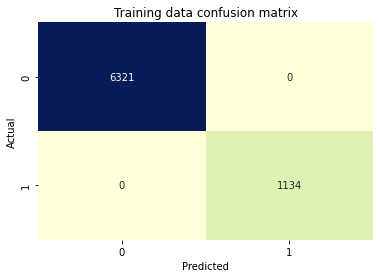

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6321
           1       1.00      1.00      1.00      1134

    accuracy                           1.00      7455
   macro avg       1.00      1.00      1.00      7455
weighted avg       1.00      1.00      1.00      7455



,Predicted : 0,Predicted : 1
Actual : 0,2703,7
Actual : 1,34,452


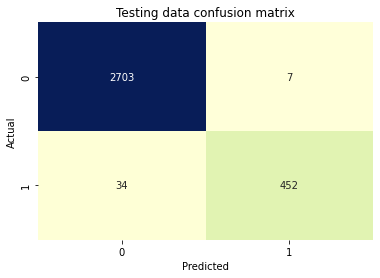

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2710
           1       0.98      0.93      0.96       486

    accuracy                           0.99      3196
   macro avg       0.99      0.96      0.97      3196
weighted avg       0.99      0.99      0.99      3196



In [ ]:
Metrics['LightGBM_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,...,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,...,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99,0.98
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,...,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86,0.93
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,...,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92,0.96
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,...,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,...,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99,0.99


#### Changing the cross-validation strategy for LightGBM model

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y1)

In [ ]:
print(X.shape)

(10651, 26)


In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 0.97479 in 0.36 seconds.

============Training fold 1============
Fold 1 finished with score: 0.94309 in 0.36 seconds.

============Training fold 2============
Fold 2 finished with score: 0.96639 in 0.37 seconds.

============Training fold 3============
Fold 3 finished with score: 0.96748 in 0.36 seconds.

============Training fold 4============
Fold 4 finished with score: 0.98261 in 0.37 seconds.

============Training fold 5============
Fold 5 finished with score: 0.96032 in 0.37 seconds.

============Training fold 6============
Fold 6 finished with score: 0.97297 in 0.36 seconds.

============Training fold 7============
Fold 7 finished with score: 0.9913 in 0.36 seconds.

============Training fold 8============
Fold 8 finished with score: 0.968 in 0.37 seconds.

============Training fold 9============
Fold 9 finished with score: 0.97458 in 0.38 seconds.

Average precision score is 0.9701525324234428


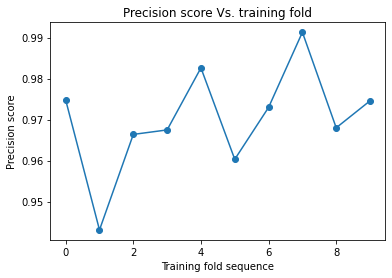

In [ ]:
#best_params
best_params = {'n_estimators': 350,'learning_rate': 0.7353353528457532,'max_depth': 4,'min_split_gain': 0.004327538741749162,'min_child_weight': 14,'min_child_samples': 25,'subsample': 0.9569658425589626,'colsample_bytree': 0.6599264514877144,'reg_lambda': 0,'reg_alpha': 0}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    lgbc = lgb.LGBMClassifier(**best_params)    
    lgbc.fit(X_train,Y_train)
    y_pred = lgbc.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7224
           1       1.00      0.99      0.99      1296

    accuracy                           1.00      8520
   macro avg       1.00      0.99      1.00      8520
weighted avg       1.00      1.00      1.00      8520



(<AxesSubplot:>, None)

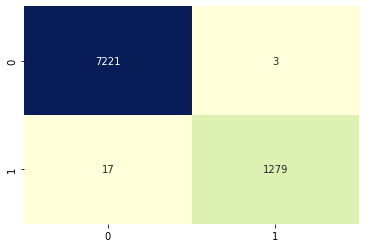

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,lgbc,'LightGBM',True)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1807
           1       0.98      0.88      0.93       324

    accuracy                           0.98      2131
   macro avg       0.98      0.94      0.96      2131
weighted avg       0.98      0.98      0.98      2131



(<AxesSubplot:>, None)

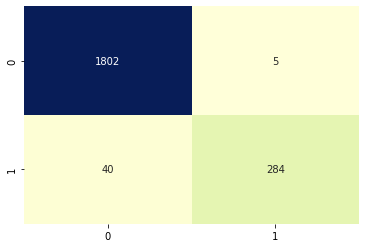

In [ ]:
checking_performance_cv(valid_X,valid_Y,lgbc,'LightGBM',False)

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned,LightGBM_cv_updated_train,LightGBM_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99,0.98,1.00,0.98
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86,0.93,0.99,0.88
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92,0.96,0.99,0.93
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00,1.00,1.00,0.99
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99,0.99,1.00,0.97


#### Feature selection on LightGBM model

In [ ]:
sfs = SequentialFeatureSelector(lgbc,k_features=26,forward=True,scoring="average_precision",cv=10)

In [ ]:
sfs.fit(X,Y)

SequentialFeatureSelector(cv=10,
                          estimator=LGBMClassifier(colsample_bytree=0.6599264514877144,
                                                   learning_rate=0.7353353528457532,
                                                   max_depth=4,
                                                   min_child_samples=25,
                                                   min_child_weight=14,
                                                   min_split_gain=0.004327538741749162,
                                                   n_estimators=350,
                                                   reg_alpha=0, reg_lambda=0,
                                                   subsample=0.9569658425589626),
                          k_features=26, scoring='average_precision')

In [ ]:
# sfs.subsets_

In [ ]:
# LightGBM_features=pd.DataFrame(data=sfs.subsets_).T
# LightGBM_features.to_csv('LightGBM_features.csv')

In [ ]:
# from google.colab import files
# files.download('LightGBM_features.csv')

In [ ]:
LightGBM_features = pd.read_csv('/content/gdrive/MyDrive/Social Media_Tourism_Project/LightGBM_features.csv')

In [ ]:
lgb_final_features = ['yearly_avg_Outstation_checkins','total_likes_on_outstation_checkin_given','Yearly_avg_view_on_travel_page','total_likes_on_outofstation_checkin_received','week_since_last_outstation_checkin','travelling_network_rating','Adult_flag']

In [ ]:
len(lgb_final_features)

7

In [ ]:
X = X[lgb_final_features]

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.1,random_state=0,stratify=Y)

In [ ]:
import xgboost as xgb

============Training fold 0============
Fold 0 finished with score: 1.0 in 1.18 seconds.

============Training fold 1============
Fold 1 finished with score: 0.97241 in 1.14 seconds.

============Training fold 2============
Fold 2 finished with score: 0.98561 in 1.14 seconds.

============Training fold 3============
Fold 3 finished with score: 0.98592 in 1.92 seconds.

============Training fold 4============
Fold 4 finished with score: 1.0 in 2.35 seconds.

============Training fold 5============
Fold 5 finished with score: 0.97857 in 1.87 seconds.

============Training fold 6============
Fold 6 finished with score: 1.0 in 1.13 seconds.

============Training fold 7============
Fold 7 finished with score: 0.99281 in 1.16 seconds.

============Training fold 8============
Fold 8 finished with score: 0.98507 in 1.16 seconds.

============Training fold 9============
Fold 9 finished with score: 0.9726 in 1.15 seconds.

Average precision score is 0.9872995347411374


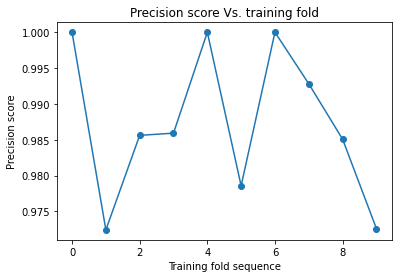

In [ ]:
#best_params
best_params = dict3
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    lgbc_cv = lgb.LGBMClassifier(**best_params)
    lgbc_cv.fit(X_train,Y_train)
    y_pred = lgbc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y,valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8127
           1       1.00      0.99      1.00      1458

    accuracy                           1.00      9585
   macro avg       1.00      1.00      1.00      9585
weighted avg       1.00      1.00      1.00      9585



(<AxesSubplot:>, None)

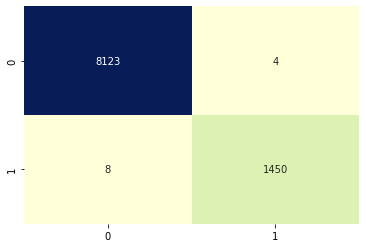

In [ ]:
checking_performance_cv(X2,Y2,lgbc_cv,'LightGBM_0.1_tuned_7_features',True)

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       904
           1       0.97      0.91      0.94       162

    accuracy                           0.98      1066
   macro avg       0.98      0.95      0.96      1066
weighted avg       0.98      0.98      0.98      1066



(<AxesSubplot:>, None)

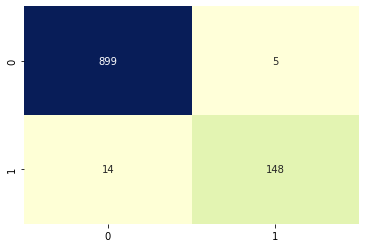

In [ ]:
checking_performance_cv(valid_X,valid_Y,lgbc_cv,'LightGBM_0.1_tuned_7_features',False)

In [ ]:
Metrics.T

,Precision,Recall,F1-score,AUROC,AUPRC
Decision_tree_not_tuned,0.900000,0.900000,0.900000,0.940000,0.820000
Decision_tree_tuned,0.660000,0.200000,0.310000,0.750000,0.380000
Decision_tree_0.2_tuned_cv_updated_train,0.670000,0.200000,0.310000,0.770000,0.390000
Decision_tree_0.2_tuned_cv_updated_test,0.690000,0.190000,0.290000,0.770000,0.390000
decision_tree_0.1_tuned_4_features_cv_updated_train,0.680000,0.200000,0.310000,0.750000,0.380000
decision_tree_0.1_tuned_4_features_cv_updated_test,0.680000,0.190000,0.290000,0.720000,0.360000
Random_forest_not_tuned,0.340000,0.730000,0.460000,0.800000,0.490000
Random_forest_tuned,0.310000,0.630000,0.420000,0.780000,0.470000
random_forest_tuned_cv_updated_train,0.370000,0.770000,0.500000,0.840000,0.560000
random_forest_tuned_cv_updated_test,0.360000,0.760000,0.490000,0.840000,0.550000


### Model #8 : CatBoost

#### Creating the pool object on non one-hot encoded dataset but it was not used

In [ ]:
# cat_col1=Mobile.select_dtypes(exclude=[np.number]).columns.tolist()
# cont_col1=Mobile.select_dtypes(include=[np.number]).columns.tolist()

In [ ]:
# X1 = Mobile.drop('buy',axis=1)
# Y1 = Mobile['buy']

In [ ]:
# X1_train,X1_test,Y1_train,Y1_test = train_test_split(X1,Y1,test_size=0.3,random_state=1,stratify=Y1)

In [ ]:
# pool_train = Pool(X1_train,Y1_train,cat_features=cat_col1)
# pool_test = Pool(X1_test,Y1_test,cat_features=cat_col1)

#### Creating the CatBoost model object and fitting it on one-hot encoded training dataset

In [ ]:
X = data.drop('buy',axis=1)
Y = data['buy']

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.3,random_state=1,stratify=Y)

In [ ]:
# cbc.fit(pool_train,eval_set=pool_test,verbose=False)

In [ ]:
import catboost as cb

In [ ]:
from catboost import Pool

In [ ]:
cbc = cb.CatBoostClassifier()

In [ ]:
cbc.fit(X_train,Y_train,verbose=False)

#### Predictions on CatBoost classifier

In [ ]:
train_pred = cbc.predict(X_train)
test_pred = cbc.predict(X_test)

In [ ]:
train_prob=cbc.predict_proba(X_train)
test_prob=cbc.predict_proba(X_test)

#### Performance metrices for CatBoost classifier

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,72,1062


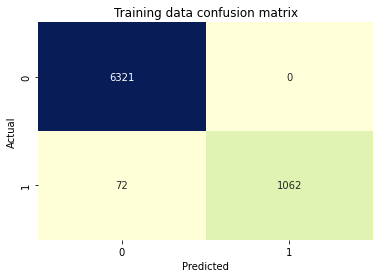

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y1_train,train_pred))

              precision    recall  f1-score   support

           0       0.85      0.86      0.85      6321
           1       0.16      0.15      0.15      1134

    accuracy                           0.75      7455
   macro avg       0.50      0.50      0.50      7455
weighted avg       0.74      0.75      0.75      7455



,Predicted : 0,Predicted : 1
Actual : 0,2704,6
Actual : 1,90,396


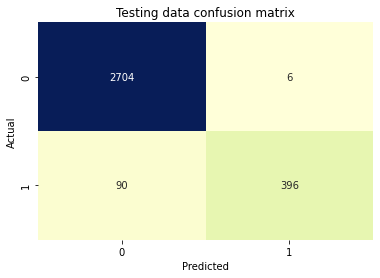

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y1_test,test_pred))

              precision    recall  f1-score   support

           0       0.85      0.87      0.86      2710
           1       0.15      0.13      0.14       486

    accuracy                           0.76      3196
   macro avg       0.50      0.50      0.50      3196
weighted avg       0.74      0.76      0.75      3196



In [ ]:
Metrics['Catboost_not_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))

In [ ]:
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned,LightGBM_cv_updated_train,LightGBM_cv_updated_test,LightGBM_0.1_tuned_7_features_cv_updated_train,LightGBM_0.1_tuned_7_features_cv_updated_test,Catboost_not_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99,0.98,1.00,0.98,1.00,0.97,0.99
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86,0.93,0.99,0.88,0.99,0.91,0.81
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92,0.96,0.99,0.93,1.00,0.94,0.89
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00,1.00,1.00,0.99,1.00,1.00,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99,0.99,1.00,0.97,1.00,0.98,0.98


#### Hyperparameter tuning on CatBoost classifier

In [ ]:
# def objective(trial):
#     train_x, valid_x, train_y, valid_y = train_test_split(X1,Y1, test_size=0.3,stratify=Y1)
#     cv_scores=[]

#     param = {
#         "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
#         "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
#         "depth": trial.suggest_int("depth", 1, 12),
#         "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
#         "bootstrap_type": trial.suggest_categorical(
#             "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
#         ),
#         "used_ram_limit": "3gb",
#     }

#     if param["bootstrap_type"] == "Bayesian":
#         param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
#     elif param["bootstrap_type"] == "Bernoulli":
#         param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

#     for (train_idx,test_idx) in (skf.split(X1,Y1)):
#       X1_train,Y1_train = X1.iloc[train_idx],Y1.iloc[train_idx]
#       X1_test,Y1_test = X1.iloc[test_idx],Y1.iloc[test_idx]
#       gbm = cb.CatBoostClassifier(**param)
#       pool_train = Pool(train_x,train_y,cat_features=cat_col1)
#       pool_test = Pool(valid_x,valid_y,cat_features=cat_col1)
#       gbm.fit(pool_train, eval_set=pool_test, verbose=0, early_stopping_rounds=100)
#       preds = gbm.predict(X1_test)
#       precision=metrics.precision_score(Y1_test,preds)
#       cv_scores.append(precision)
#     return np.mean(cv_scores)

In [ ]:
# study_cbc = optuna.create_study(direction="maximize",study_name="rmse-min")

In [ ]:
# study_cbc.optimize(objective,n_trials=30)

In [ ]:
# study_cbc.best_value

In [ ]:
# study_cbc.best_params
dict2 = {'objective': 'CrossEntropy','colsample_bylevel': 0.09991714086444933,'depth': 9,'boosting_type': 'Plain','bootstrap_type': 'MVS'}

In [ ]:
best_cbc = cb.CatBoostClassifier(**dict2)

In [ ]:
best_cbc.fit(X_train,Y_train,verbose=False)

#### Predictions on tuned CatBoost classifier

In [ ]:
train_pred = best_cbc.predict(X_train)
test_pred = best_cbc.predict(X_test)

In [ ]:
train_prob=best_cbc.predict_proba(X_train)
test_prob=best_cbc.predict_proba(X_test)

#### Performance metrices for tuned CatBoost classifier

In [ ]:
def plot_confusion_matrix(y_true,y_pred,Train,Test):
    if Train=='Yes':
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Training data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm
    else:
        sns.heatmap(confusion_matrix(y_true,y_pred),annot=True,fmt="d",cbar=False,cmap="YlGnBu")
        plt.ylabel("Actual")
        plt.xlabel("Predicted")
        plt.title("Testing data confusion matrix")
        df_cm = pd.DataFrame(data=confusion_matrix(y_true,y_pred),columns = ["Predicted : 0","Predicted : 1"],index=["Actual : 0","Actual : 1"])
        return df_cm

,Predicted : 0,Predicted : 1
Actual : 0,6321,0
Actual : 1,35,1099


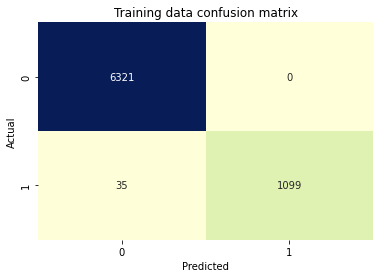

In [ ]:
plot_confusion_matrix(Y_train,train_pred,'Yes',None)

In [ ]:
print(classification_report(Y_train,train_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      6321
           1       1.00      0.97      0.98      1134

    accuracy                           1.00      7455
   macro avg       1.00      0.98      0.99      7455
weighted avg       1.00      1.00      1.00      7455



,Predicted : 0,Predicted : 1
Actual : 0,2706,4
Actual : 1,82,404


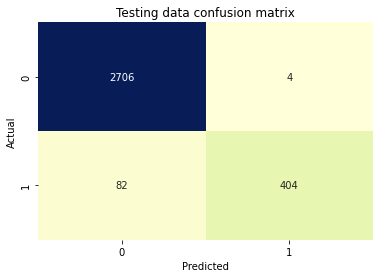

In [ ]:
plot_confusion_matrix(Y_test,test_pred,None,'Yes')

In [ ]:
print(classification_report(Y_test,test_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      2710
           1       0.99      0.83      0.90       486

    accuracy                           0.97      3196
   macro avg       0.98      0.91      0.94      3196
weighted avg       0.97      0.97      0.97      3196



In [ ]:
Metrics['CatBoost_tuned'] = [metrics.precision_score(Y_test,test_pred),metrics.recall_score(Y_test,test_pred),metrics.f1_score(Y_test,test_pred),metrics.roc_auc_score(Y_test,test_prob[:,1]),metrics.average_precision_score(Y_test,test_prob[:,1])]

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned,LightGBM_cv_updated_train,LightGBM_cv_updated_test,LightGBM_0.1_tuned_7_features_cv_updated_train,LightGBM_0.1_tuned_7_features_cv_updated_test,Catboost_not_tuned,CatBoost_tuned
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99,0.98,1.00,0.98,1.00,0.97,0.99,0.99
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86,0.93,0.99,0.88,0.99,0.91,0.81,0.83
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92,0.96,0.99,0.93,1.00,0.94,0.89,0.90
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00,1.00,1.00,0.99,1.00,1.00,1.00,1.00
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99,0.99,1.00,0.97,1.00,0.98,0.98,0.99


#### Changing the cross-validation strategy for CatBoost Classifier

In [ ]:
#X and Y dataset
from sklearn.model_selection import train_test_split

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.2,random_state=0,stratify=Y)

In [ ]:
skf = StratifiedKFold(n_splits=10)

============Training fold 0============
Fold 0 finished with score: 1.0 in 3.79 seconds.

============Training fold 1============
Fold 1 finished with score: 0.99091 in 4.76 seconds.

============Training fold 2============
Fold 2 finished with score: 1.0 in 4.05 seconds.

============Training fold 3============
Fold 3 finished with score: 1.0 in 3.85 seconds.

============Training fold 4============
Fold 4 finished with score: 0.99048 in 3.84 seconds.

============Training fold 5============
Fold 5 finished with score: 0.98291 in 3.91 seconds.

============Training fold 6============
Fold 6 finished with score: 0.99048 in 7.35 seconds.

============Training fold 7============
Fold 7 finished with score: 1.0 in 5.9 seconds.

============Training fold 8============
Fold 8 finished with score: 1.0 in 3.9 seconds.

============Training fold 9============
Fold 9 finished with score: 0.99115 in 3.78 seconds.

Average precision score is 0.9945917897245332


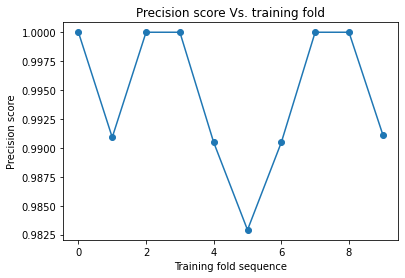

In [ ]:
#best_params
best_params = {'objective': 'CrossEntropy','colsample_bylevel': 0.09991714086444933,'depth': 9,'boosting_type': 'Plain','bootstrap_type': 'MVS'}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
#     pool_train = Pool(X_train,Y_train,cat_features=cat_col1)
#     pool_test = Pool(X_test,Y_test,cat_features=cat_col1)
    cbc=cb.CatBoostClassifier(**best_params)    
    cbc.fit(X_train,Y_train,verbose=False)
    y_pred = cbc.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      7224
           1       1.00      0.97      0.98      1296

    accuracy                           0.99      8520
   macro avg       1.00      0.98      0.99      8520
weighted avg       0.99      0.99      0.99      8520



(<AxesSubplot:>, None)

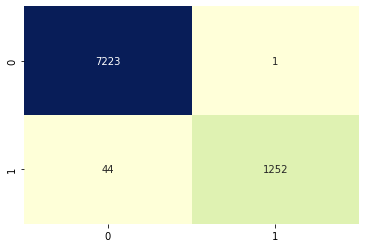

In [ ]:
##Checking the performance on the hold-out set
checking_performance_cv(X2,Y2,cbc,'CatBoost',True)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1807
           1       0.99      0.81      0.89       324

    accuracy                           0.97      2131
   macro avg       0.98      0.91      0.94      2131
weighted avg       0.97      0.97      0.97      2131



(<AxesSubplot:>, None)

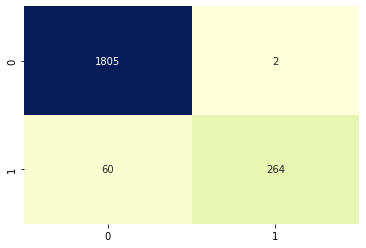

In [ ]:
checking_performance_cv(valid_X,valid_Y,cbc,'CatBoost',False)

In [ ]:
pd.set_option('display.max_columns',None)

In [ ]:
Metrics = Metrics.apply(lambda x:np.round(x,2))
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned,LightGBM_cv_updated_train,LightGBM_cv_updated_test,LightGBM_0.1_tuned_7_features_cv_updated_train,LightGBM_0.1_tuned_7_features_cv_updated_test,Catboost_not_tuned,CatBoost_tuned,CatBoost_cv_updated_train,CatBoost_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99,0.98,1.00,0.98,1.00,0.97,0.99,0.99,1.00,0.99
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86,0.93,0.99,0.88,0.99,0.91,0.81,0.83,0.97,0.81
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92,0.96,0.99,0.93,1.00,0.94,0.89,0.90,0.98,0.89
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00,1.00,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99,0.99,1.00,0.97,1.00,0.98,0.98,0.99,1.00,0.98


In [ ]:
Metrics

,Decision_tree_not_tuned,Decision_tree_tuned,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,Random_forest_not_tuned,Random_forest_tuned,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,Logistic_regression,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_boosting_not_tuned,Gradient_boosting_tuned,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_not_tuned,XGBoost_tuned,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,Support_vector_not_tuned,SVM_tuned,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned,LightGBM_cv_updated_train,LightGBM_cv_updated_test,LightGBM_0.1_tuned_7_features_cv_updated_train,LightGBM_0.1_tuned_7_features_cv_updated_test,Catboost_not_tuned,CatBoost_tuned,CatBoost_cv_updated_train,CatBoost_cv_updated_test
Precision,0.90,0.66,0.67,0.69,0.68,0.68,0.34,0.31,0.37,0.36,0.38,0.36,0.26,0.22,0.22,0.30,0.31,0.85,0.97,0.99,0.96,0.99,0.96,0.98,0.97,1.00,1.00,1.00,0.96,0.20,1.00,1.00,1.00,0.99,0.98,1.00,0.98,1.00,0.97,0.99,0.99,1.00,0.99
Recall,0.90,0.20,0.20,0.19,0.20,0.19,0.73,0.63,0.77,0.76,0.77,0.77,0.55,0.60,0.64,0.76,0.80,0.40,0.83,0.96,0.80,0.95,0.82,0.97,0.93,0.99,0.91,0.98,0.86,0.69,0.16,0.92,0.17,0.86,0.93,0.99,0.88,0.99,0.91,0.81,0.83,0.97,0.81
F1-score,0.90,0.31,0.31,0.29,0.31,0.29,0.46,0.42,0.50,0.49,0.51,0.49,0.35,0.32,0.33,0.43,0.44,0.54,0.89,0.98,0.87,0.97,0.89,0.98,0.95,1.00,0.95,0.99,0.91,0.31,0.27,0.96,0.29,0.92,0.96,0.99,0.93,1.00,0.94,0.89,0.90,0.98,0.89
AUROC,0.94,0.75,0.77,0.77,0.75,0.72,0.80,0.78,0.84,0.84,0.86,0.85,0.67,0.64,0.65,0.78,0.79,0.90,0.99,1.00,0.98,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99,0.66,0.71,1.00,0.71,1.00,1.00,1.00,0.99,1.00,1.00,1.00,1.00,1.00,0.99
AUPRC,0.82,0.38,0.39,0.39,0.38,0.36,0.49,0.47,0.56,0.55,0.58,0.57,0.23,0.22,0.22,0.47,0.48,0.72,0.97,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.99,1.00,0.95,0.29,0.38,0.98,0.38,0.99,0.99,1.00,0.97,1.00,0.98,0.98,0.99,1.00,0.98


In [ ]:
cv=Metrics[Metrics.columns[Metrics.columns.str.contains('cv_updated')]]
cv

,Decision_tree_0.2_tuned_cv_updated_train,Decision_tree_0.2_tuned_cv_updated_test,decision_tree_0.1_tuned_4_features_cv_updated_train,decision_tree_0.1_tuned_4_features_cv_updated_test,random_forest_tuned_cv_updated_train,random_forest_tuned_cv_updated_test,Random_Forest_0.1_tuned_12_features_cv_updated_train,Random_Forest_0.1_tuned_12_features_cv_updated_test,logistic_regression_cv_updated_train,logistic_regression_cv_updated_test,lr_0.1_tuned_7_features_cv_updated_train,lr_0.1_tuned_7_features_cv_updated_test,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,Gradient_boosting_0.1_tuned_8_features_cv_updated_train,Gradient_boosting_0.1_tuned_8_features_cv_updated_test,XGBoost_cv_updated_train,XGBoost_cv_updated_test,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_train,Xtreme_Gradient_boosting_0.1_tuned_5_features_cv_updated_test,SVM_cv_updated_train,SVM_cv_updated_test,LightGBM_cv_updated_train,LightGBM_cv_updated_test,LightGBM_0.1_tuned_7_features_cv_updated_train,LightGBM_0.1_tuned_7_features_cv_updated_test,CatBoost_cv_updated_train,CatBoost_cv_updated_test
Precision,0.67,0.69,0.68,0.68,0.37,0.36,0.38,0.36,0.22,0.22,0.30,0.31,0.99,0.96,0.99,0.96,1.00,1.00,1.00,0.96,1.00,1.00,1.00,0.98,1.00,0.97,1.00,0.99
Recall,0.20,0.19,0.20,0.19,0.77,0.76,0.77,0.77,0.60,0.64,0.76,0.80,0.96,0.80,0.95,0.82,0.99,0.91,0.98,0.86,0.92,0.17,0.99,0.88,0.99,0.91,0.97,0.81
F1-score,0.31,0.29,0.31,0.29,0.50,0.49,0.51,0.49,0.32,0.33,0.43,0.44,0.98,0.87,0.97,0.89,1.00,0.95,0.99,0.91,0.96,0.29,0.99,0.93,1.00,0.94,0.98,0.89
AUROC,0.77,0.77,0.75,0.72,0.84,0.84,0.86,0.85,0.64,0.65,0.78,0.79,1.00,0.98,1.00,0.99,1.00,1.00,1.00,0.99,1.00,0.71,1.00,0.99,1.00,1.00,1.00,0.99
AUPRC,0.39,0.39,0.38,0.36,0.56,0.55,0.58,0.57,0.22,0.22,0.47,0.48,1.00,0.95,0.99,0.96,1.00,0.99,1.00,0.95,0.98,0.38,1.00,0.97,1.00,0.98,1.00,0.98


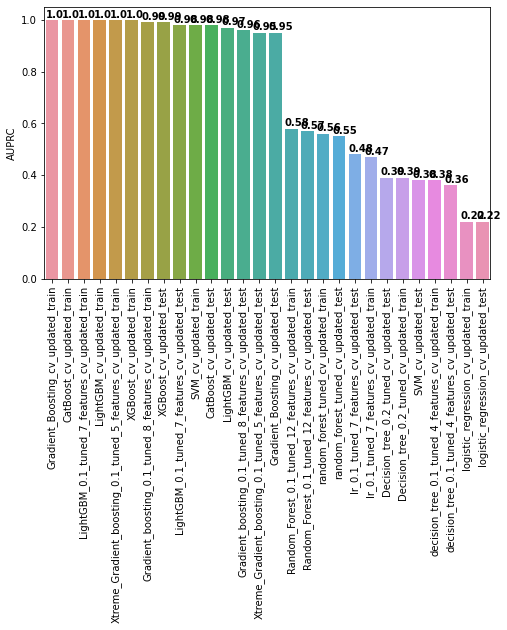

In [ ]:
fig,axes = plt.subplots(figsize=(8,5))
sns.barplot(x=cv.columns,y=cv.loc['AUPRC',:],order=cv.loc['AUPRC',:].sort_values(ascending=False).index)
for (i,j) in enumerate(cv.loc['AUPRC',:].sort_values(ascending=False).values):
    plt.text(x=i-0.4,y=j+0.01,s=j,color="black",fontsize=10,fontweight="bold")
plt.xticks(rotation=90)
plt.show()

In [ ]:
s1 = ['Gradient_Boosting','LightGBM','CatBoost']
good_models=Metrics[Metrics.columns[Metrics.columns.str.contains('|'.join(s1))]]

In [ ]:
good_models

,Gradient_Boosting_cv_updated_train,Gradient_Boosting_cv_updated_test,LightGBM_non_encoded_not_tuned,LightGBM_tuned,LightGBM_cv_updated_train,LightGBM_cv_updated_test,LightGBM_0.1_tuned_7_features_cv_updated_train,LightGBM_0.1_tuned_7_features_cv_updated_test,CatBoost_tuned,CatBoost_cv_updated_train,CatBoost_cv_updated_test
Precision,0.99,0.96,0.99,0.98,1.00,0.98,1.00,0.97,0.99,1.00,0.99
Recall,0.96,0.80,0.86,0.93,0.99,0.88,0.99,0.91,0.83,0.97,0.81
F1-score,0.98,0.87,0.92,0.96,0.99,0.93,1.00,0.94,0.90,0.98,0.89
AUROC,1.00,0.98,1.00,1.00,1.00,0.99,1.00,1.00,1.00,1.00,0.99
AUPRC,1.00,0.95,0.99,0.99,1.00,0.97,1.00,0.98,0.99,1.00,0.98


### Assessing the features

In [ ]:
decision_tree_features.iloc[4,3]

('following_company_page',
 'Yearly_avg_comment_on_travel_page',
 'total_likes_on_outstation_checkin_given',
 'total_likes_on_outofstation_checkin_received',
 'Adult_flag')

In [ ]:
decision_tree_features.iloc[4,2]

0.4066766892769781

In [ ]:
random_forest_features.iloc[6,3]

"('following_company_page', 'yearly_avg_Outstation_checkins', 'total_likes_on_outstation_checkin_given', 'Yearly_avg_view_on_travel_page', 'total_likes_on_outofstation_checkin_received', 'travelling_network_rating', 'Adult_flag')"

In [ ]:
random_forest_features.iloc[6,2]

0.984120854796314

In [ ]:
XGBoost_features.iloc[4,4]

"('Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'yearly_avg_Outstation_checkins', 'total_likes_on_outofstation_checkin_received', 'travelling_network_rating')"

In [ ]:
XGBoost_features.iloc[6,4]

"('Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'yearly_avg_Outstation_checkins', 'total_likes_on_outofstation_checkin_received', 'following_company_page', 'travelling_network_rating', 'Adult_flag')"

In [ ]:
XGBoost_features.iloc[6,3]

0.9982491842696432

In [ ]:
LightGBM_features.iloc[4,4]

"('following_company_page', 'yearly_avg_Outstation_checkins', 'total_likes_on_outstation_checkin_given', 'Yearly_avg_view_on_travel_page', 'total_likes_on_outofstation_checkin_received')"

In [ ]:
LightGBM_features.iloc[4,3]

0.9773314185133096

### Conclusion about Model selection

In [ ]:
#XGBoost is being selected among all the models owing to its least complexity whilst being most accurate among all the models

In [ ]:
XGBoost_features.iloc[4,4]

"('Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'yearly_avg_Outstation_checkins', 'total_likes_on_outofstation_checkin_received', 'travelling_network_rating')"

In [ ]:
xgb_final_features = ['Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'yearly_avg_Outstation_checkins', 'total_likes_on_outofstation_checkin_received', 'travelling_network_rating','buy']

### Training the XGBoost model on final features

In [ ]:
df1=Mobile[xgb_final_features]

In [ ]:
df1['yearly_avg_Outstation_checkins'].describe()

count    10651.000000
mean         8.108065
std          8.673973
min          0.000000
25%          1.000000
50%          3.000000
75%         14.000000
max         29.000000
Name: yearly_avg_Outstation_checkins, dtype: float64

In [ ]:
df1.loc[:,['yearly_avg_Outstation_checkins','total_likes_on_outofstation_checkin_received']]

,yearly_avg_Outstation_checkins,total_likes_on_outofstation_checkin_received
0,1.0,5993
1,1.0,5130
2,1.0,2090
3,1.0,2909
4,1.0,3468
...,...,...
10646,5.0,9983
10647,5.0,3024
10648,6.0,10041
10649,4.0,6203


In [ ]:
X = df1.drop('buy',axis=1)
Y = df1['buy']

In [ ]:
X2,valid_X,Y2,valid_Y = train_test_split(X,Y,test_size=0.1,random_state=0,stratify=Y)

============Training fold 0============
Fold 0 finished with score: 1.0 in 1.98 seconds.

============Training fold 1============
Fold 1 finished with score: 0.99219 in 2.02 seconds.

============Training fold 2============
Fold 2 finished with score: 0.97674 in 1.99 seconds.

============Training fold 3============
Fold 3 finished with score: 0.97727 in 2.0 seconds.

============Training fold 4============
Fold 4 finished with score: 0.99219 in 1.97 seconds.

============Training fold 5============
Fold 5 finished with score: 1.0 in 2.0 seconds.

============Training fold 6============
Fold 6 finished with score: 0.992 in 1.98 seconds.

============Training fold 7============
Fold 7 finished with score: 1.0 in 1.97 seconds.

============Training fold 8============
Fold 8 finished with score: 0.99167 in 1.97 seconds.

============Training fold 9============
Fold 9 finished with score: 0.99254 in 2.97 seconds.

Average precision score is 0.9914595893418742


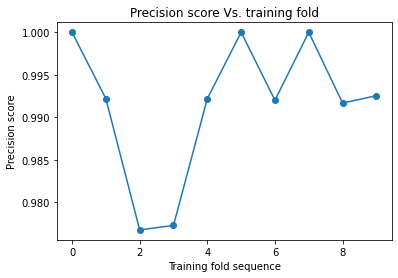

In [ ]:
#best_params
best_params = {'max_depth': 7,'min_child_weight': 1,'subsample': 0.7815313217386805,'n_estimators': 350,'learning_rate': 0.06615549649335126,'colsample_bytree': 0.7492277206661779,'colsample_bylevel': 0.6931572316515358}
precision_score = []
idx1 = []
for idx,(train_idx,test_idx) in enumerate(skf.split(X2,Y2)):
    print("="*12+"Training fold {}".format(idx)+"="*12)
    X_train,X_test = X2.iloc[train_idx,:],X2.iloc[test_idx,:]
    Y_train,Y_test = Y2.iloc[train_idx],Y2.iloc[test_idx]
    start = datetime.now()
    xgbc_cv = xgboost.XGBClassifier(**best_params)
    xgbc_cv.fit(X_train,Y_train,eval_metric='aucpr')
    y_pred = xgbc_cv.predict(X_test)
    precision=metrics.precision_score(Y_test,y_pred)
    precision_score.append(precision)
    idx1.append(idx)
    runtime = datetime.now() - start
    print("Fold {} finished with score: {} in {} seconds.\n".format(idx,np.round(precision,5),np.round(runtime.total_seconds(),2)))
Avg_precision_score = np.mean(precision_score)
print("="*24)
print("Average precision score is {}".format(Avg_precision_score))
plt.plot(idx1,precision_score,marker='o')
plt.title('Precision score Vs. training fold')
plt.xlabel('Training fold sequence')
plt.ylabel('Precision score')
plt.show()

In [ ]:
def checking_performance_cv(valid_X,valid_Y,cv_model,model_name,train):
    preds=cv_model.predict(valid_X)
    valid_X_prob=cv_model.predict_proba(valid_X)
    precision = metrics.precision_score(valid_Y,preds)
    recall = metrics.recall_score(valid_Y,preds)
    f1_score = metrics.f1_score(valid_Y,preds)
    auroc=metrics.roc_auc_score(valid_Y,valid_X_prob[:,1])
    auprc=metrics.average_precision_score(valid_Y, valid_X_prob[:,1])
    if train:
        Metrics[model_name+'_cv_updated_train'] = [precision,recall,f1_score,auroc,auprc]
    else:
        Metrics[model_name+'_cv_updated_test'] = [precision,recall,f1_score,auroc,auprc]
    return sns.heatmap(confusion_matrix(valid_Y,preds),annot=True,fmt="d",cbar=False,cmap="YlGnBu"),print(classification_report(valid_Y,preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8127
           1       1.00      0.97      0.99      1458

    accuracy                           1.00      9585
   macro avg       1.00      0.99      0.99      9585
weighted avg       1.00      1.00      1.00      9585



(<AxesSubplot:>, None)

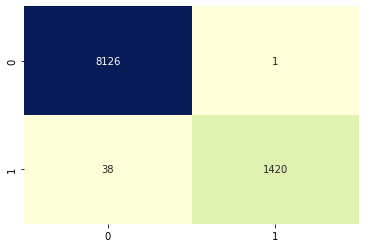

In [ ]:
checking_performance_cv(X2,Y2,xgbc_cv,'feature_engineered_0.1',True)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       904
           1       0.98      0.81      0.89       162

    accuracy                           0.97      1066
   macro avg       0.97      0.91      0.94      1066
weighted avg       0.97      0.97      0.97      1066



(<AxesSubplot:>, None)

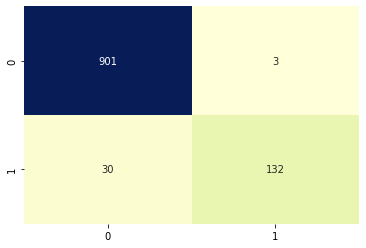

In [ ]:
checking_performance_cv(valid_X,valid_Y,xgbc_cv,'feature_engineered_0.1',False)

### Explaining the model

#### Downloading and importing the SHAP package

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 6.0 MB/s 


In [ ]:
import shap

#### SHAP bar plot

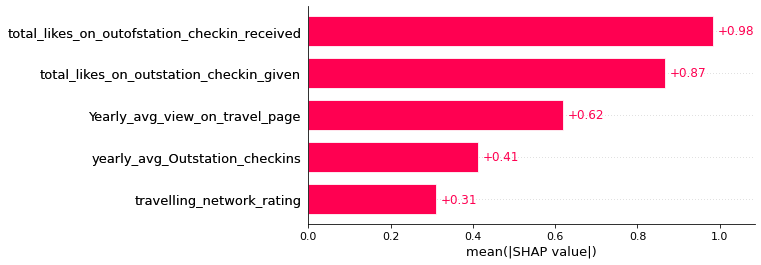

In [ ]:
#This plot provides insights into the global effect of the features the fact that total likes on outstation checkin received has 
#this highest SHAP value means this feature has the highest effect on predicting the target variable.
#In a sense this is a feature importance plot
explainer = shap.TreeExplainer(xgbc_cv)
shap_values = explainer(valid_X)
shap.plots.bar(shap_values)

#### Local bar plot

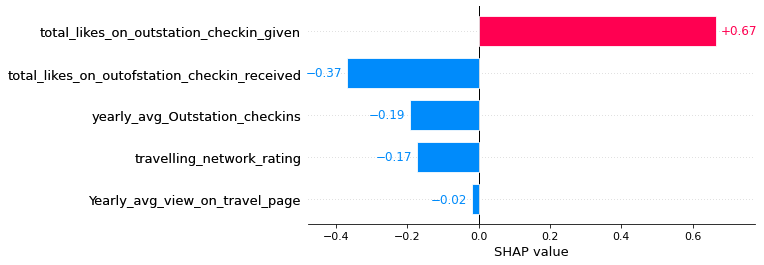

In [ ]:
#Passing a row of SHAP values to the bar plot function creates a local feature importance plot, where the bars are the SHAP values for each feature.
#SHAP values indicate the marginal effect of the feature on the final prediction. +0.67 of total likes on outstation checkin given
#indicates that this feature has increased the log odds by 0.67 which in turn means that this feature has increased the probability of this
#individual buying from us(target variable being 1)
shap.plots.bar(shap_values[1])

#### SHAP value plot

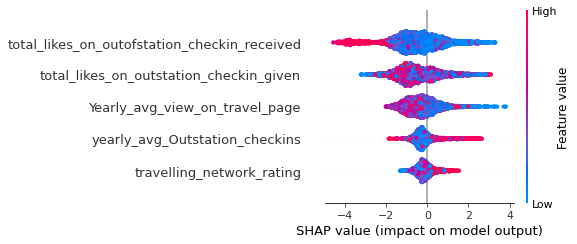

In [ ]:
shap_values = shap.TreeExplainer(xgbc_cv).shap_values(X2)
shap.summary_plot(shap_values,X2)

#### SHAP waterfall plot

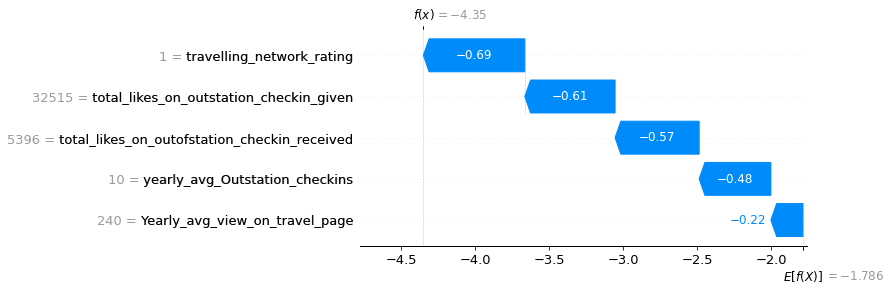

In [ ]:
shap.plots.waterfall(shap_values[0])

#### SHAP Force plot

In [ ]:
explainer = shap.TreeExplainer(xgbc_cv)
shap_values = explainer.shap_values(valid_X)

In [ ]:
#4.35 is the model's predicted value for this observation. 
#This is the "raw" value which is then transformed into probability space, to give you the final output of 0 and 1 (< 0.5 and > 0.5).
shap.initjs()
shap.force_plot(explainer.expected_value,shap_values[0,:],valid_X.iloc[0,:])

#### SHAP Partial dependence plot

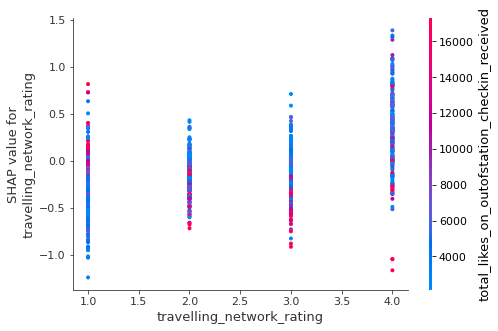

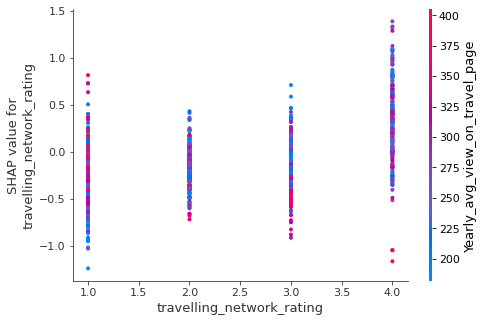

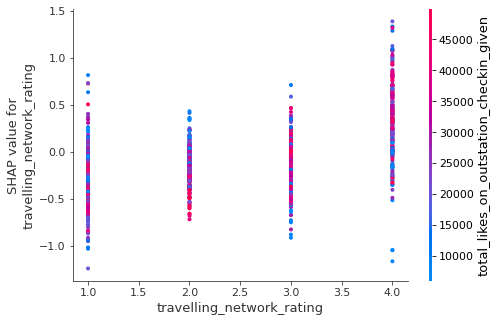

In [ ]:
inds = shap.approximate_interactions("travelling_network_rating", shap_values, valid_X)
for i in range(3):
    shap.dependence_plot("travelling_network_rating", shap_values, valid_X, interaction_index=inds[i])

In [ ]:
shap_df = pd.DataFrame(data=shap_values,columns=valid_X.columns)